In [1]:
# подключим свой аккаунт ClearML
%env CLEARML_WEB_HOST=https://app.clear.ml
%env CLEARML_API_HOST=https://api.clear.ml
%env CLEARML_FILES_HOST=https://files.clear.ml
%env CLEARML_API_ACCESS_KEY=%%%%%%%%%%%%%%%%%%%%%
%env CLEARML_API_SECRET_KEY=%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%

In [3]:
from mmdet.models.detectors.single_stage import SingleStageDetector
from mmdet.utils import ConfigType, OptConfigType, OptMultiConfig
from mmdet.registry import MODELS
from typing import Dict,  Union
import torch
from mmengine.runner import Runner
from mmengine.config import Config
from mmengine.registry import HOOKS
from mmengine.hooks import Hook
from mmengine.optim import OptimWrapper
from mmdet.apis import init_detector, inference_detector
import os
from mmengine.structures import InstanceData
import json
from mmdet.registry import VISUALIZERS
import mmcv
from torchmetrics.detection.mean_ap import MeanAveragePrecision

In [4]:
# функция для преобразования координат ограничивающих рамок
def xywh_to_xyxy(box):
    x0, y0, w, h = box
    return (x0, y0, x0 + w, y0 + h)

In [5]:
# Сделаем хук для сбора лоссов с тренировочной и валидационной выборок
@HOOKS.register_module()
class CollectMetricsHook_YOLOX(Hook):


    def after_train_epoch(self, runner) -> None:
        
        iters = runner.train_loop.max_iters / runner.train_loop.max_epochs
        full_loss = runner.model.full_loss / iters
        loss_bbox = runner.model.loss_bbox / iters
        loss_cls = runner.model.loss_cls / iters
        loss_obj = runner.model.loss_obj / iters
        
        runner.message_hub.update_scalar('val/train/loss', full_loss)
        runner.message_hub.update_scalar('val/train/loss_obj', loss_obj)
        runner.message_hub.update_scalar('val/train/loss_cls', loss_cls)
        runner.message_hub.update_scalar('val/train/loss_bbox', loss_bbox)
        
        runner.model.full_loss = 0
        runner.model.loss_bbox = 0
        runner.model.loss_cls = 0
        runner.model.loss_obj = 0


    def after_val_iter(self, runner, batch_idx, data_batch=None, outputs=None):
        
        with runner.optim_wrapper.optim_context(self):
            data = runner.model.data_preprocessor(data_batch, True)
            losses = runner.model._run_forward(data, mode='loss')
            _, log_vars = runner.model.parse_losses(losses)

        runner.message_hub.update_scalar('val/val/loss', log_vars['loss'].cpu().item())
        runner.message_hub.update_scalar('val/val/loss_obj', log_vars['loss_obj'].cpu().item())
        runner.message_hub.update_scalar('val/val/loss_cls', log_vars['loss_cls'].cpu().item())
        runner.message_hub.update_scalar('val/val/loss_bbox', log_vars['loss_bbox'].cpu().item())


In [6]:
# Модифицируем модель для сбора метрик
@MODELS.register_module()
class YOLOX_custom(SingleStageDetector):
    r"""Implementation of `YOLOX: Exceeding YOLO Series in 2021
    <https://arxiv.org/abs/2107.08430>`_

    Args:
        backbone (:obj:`ConfigDict` or dict): The backbone config.
        neck (:obj:`ConfigDict` or dict): The neck config.
        bbox_head (:obj:`ConfigDict` or dict): The bbox head config.
        train_cfg (:obj:`ConfigDict` or dict, optional): The training config
            of YOLOX. Defaults to None.
        test_cfg (:obj:`ConfigDict` or dict, optional): The testing config
            of YOLOX. Defaults to None.
        data_preprocessor (:obj:`ConfigDict` or dict, optional): Config of
            :class:`DetDataPreprocessor` to process the input data.
            Defaults to None.
        init_cfg (:obj:`ConfigDict` or list[:obj:`ConfigDict`] or dict or
            list[dict], optional): Initialization config dict.
            Defaults to None.
    """

    def __init__(self,
                 backbone: ConfigType,
                 neck: ConfigType,
                 bbox_head: ConfigType,
                 train_cfg: OptConfigType = None,
                 test_cfg: OptConfigType = None,
                 data_preprocessor: OptConfigType = None,
                 init_cfg: OptMultiConfig = None) -> None:
        super().__init__(
            backbone=backbone,
            neck=neck,
            bbox_head=bbox_head,
            train_cfg=train_cfg,
            test_cfg=test_cfg,
            data_preprocessor=data_preprocessor,
            init_cfg=init_cfg)
        
        self.full_loss = 0
        self.loss_bbox = 0
        self.loss_cls = 0
        self.loss_obj = 0
        
    def train_step(self, data: Union[dict, tuple, list],
                    optim_wrapper: OptimWrapper) -> Dict[str, torch.Tensor]:
        """Implements the default model training process including
        preprocessing, model forward propagation, loss calculation,
        optimization, and back-propagation.

        During non-distributed training. If subclasses do not override the
        :meth:`train_step`, :class:`EpochBasedTrainLoop` or
        :class:`IterBasedTrainLoop` will call this method to update model
        parameters. The default parameter update process is as follows:

        1. Calls ``self.data_processor(data, training=False)`` to collect
            batch_inputs and corresponding data_samples(labels).
        2. Calls ``self(batch_inputs, data_samples, mode='loss')`` to get raw
            loss
        3. Calls ``self.parse_losses`` to get ``parsed_losses`` tensor used to
            backward and dict of loss tensor used to log messages.
        4. Calls ``optim_wrapper.update_params(loss)`` to update model.

        Args:
            data (dict or tuple or list): Data sampled from dataset.
            optim_wrapper (OptimWrapper): OptimWrapper instance
                used to update model parameters.

        Returns:
            Dict[str, torch.Tensor]: A ``dict`` of tensor for logging.
        """
        # Enable automatic mixed precision training context.
        with optim_wrapper.optim_context(self):
            data = self.data_preprocessor(data, True)
            losses = self._run_forward(data, mode='loss')  # type: ignore
        parsed_losses, log_vars = self.parse_losses(losses)  # type: ignore
        optim_wrapper.update_params(parsed_losses)
        
        self.full_loss += log_vars['loss'].item()
        self.loss_bbox += log_vars['loss_bbox'].item()
        self.loss_cls += log_vars['loss_cls'].item()
        self.loss_obj += log_vars['loss_obj'].item()
        
        return log_vars

In [6]:
# Загрузим конфигурационный файл предобученной модели YoloX маленького размера
# для экономии ресурсов, предоставляемый библиотекой mmdetection
cfg = Config.fromfile('./configs/yolox/yolox_s_8xb8-300e_coco.py')

In [7]:
# Преобразуем конфигурационный файл под нашу задачу
interval = 1 # интервал валидации

max_epoch = 500

# исходная модель обучалась на 8-ми gpu, снизим шаг обучения для одной
base_lr = 0.01 / 8

cfg.base_lr= base_lr
cfg.optim_wrapper.optimizer.lr = base_lr
cfg.max_epoch = max_epoch
cfg.train_cfg = dict(type='EpochBasedTrainLoop', max_epochs=max_epoch, val_interval=interval)
cfg.interval = interval

# папка для хранения результатов
cfg.work_dir = 'work_dirs/yolox_custom/train_lr'

 # подключим ClaerML для визуализации
cfg.visualizer=dict(
    name='visualizer', 
    type='DetLocalVisualizer', 
    vis_backends=[dict(type='ClearMLVisBackend')])

# поключим наш хук для сбора лоссов
cfg.custom_hooks.append(dict(type='CollectMetricsHook_YOLOX'))

# подключим нашу модифицированную модель
cfg.model.type = 'YOLOX_custom'

# загрузим веса нашей предобученной модели
cfg.load_from = 'checkpoints/yolox_s_8x8_300e_coco_20211121_095711-4592a793.pth'

# пропишем обработчик логов
cfg.log_processor = dict(type='LogProcessor', window_size=5, by_epoch=True)

# установим настройки для хранения чекпоинтов и лучшей подели по метрикам
cfg.default_hooks.checkpoint = dict(
        type='CheckpointHook',
        interval=interval,
        max_keep_ckpts=50,
        save_last=True,
        save_best='coco/bbox_mAP'
    )

# пропишем путь хранения датасета
data_root = 'data/masks_coco/'
cfg.data_root = data_root

# пропишем информацию о классах
metainfo = dict(                  
    classes=(
        'mask_weared_incorrect', 
        'without_mask', 
        'with_mask'
    ),
    palette=[
        (
            220,
            20,
            60,
        ),
        (
            119,
            11,
            32,
        ),
        (
            0,
            0,
            142,
        )
    ])        

# заморозка слоев не дала результатов
# cfg.model.backbone.frozen_stages = 4

# укажем наше количество классов
cfg.model.bbox_head.num_classes = 3

# пропишем настройки тренировочного датасета
cfg.train_dataset.dataset.metainfo = metainfo
cfg.train_dataset.dataset.data_root = data_root
cfg.train_dataset.dataset.ann_file = 'train.json'
cfg.train_dataset.dataset.data_prefix = dict(img='train/')

# пропишем настройки тренировочного загрузчика
cfg.train_dataloader.dataset.dataset.metainfo = metainfo
cfg.train_dataloader.dataset.dataset.data_root = data_root
cfg.train_dataloader.dataset.dataset.ann_file = 'train.json'
cfg.train_dataloader.dataset.dataset.data_prefix = dict(img='train/')
cfg.train_dataloader.batch_size = 4
cfg.train_dataloader.num_workers = 2

# пропишем настройки валидационного загрузчика
cfg.val_dataloader.batch_size = 4
cfg.val_dataloader.num_workers = 2
cfg.val_dataloader.dataset.metainfo = metainfo
cfg.val_dataloader.dataset.data_root = data_root
cfg.val_dataloader.dataset.ann_file = 'val.json'
cfg.val_dataloader.dataset.data_prefix = dict(img='val/')

# пропишем настройки тестового загрузчика
cfg.test_dataloader.batch_size = 4
cfg.test_dataloader.num_workers = 2
cfg.test_dataloader.dataset.metainfo = metainfo
cfg.test_dataloader.dataset.data_root = data_root
cfg.test_dataloader.dataset.ann_file = 'val.json'
cfg.test_dataloader.dataset.data_prefix = dict(img='val/')
# пропишем настройки валидаторов

cfg.val_evaluator.ann_file = data_root + 'val.json'
cfg.test_evaluator.ann_file = data_root + 'val.json'

# установим размер батча для автоматического изменения шага обучения
cfg.auto_scale_lr = dict(base_batch_size=4)

In [8]:
# сформируем раннер обучения
runner = Runner.from_cfg(cfg)

01/05 09:23:09 - mmengine - INFO - 
------------------------------------------------------------
System environment:
    sys.platform: linux
    Python: 3.8.18 (default, Sep 11 2023, 13:40:15) [GCC 11.2.0]
    CUDA available: True
    numpy_random_seed: 971298969
    GPU 0,1: Quadro RTX 4000
    CUDA_HOME: None
    GCC: gcc (Ubuntu 12.3.0-1ubuntu1~23.04) 12.3.0
    PyTorch: 2.0.1+cu117
    PyTorch compiling details: PyTorch built with:
  - GCC 9.3
  - C++ Version: 201703
  - Intel(R) oneAPI Math Kernel Library Version 2022.2-Product Build 20220804 for Intel(R) 64 architecture applications
  - Intel(R) MKL-DNN v2.7.3 (Git Hash 6dbeffbae1f23cbbeae17adb7b5b13f1f37c080e)
  - OpenMP 201511 (a.k.a. OpenMP 4.5)
  - LAPACK is enabled (usually provided by MKL)
  - NNPACK is enabled
  - CPU capability usage: AVX2
  - CUDA Runtime 11.7
  - NVCC architecture flags: -gencode;arch=compute_37,code=sm_37;-gencode;arch=compute_50,code=sm_50;-gencode;arch=compute_60,code=sm_60;-gencode;arch=compute_70,c

Could not read Jupyter Notebook: No module named 'nbconvert'


01/05 09:23:26 - mmengine - INFO - Distributed training is not used, all SyncBatchNorm (SyncBN) layers in the model will be automatically reverted to BatchNormXd layers if they are used.
01/05 09:23:26 - mmengine - INFO - Hooks will be executed in the following order:
before_run:
(VERY_HIGH   ) RuntimeInfoHook                    
(49          ) EMAHook                            
(BELOW_NORMAL) LoggerHook                         
 -------------------- 
after_load_checkpoint:
(49          ) EMAHook                            
 -------------------- 
before_train:
(VERY_HIGH   ) RuntimeInfoHook                    
(49          ) EMAHook                            
(NORMAL      ) IterTimerHook                      
(VERY_LOW    ) CheckpointHook                     
 -------------------- 
before_train_epoch:
(VERY_HIGH   ) RuntimeInfoHook                    
(48          ) YOLOXModeSwitchHook                
(NORMAL      ) IterTimerHook                      
(NORMAL      ) DistSamplerSeedHo

In [9]:
# обучим модель
runner.train()

loading annotations into memory...
Done (t=0.01s)
creating index...
index created!
01/05 09:23:28 - mmengine - INFO - paramwise_options -- backbone.stem.conv.bn.weight:weight_decay=0.0
01/05 09:23:28 - mmengine - INFO - paramwise_options -- backbone.stem.conv.bn.bias:weight_decay=0.0
01/05 09:23:28 - mmengine - INFO - paramwise_options -- backbone.stage1.0.bn.weight:weight_decay=0.0
01/05 09:23:28 - mmengine - INFO - paramwise_options -- backbone.stage1.0.bn.bias:weight_decay=0.0
01/05 09:23:28 - mmengine - INFO - paramwise_options -- backbone.stage1.1.main_conv.bn.weight:weight_decay=0.0
01/05 09:23:28 - mmengine - INFO - paramwise_options -- backbone.stage1.1.main_conv.bn.bias:weight_decay=0.0
01/05 09:23:28 - mmengine - INFO - paramwise_options -- backbone.stage1.1.short_conv.bn.weight:weight_decay=0.0
01/05 09:23:28 - mmengine - INFO - paramwise_options -- backbone.stage1.1.short_conv.bn.bias:weight_decay=0.0
01/05 09:23:28 - mmengine - INFO - paramwise_options -- backbone.stage1.1

/home/mchdai/miniconda3/envs/openmmlab/lib/python3.8/site-packages/torch/functional.py:504: UserWarning:

torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3483.)



01/05 09:23:45 - mmengine - INFO - Epoch(train)   [1][ 50/171]  base_lr: 4.2748e-06 lr: 4.2748e-06  eta: 4:35:14  time: 0.1742  data_time: 0.0052  memory: 3026  loss: 11.1442  loss_cls: 1.6246  loss_bbox: 3.3549  loss_obj: 6.1647


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 09:23:53 - mmengine - INFO - Epoch(train)   [1][100/171]  base_lr: 1.7099e-05 lr: 1.7099e-05  eta: 4:16:23  time: 0.1967  data_time: 0.0066  memory: 3219  loss: 7.5730  loss_cls: 1.2900  loss_bbox: 2.7667  loss_obj: 3.5163


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 09:24:01 - mmengine - INFO - Epoch(train)   [1][150/171]  base_lr: 3.8473e-05 lr: 3.8473e-05  eta: 4:08:30  time: 0.1973  data_time: 0.0064  memory: 3186  loss: 5.8015  loss_cls: 0.9745  loss_bbox: 2.4768  loss_obj: 2.3501
01/05 09:24:05 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 09:24:05 - mmengine - INFO - Saving checkpoint at 1 epochs
01/05 09:24:10 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.01s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=1.73s).
Accumulating evaluation results...
DONE (t=0.11s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.185
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.410
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.140
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.181
 Average Precision  (AP) @[ IoU=0

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 09:24:29 - mmengine - INFO - Epoch(train)   [2][ 50/171]  base_lr: 8.3515e-05 lr: 8.3515e-05  eta: 4:39:35  time: 0.2653  data_time: 0.0532  memory: 3193  loss: 4.3206  loss_cls: 0.8194  loss_bbox: 2.0772  loss_obj: 1.4241
01/05 09:24:39 - mmengine - INFO - Epoch(train)   [2][100/171]  base_lr: 1.2558e-04 lr: 1.2558e-04  eta: 4:38:54  time: 0.1721  data_time: 0.0313  memory: 3193  loss: 4.2722  loss_cls: 0.7820  loss_bbox: 2.1108  loss_obj: 1.3793
01/05 09:24:47 - mmengine - INFO - Epoch(train)   [2][150/171]  base_lr: 1.7619e-04 lr: 1.7619e-04  eta: 4:31:07  time: 0.1766  data_time: 0.0667  memory: 3194  loss: 4.2552  loss_cls: 0.7430  loss_bbox: 2.1135  loss_obj: 1.3987


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 09:24:50 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 09:24:50 - mmengine - INFO - Saving checkpoint at 2 epochs
01/05 09:24:55 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.95s).
Accumulating evaluation results...
DONE (t=0.10s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.300
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.553
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.305
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.282
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.346
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.536
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.462
 Average Recall     

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 09:25:08 - mmengine - INFO - Epoch(train)   [3][ 50/171]  base_lr: 2.6275e-04 lr: 2.6275e-04  eta: 4:26:44  time: 0.1759  data_time: 0.0074  memory: 3196  loss: 3.9614  loss_cls: 0.7374  loss_bbox: 1.8418  loss_obj: 1.3822


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 09:25:17 - mmengine - INFO - Epoch(train)   [3][100/171]  base_lr: 3.3406e-04 lr: 3.3406e-04  eta: 4:25:29  time: 0.3201  data_time: 0.1173  memory: 3165  loss: 4.4103  loss_cls: 0.7560  loss_bbox: 2.1570  loss_obj: 1.4973
01/05 09:25:31 - mmengine - INFO - Epoch(train)   [3][150/171]  base_lr: 4.1391e-04 lr: 4.1391e-04  eta: 4:38:03  time: 0.2744  data_time: 0.1201  memory: 3182  loss: 4.4353  loss_cls: 0.7981  loss_bbox: 2.0671  loss_obj: 1.5701
01/05 09:25:34 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 09:25:34 - mmengine - INFO - Saving checkpoint at 3 epochs
01/05 09:25:40 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.78s).
Accumulating evaluation results...
DONE (t=0.07s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.338
 Average Precision  (AP) @[ IoU=0.50      | are

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 09:25:53 - mmengine - INFO - Epoch(train)   [4][ 50/171]  base_lr: 5.4199e-04 lr: 5.4199e-04  eta: 4:35:11  time: 0.2036  data_time: 0.0505  memory: 3186  loss: 3.9033  loss_cls: 0.7044  loss_bbox: 1.8999  loss_obj: 1.2990


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 09:26:01 - mmengine - INFO - Epoch(train)   [4][100/171]  base_lr: 6.4254e-04 lr: 6.4254e-04  eta: 4:31:16  time: 0.1627  data_time: 0.0409  memory: 3197  loss: 3.8826  loss_cls: 0.7097  loss_bbox: 1.9457  loss_obj: 1.2273


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 09:26:09 - mmengine - INFO - Epoch(train)   [4][150/171]  base_lr: 7.5163e-04 lr: 7.5163e-04  eta: 4:28:08  time: 0.1767  data_time: 0.0323  memory: 2958  loss: 4.1941  loss_cls: 0.6826  loss_bbox: 2.0890  loss_obj: 1.4226


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 09:26:12 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 09:26:12 - mmengine - INFO - Saving checkpoint at 4 epochs
01/05 09:26:19 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.02s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=3.89s).
Accumulating evaluation results...
DONE (t=0.59s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.271
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.507
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.270
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.245
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.337
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.673
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.468
 Average Recall     

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 09:26:35 - mmengine - INFO - Epoch(train)   [5][ 50/171]  base_lr: 9.2123e-04 lr: 9.2123e-04  eta: 4:29:36  time: 0.1730  data_time: 0.0220  memory: 2970  loss: 4.3645  loss_cls: 0.6895  loss_bbox: 2.1130  loss_obj: 1.5620


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 09:26:43 - mmengine - INFO - Epoch(train)   [5][100/171]  base_lr: 1.0510e-03 lr: 1.0510e-03  eta: 4:27:19  time: 0.1324  data_time: 0.0066  memory: 3187  loss: 4.3378  loss_cls: 0.7846  loss_bbox: 2.1534  loss_obj: 1.3998


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 09:26:52 - mmengine - INFO - Epoch(train)   [5][150/171]  base_lr: 1.1894e-03 lr: 1.1894e-03  eta: 4:25:30  time: 0.1992  data_time: 0.0230  memory: 3183  loss: 4.3982  loss_cls: 0.8032  loss_bbox: 2.1112  loss_obj: 1.4839


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 09:26:55 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 09:26:55 - mmengine - INFO - Saving checkpoint at 5 epochs
01/05 09:27:00 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.78s).
Accumulating evaluation results...
DONE (t=0.08s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.302
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.559
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.311
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.300
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.357
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.352
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.408
 Average Recall     

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 09:27:10 - mmengine - INFO - Epoch(train)   [6][ 50/171]  base_lr: 1.2500e-03 lr: 1.2500e-03  eta: 4:23:28  time: 0.1602  data_time: 0.0054  memory: 3190  loss: 4.1800  loss_cls: 0.6622  loss_bbox: 2.0552  loss_obj: 1.4626


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 09:27:21 - mmengine - INFO - Epoch(train)   [6][100/171]  base_lr: 1.2500e-03 lr: 1.2500e-03  eta: 4:25:20  time: 0.2691  data_time: 0.0452  memory: 3267  loss: 4.5415  loss_cls: 0.6933  loss_bbox: 2.1370  loss_obj: 1.7112


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 09:27:33 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 09:27:34 - mmengine - INFO - Epoch(train)   [6][150/171]  base_lr: 1.2500e-03 lr: 1.2500e-03  eta: 4:30:09  time: 0.1764  data_time: 0.0433  memory: 3184  loss: 4.5589  loss_cls: 0.8085  loss_bbox: 2.1216  loss_obj: 1.6288
01/05 09:27:37 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 09:27:37 - mmengine - INFO - Saving checkpoint at 6 epochs
01/05 09:27:42 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.01s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=1.69s).
Accumulating evaluation results...
DONE (t=0.19s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.312
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.607
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.310
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.319
 Average Precision  (AP) @[ IoU=0

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 09:27:53 - mmengine - INFO - Epoch(train)   [7][ 50/171]  base_lr: 1.2500e-03 lr: 1.2500e-03  eta: 4:27:41  time: 0.1680  data_time: 0.0049  memory: 2705  loss: 4.3167  loss_cls: 0.7112  loss_bbox: 1.9726  loss_obj: 1.6330


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 09:28:01 - mmengine - INFO - Epoch(train)   [7][100/171]  base_lr: 1.2499e-03 lr: 1.2499e-03  eta: 4:25:50  time: 0.1534  data_time: 0.0072  memory: 2698  loss: 3.9358  loss_cls: 0.6487  loss_bbox: 1.9290  loss_obj: 1.3581


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 09:28:09 - mmengine - INFO - Epoch(train)   [7][150/171]  base_lr: 1.2499e-03 lr: 1.2499e-03  eta: 4:24:01  time: 0.1718  data_time: 0.0418  memory: 2955  loss: 4.3765  loss_cls: 0.7332  loss_bbox: 2.1634  loss_obj: 1.4800
01/05 09:28:12 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 09:28:12 - mmengine - INFO - Saving checkpoint at 7 epochs
01/05 09:28:18 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.28s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=4.03s).
Accumulating evaluation results...
DONE (t=0.42s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.238
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.433
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.246
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.208
 Average Precision  (AP) @[ IoU=0

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 09:28:35 - mmengine - INFO - Epoch(train)   [8][ 50/171]  base_lr: 1.2499e-03 lr: 1.2499e-03  eta: 4:25:37  time: 0.1633  data_time: 0.0638  memory: 3211  loss: 4.0041  loss_cls: 0.6693  loss_bbox: 2.1274  loss_obj: 1.2075


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 09:28:44 - mmengine - INFO - Epoch(train)   [8][100/171]  base_lr: 1.2498e-03 lr: 1.2498e-03  eta: 4:25:13  time: 0.1982  data_time: 0.0054  memory: 3277  loss: 3.8619  loss_cls: 0.6160  loss_bbox: 1.9671  loss_obj: 1.2787


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 09:28:52 - mmengine - INFO - Epoch(train)   [8][150/171]  base_lr: 1.2498e-03 lr: 1.2498e-03  eta: 4:23:45  time: 0.1518  data_time: 0.0384  memory: 3187  loss: 4.0801  loss_cls: 0.6738  loss_bbox: 2.1138  loss_obj: 1.2924
01/05 09:28:56 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 09:28:56 - mmengine - INFO - Saving checkpoint at 8 epochs
01/05 09:29:01 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.15s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=1.01s).
Accumulating evaluation results...
DONE (t=0.09s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.382
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.659
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.417
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.334
 Average Precision  (AP) @[ IoU=0

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 09:29:13 - mmengine - INFO - Epoch(train)   [9][ 50/171]  base_lr: 1.2498e-03 lr: 1.2498e-03  eta: 4:22:09  time: 0.1565  data_time: 0.0419  memory: 2958  loss: 4.0872  loss_cls: 0.6782  loss_bbox: 2.0951  loss_obj: 1.3139
01/05 09:29:26 - mmengine - INFO - Epoch(train)   [9][100/171]  base_lr: 1.2497e-03 lr: 1.2497e-03  eta: 4:25:02  time: 0.2267  data_time: 0.0707  memory: 2956  loss: 3.7120  loss_cls: 0.6346  loss_bbox: 1.9108  loss_obj: 1.1666


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 09:29:38 - mmengine - INFO - Epoch(train)   [9][150/171]  base_lr: 1.2497e-03 lr: 1.2497e-03  eta: 4:27:03  time: 0.1900  data_time: 0.0132  memory: 2971  loss: 3.8089  loss_cls: 0.6492  loss_bbox: 1.9368  loss_obj: 1.2228


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 09:29:41 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 09:29:41 - mmengine - INFO - Saving checkpoint at 9 epochs
01/05 09:29:46 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=1.02s).
Accumulating evaluation results...
DONE (t=0.10s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.395
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.688
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.398
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.360
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.503
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.606
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.500
 Average Recall     

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 09:30:15 - mmengine - INFO - Epoch(train)  [10][150/171]  base_lr: 1.2495e-03 lr: 1.2495e-03  eta: 4:22:52  time: 0.1721  data_time: 0.0070  memory: 2486  loss: 3.5578  loss_cls: 0.6101  loss_bbox: 1.7049  loss_obj: 1.2428


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 09:30:20 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 09:30:20 - mmengine - INFO - Saving checkpoint at 10 epochs
01/05 09:30:28 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.01s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=1.42s).
Accumulating evaluation results...
DONE (t=0.17s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.411
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.686
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.461
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.376
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.508
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.747
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.530
 Average Recall    

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 09:30:42 - mmengine - INFO - Epoch(train)  [11][ 50/171]  base_lr: 1.2494e-03 lr: 1.2494e-03  eta: 4:23:26  time: 0.1684  data_time: 0.0053  memory: 3249  loss: 3.8101  loss_cls: 0.6539  loss_bbox: 1.9447  loss_obj: 1.2115


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 09:30:50 - mmengine - INFO - Epoch(train)  [11][100/171]  base_lr: 1.2493e-03 lr: 1.2493e-03  eta: 4:21:46  time: 0.1547  data_time: 0.0413  memory: 2511  loss: 3.8452  loss_cls: 0.6833  loss_bbox: 2.0118  loss_obj: 1.1500


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 09:30:58 - mmengine - INFO - Epoch(train)  [11][150/171]  base_lr: 1.2492e-03 lr: 1.2492e-03  eta: 4:21:00  time: 0.1643  data_time: 0.0058  memory: 3190  loss: 3.7184  loss_cls: 0.5685  loss_bbox: 1.7776  loss_obj: 1.3723
01/05 09:31:01 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 09:31:01 - mmengine - INFO - Saving checkpoint at 11 epochs
01/05 09:31:06 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.78s).
Accumulating evaluation results...
DONE (t=0.07s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.458
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.756
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.530
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.416
 Average Precision  (AP) @[ IoU=

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 09:31:18 - mmengine - INFO - Epoch(train)  [12][ 50/171]  base_lr: 1.2491e-03 lr: 1.2491e-03  eta: 4:20:01  time: 0.2650  data_time: 0.0849  memory: 3177  loss: 3.8384  loss_cls: 0.6391  loss_bbox: 1.8881  loss_obj: 1.3112


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 09:31:30 - mmengine - INFO - Epoch(train)  [12][100/171]  base_lr: 1.2490e-03 lr: 1.2490e-03  eta: 4:21:41  time: 0.1813  data_time: 0.0173  memory: 3285  loss: 3.9183  loss_cls: 0.6335  loss_bbox: 2.0938  loss_obj: 1.1909


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 09:31:34 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 09:31:38 - mmengine - INFO - Epoch(train)  [12][150/171]  base_lr: 1.2489e-03 lr: 1.2489e-03  eta: 4:20:30  time: 0.1730  data_time: 0.0676  memory: 3186  loss: 3.8333  loss_cls: 0.6037  loss_bbox: 1.9166  loss_obj: 1.3129


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 09:31:41 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 09:31:41 - mmengine - INFO - Saving checkpoint at 12 epochs
01/05 09:31:47 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.83s).
Accumulating evaluation results...
DONE (t=0.08s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.480
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.791
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.538
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.417
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.641
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.818
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.572
 Average Recall    

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 09:32:07 - mmengine - INFO - Epoch(train)  [13][100/171]  base_lr: 1.2487e-03 lr: 1.2487e-03  eta: 4:18:08  time: 0.1792  data_time: 0.0326  memory: 3243  loss: 3.5015  loss_cls: 0.5837  loss_bbox: 1.8953  loss_obj: 1.0225
01/05 09:32:15 - mmengine - INFO - Epoch(train)  [13][150/171]  base_lr: 1.2486e-03 lr: 1.2486e-03  eta: 4:17:06  time: 0.1761  data_time: 0.0371  memory: 3201  loss: 3.5906  loss_cls: 0.6240  loss_bbox: 1.9690  loss_obj: 0.9976
01/05 09:32:20 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 09:32:20 - mmengine - INFO - Saving checkpoint at 13 epochs
01/05 09:32:27 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=1.05s).
Accumulating evaluation results...
DONE (t=0.14s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.472
 Average Precision  (AP) @[ IoU=0.50      | ar

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 09:32:37 - mmengine - INFO - Epoch(train)  [14][ 50/171]  base_lr: 1.2484e-03 lr: 1.2484e-03  eta: 4:17:21  time: 0.1640  data_time: 0.0358  memory: 3200  loss: 3.9201  loss_cls: 0.6355  loss_bbox: 2.0195  loss_obj: 1.2650


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 09:32:46 - mmengine - INFO - Epoch(train)  [14][100/171]  base_lr: 1.2483e-03 lr: 1.2483e-03  eta: 4:16:31  time: 0.1617  data_time: 0.0063  memory: 3206  loss: 3.5165  loss_cls: 0.7260  loss_bbox: 1.7878  loss_obj: 1.0026
01/05 09:32:53 - mmengine - INFO - Epoch(train)  [14][150/171]  base_lr: 1.2482e-03 lr: 1.2482e-03  eta: 4:15:27  time: 0.1675  data_time: 0.0694  memory: 2689  loss: 3.4144  loss_cls: 0.6122  loss_bbox: 1.7815  loss_obj: 1.0206


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 09:32:57 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 09:32:57 - mmengine - INFO - Saving checkpoint at 14 epochs
01/05 09:33:02 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=1.03s).
Accumulating evaluation results...
DONE (t=0.08s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.394
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.670
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.435
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.371
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.491
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.636
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.506
 Average Recall    

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 09:33:23 - mmengine - INFO - Epoch(train)  [15][100/171]  base_lr: 1.2479e-03 lr: 1.2479e-03  eta: 4:15:09  time: 0.2148  data_time: 0.0427  memory: 3184  loss: 3.5213  loss_cls: 0.5798  loss_bbox: 1.8668  loss_obj: 1.0746


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 09:33:34 - mmengine - INFO - Epoch(train)  [15][150/171]  base_lr: 1.2478e-03 lr: 1.2478e-03  eta: 4:16:19  time: 0.1974  data_time: 0.0248  memory: 3184  loss: 3.8118  loss_cls: 0.6451  loss_bbox: 2.1050  loss_obj: 1.0617
01/05 09:33:38 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 09:33:38 - mmengine - INFO - Saving checkpoint at 15 epochs
01/05 09:33:43 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.01s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=1.45s).
Accumulating evaluation results...
DONE (t=0.13s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.401
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.661
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.462
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.361
 Average Precision  (AP) @[ IoU=

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 09:33:52 - mmengine - INFO - Epoch(train)  [16][ 50/171]  base_lr: 1.2476e-03 lr: 1.2476e-03  eta: 4:15:09  time: 0.1473  data_time: 0.0538  memory: 3195  loss: 3.7257  loss_cls: 0.6661  loss_bbox: 1.8870  loss_obj: 1.1726


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 09:34:00 - mmengine - INFO - Epoch(train)  [16][100/171]  base_lr: 1.2475e-03 lr: 1.2475e-03  eta: 4:14:21  time: 0.1484  data_time: 0.0505  memory: 2489  loss: 3.6178  loss_cls: 0.6228  loss_bbox: 1.8838  loss_obj: 1.1112


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 09:34:08 - mmengine - INFO - Epoch(train)  [16][150/171]  base_lr: 1.2473e-03 lr: 1.2473e-03  eta: 4:13:32  time: 0.1037  data_time: 0.0057  memory: 3184  loss: 3.8979  loss_cls: 0.7223  loss_bbox: 2.0209  loss_obj: 1.1546


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 09:34:11 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 09:34:11 - mmengine - INFO - Saving checkpoint at 16 epochs
01/05 09:34:16 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.01s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=1.87s).
Accumulating evaluation results...
DONE (t=0.12s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.498
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.803
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.557
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.441
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.664
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.750
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.592
 Average Recall    

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 09:34:33 - mmengine - INFO - Epoch(train)  [17][ 50/171]  base_lr: 1.2471e-03 lr: 1.2471e-03  eta: 4:14:21  time: 0.1508  data_time: 0.0070  memory: 2985  loss: 3.6154  loss_cls: 0.5840  loss_bbox: 1.8976  loss_obj: 1.1338


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 09:34:41 - mmengine - INFO - Epoch(train)  [17][100/171]  base_lr: 1.2469e-03 lr: 1.2469e-03  eta: 4:13:39  time: 0.1950  data_time: 0.0049  memory: 3198  loss: 3.7465  loss_cls: 0.6258  loss_bbox: 1.9171  loss_obj: 1.2037


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 09:34:49 - mmengine - INFO - Epoch(train)  [17][150/171]  base_lr: 1.2468e-03 lr: 1.2468e-03  eta: 4:12:48  time: 0.1475  data_time: 0.0266  memory: 3205  loss: 3.7605  loss_cls: 0.6987  loss_bbox: 1.9849  loss_obj: 1.0769
01/05 09:34:53 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 09:34:53 - mmengine - INFO - Saving checkpoint at 17 epochs
01/05 09:34:58 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=1.09s).
Accumulating evaluation results...
DONE (t=0.08s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.452
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.762
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.522
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.399
 Average Precision  (AP) @[ IoU=

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 09:35:07 - mmengine - INFO - Epoch(train)  [18][ 50/171]  base_lr: 1.2466e-03 lr: 1.2466e-03  eta: 4:11:58  time: 0.1555  data_time: 0.0362  memory: 3205  loss: 4.0117  loss_cls: 0.7259  loss_bbox: 2.0681  loss_obj: 1.2178


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 09:35:14 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 09:35:15 - mmengine - INFO - Epoch(train)  [18][100/171]  base_lr: 1.2464e-03 lr: 1.2464e-03  eta: 4:11:10  time: 0.1192  data_time: 0.0061  memory: 2951  loss: 3.5177  loss_cls: 0.6046  loss_bbox: 1.9273  loss_obj: 0.9858


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 09:35:27 - mmengine - INFO - Epoch(train)  [18][150/171]  base_lr: 1.2462e-03 lr: 1.2462e-03  eta: 4:12:23  time: 0.2534  data_time: 0.0499  memory: 2688  loss: 3.5774  loss_cls: 0.5884  loss_bbox: 1.9307  loss_obj: 1.0583


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 09:35:32 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 09:35:32 - mmengine - INFO - Saving checkpoint at 18 epochs
01/05 09:35:37 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.14s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=1.24s).
Accumulating evaluation results...
DONE (t=0.13s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.484
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.755
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.596
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.422
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.654
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.738
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.573
 Average Recall    

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 09:35:55 - mmengine - INFO - Epoch(train)  [19][100/171]  base_lr: 1.2458e-03 lr: 1.2458e-03  eta: 4:11:29  time: 0.1784  data_time: 0.0056  memory: 2956  loss: 3.4975  loss_cls: 0.5930  loss_bbox: 1.9380  loss_obj: 0.9665


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 09:36:03 - mmengine - INFO - Epoch(train)  [19][150/171]  base_lr: 1.2456e-03 lr: 1.2456e-03  eta: 4:10:53  time: 0.1692  data_time: 0.0055  memory: 3037  loss: 3.5855  loss_cls: 0.5783  loss_bbox: 1.9382  loss_obj: 1.0690
01/05 09:36:06 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 09:36:06 - mmengine - INFO - Saving checkpoint at 19 epochs
01/05 09:36:10 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.14s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=1.11s).
Accumulating evaluation results...
DONE (t=0.11s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.480
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.759
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.536
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.435
 Average Precision  (AP) @[ IoU=

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 09:36:34 - mmengine - INFO - Epoch(train)  [20][100/171]  base_lr: 1.2452e-03 lr: 1.2452e-03  eta: 4:11:58  time: 0.1790  data_time: 0.0055  memory: 3197  loss: 3.4681  loss_cls: 0.6374  loss_bbox: 1.8250  loss_obj: 1.0057


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 09:36:42 - mmengine - INFO - Epoch(train)  [20][150/171]  base_lr: 1.2450e-03 lr: 1.2450e-03  eta: 4:11:15  time: 0.1766  data_time: 0.0049  memory: 2953  loss: 3.4219  loss_cls: 0.6025  loss_bbox: 1.8779  loss_obj: 0.9415
01/05 09:36:46 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 09:36:46 - mmengine - INFO - Saving checkpoint at 20 epochs
01/05 09:36:50 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.76s).
Accumulating evaluation results...
DONE (t=0.08s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.464
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.756
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.548
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.400
 Average Precision  (AP) @[ IoU=

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 09:37:07 - mmengine - INFO - Epoch(train)  [21][100/171]  base_lr: 1.2445e-03 lr: 1.2445e-03  eta: 4:09:48  time: 0.1451  data_time: 0.0137  memory: 2065  loss: 3.6037  loss_cls: 0.6444  loss_bbox: 1.8464  loss_obj: 1.1129


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 09:37:15 - mmengine - INFO - Epoch(train)  [21][150/171]  base_lr: 1.2443e-03 lr: 1.2443e-03  eta: 4:09:10  time: 0.1547  data_time: 0.0059  memory: 3182  loss: 3.5115  loss_cls: 0.5678  loss_bbox: 1.9291  loss_obj: 1.0145
01/05 09:37:20 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 09:37:20 - mmengine - INFO - Saving checkpoint at 21 epochs
01/05 09:37:27 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.22s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=1.19s).
Accumulating evaluation results...
DONE (t=0.22s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.487
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.770
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.596
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.437
 Average Precision  (AP) @[ IoU=

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 09:37:38 - mmengine - INFO - Epoch(train)  [22][ 50/171]  base_lr: 1.2440e-03 lr: 1.2440e-03  eta: 4:09:11  time: 0.1529  data_time: 0.0341  memory: 2957  loss: 3.0428  loss_cls: 0.5224  loss_bbox: 1.7141  loss_obj: 0.8063


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 09:37:46 - mmengine - INFO - Epoch(train)  [22][100/171]  base_lr: 1.2438e-03 lr: 1.2438e-03  eta: 4:08:44  time: 0.1797  data_time: 0.0054  memory: 3244  loss: 3.4110  loss_cls: 0.5871  loss_bbox: 1.8169  loss_obj: 1.0070


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 09:37:54 - mmengine - INFO - Epoch(train)  [22][150/171]  base_lr: 1.2435e-03 lr: 1.2435e-03  eta: 4:08:06  time: 0.1687  data_time: 0.0058  memory: 2699  loss: 3.6122  loss_cls: 0.6646  loss_bbox: 1.9136  loss_obj: 1.0340
01/05 09:37:57 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 09:37:57 - mmengine - INFO - Saving checkpoint at 22 epochs
01/05 09:38:02 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.14s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.76s).
Accumulating evaluation results...
DONE (t=0.08s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.486
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.764
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.561
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.434
 Average Precision  (AP) @[ IoU=

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 09:38:11 - mmengine - INFO - Epoch(train)  [23][ 50/171]  base_lr: 1.2432e-03 lr: 1.2432e-03  eta: 4:07:14  time: 0.1485  data_time: 0.0050  memory: 2281  loss: 3.3232  loss_cls: 0.5728  loss_bbox: 1.7993  loss_obj: 0.9511
01/05 09:38:20 - mmengine - INFO - Epoch(train)  [23][100/171]  base_lr: 1.2430e-03 lr: 1.2430e-03  eta: 4:07:12  time: 0.2436  data_time: 0.0515  memory: 3196  loss: 3.2260  loss_cls: 0.5971  loss_bbox: 1.7627  loss_obj: 0.8662


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 09:38:32 - mmengine - INFO - Epoch(train)  [23][150/171]  base_lr: 1.2427e-03 lr: 1.2427e-03  eta: 4:08:05  time: 0.2629  data_time: 0.1077  memory: 2928  loss: 3.5546  loss_cls: 0.6336  loss_bbox: 1.9720  loss_obj: 0.9490


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 09:38:36 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 09:38:36 - mmengine - INFO - Saving checkpoint at 23 epochs
01/05 09:38:40 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.77s).
Accumulating evaluation results...
DONE (t=0.06s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.502
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.781
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.589
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.436
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.668
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.737
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.592
 Average Recall    

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 09:38:52 - mmengine - INFO - Epoch(train)  [24][ 50/171]  base_lr: 1.2424e-03 lr: 1.2424e-03  eta: 4:07:33  time: 0.1856  data_time: 0.0055  memory: 3203  loss: 3.5309  loss_cls: 0.6289  loss_bbox: 1.8041  loss_obj: 1.0979
01/05 09:38:55 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 09:39:00 - mmengine - INFO - Epoch(train)  [24][100/171]  base_lr: 1.2422e-03 lr: 1.2422e-03  eta: 4:07:02  time: 0.1648  data_time: 0.0058  memory: 2973  loss: 4.1669  loss_cls: 0.6842  loss_bbox: 1.9755  loss_obj: 1.5073


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 09:39:08 - mmengine - INFO - Epoch(train)  [24][150/171]  base_lr: 1.2419e-03 lr: 1.2419e-03  eta: 4:06:33  time: 0.1791  data_time: 0.0335  memory: 3195  loss: 3.4945  loss_cls: 0.5780  loss_bbox: 1.8416  loss_obj: 1.0749
01/05 09:39:12 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 09:39:12 - mmengine - INFO - Saving checkpoint at 24 epochs
01/05 09:39:17 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.02s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=1.24s).
Accumulating evaluation results...
DONE (t=0.12s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.472
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.746
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.546
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.419
 Average Precision  (AP) @[ IoU=

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 09:39:32 - mmengine - INFO - Epoch(train)  [25][ 50/171]  base_lr: 1.2416e-03 lr: 1.2416e-03  eta: 4:07:33  time: 0.2448  data_time: 0.0428  memory: 2954  loss: 3.4079  loss_cls: 0.5732  loss_bbox: 1.8677  loss_obj: 0.9670


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 09:39:42 - mmengine - INFO - Epoch(train)  [25][100/171]  base_lr: 1.2413e-03 lr: 1.2413e-03  eta: 4:07:25  time: 0.1758  data_time: 0.0054  memory: 3197  loss: 3.1917  loss_cls: 0.5742  loss_bbox: 1.7640  loss_obj: 0.8535


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 09:39:49 - mmengine - INFO - Epoch(train)  [25][150/171]  base_lr: 1.2410e-03 lr: 1.2410e-03  eta: 4:06:53  time: 0.1529  data_time: 0.0056  memory: 2958  loss: 3.7810  loss_cls: 0.5868  loss_bbox: 2.1173  loss_obj: 1.0769


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 09:39:53 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 09:39:53 - mmengine - INFO - Saving checkpoint at 25 epochs
01/05 09:39:57 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.96s).
Accumulating evaluation results...
DONE (t=0.09s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.492
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.775
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.575
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.418
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.702
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.741
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.579
 Average Recall    

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 09:40:15 - mmengine - INFO - Epoch(train)  [26][100/171]  base_lr: 1.2404e-03 lr: 1.2404e-03  eta: 4:05:41  time: 0.1376  data_time: 0.0060  memory: 3255  loss: 3.3178  loss_cls: 0.5750  loss_bbox: 1.8853  loss_obj: 0.8575


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 09:40:26 - mmengine - INFO - Epoch(train)  [26][150/171]  base_lr: 1.2401e-03 lr: 1.2401e-03  eta: 4:06:08  time: 0.2472  data_time: 0.0958  memory: 2970  loss: 3.3779  loss_cls: 0.6040  loss_bbox: 1.8960  loss_obj: 0.8779
01/05 09:40:31 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 09:40:31 - mmengine - INFO - Saving checkpoint at 26 epochs
01/05 09:40:38 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.01s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=1.02s).
Accumulating evaluation results...
DONE (t=0.14s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.464
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.748
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.562
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.408
 Average Precision  (AP) @[ IoU=

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 09:40:47 - mmengine - INFO - Epoch(train)  [27][ 50/171]  base_lr: 1.2397e-03 lr: 1.2397e-03  eta: 4:06:08  time: 0.2003  data_time: 0.0062  memory: 3290  loss: 3.8248  loss_cls: 0.6131  loss_bbox: 1.9339  loss_obj: 1.2778


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 09:40:55 - mmengine - INFO - Epoch(train)  [27][100/171]  base_lr: 1.2394e-03 lr: 1.2394e-03  eta: 4:05:38  time: 0.2007  data_time: 0.0054  memory: 3203  loss: 3.1029  loss_cls: 0.5229  loss_bbox: 1.7604  loss_obj: 0.8197


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 09:41:03 - mmengine - INFO - Epoch(train)  [27][150/171]  base_lr: 1.2392e-03 lr: 1.2392e-03  eta: 4:05:02  time: 0.1411  data_time: 0.0388  memory: 3176  loss: 3.6397  loss_cls: 0.6141  loss_bbox: 1.8529  loss_obj: 1.1726


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 09:41:06 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 09:41:06 - mmengine - INFO - Saving checkpoint at 27 epochs
01/05 09:41:11 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.86s).
Accumulating evaluation results...
DONE (t=0.08s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.495
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.778
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.585
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.435
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.664
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.738
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.574
 Average Recall    

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 09:41:34 - mmengine - INFO - Epoch(train)  [28][100/171]  base_lr: 1.2384e-03 lr: 1.2384e-03  eta: 4:05:26  time: 0.1547  data_time: 0.0328  memory: 2953  loss: 3.3350  loss_cls: 0.6354  loss_bbox: 1.8062  loss_obj: 0.8933
01/05 09:41:41 - mmengine - INFO - Epoch(train)  [28][150/171]  base_lr: 1.2381e-03 lr: 1.2381e-03  eta: 4:04:51  time: 0.1035  data_time: 0.0059  memory: 2954  loss: 3.4142  loss_cls: 0.6635  loss_bbox: 1.8041  loss_obj: 0.9466
01/05 09:41:45 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 09:41:45 - mmengine - INFO - Saving checkpoint at 28 epochs
01/05 09:41:50 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.80s).
Accumulating evaluation results...
DONE (t=0.08s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.487
 Average Precision  (AP) @[ IoU=0.50      | ar

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 09:42:07 - mmengine - INFO - Epoch(train)  [29][100/171]  base_lr: 1.2374e-03 lr: 1.2374e-03  eta: 4:03:47  time: 0.1828  data_time: 0.0063  memory: 2957  loss: 3.4823  loss_cls: 0.6101  loss_bbox: 1.8478  loss_obj: 1.0244


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 09:42:15 - mmengine - INFO - Epoch(train)  [29][150/171]  base_lr: 1.2371e-03 lr: 1.2371e-03  eta: 4:03:19  time: 0.1548  data_time: 0.0059  memory: 2955  loss: 3.4165  loss_cls: 0.5602  loss_bbox: 1.8115  loss_obj: 1.0448
01/05 09:42:19 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 09:42:19 - mmengine - INFO - Saving checkpoint at 29 epochs
01/05 09:42:27 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.01s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.99s).
Accumulating evaluation results...
DONE (t=0.15s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.526
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.808
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.627
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.483
 Average Precision  (AP) @[ IoU=

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 09:42:48 - mmengine - INFO - Epoch(train)  [30][100/171]  base_lr: 1.2363e-03 lr: 1.2363e-03  eta: 4:02:36  time: 0.1612  data_time: 0.0061  memory: 2513  loss: 3.1905  loss_cls: 0.5582  loss_bbox: 1.7157  loss_obj: 0.9166


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 09:42:56 - mmengine - INFO - Epoch(train)  [30][150/171]  base_lr: 1.2360e-03 lr: 1.2360e-03  eta: 4:02:11  time: 0.1708  data_time: 0.0060  memory: 3176  loss: 3.3678  loss_cls: 0.5912  loss_bbox: 1.8181  loss_obj: 0.9585


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 09:42:59 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 09:42:59 - mmengine - INFO - Saving checkpoint at 30 epochs
01/05 09:43:04 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.63s).
Accumulating evaluation results...
DONE (t=0.06s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.508
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.798
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.577
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.441
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.678
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.825
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.585
 Average Recall    

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 09:43:24 - mmengine - INFO - Epoch(train)  [31][100/171]  base_lr: 1.2352e-03 lr: 1.2352e-03  eta: 4:02:02  time: 0.2385  data_time: 0.0931  memory: 3186  loss: 3.4464  loss_cls: 0.6382  loss_bbox: 1.8639  loss_obj: 0.9443


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 09:43:35 - mmengine - INFO - Epoch(train)  [31][150/171]  base_lr: 1.2349e-03 lr: 1.2349e-03  eta: 4:02:16  time: 0.1429  data_time: 0.0220  memory: 2956  loss: 3.4393  loss_cls: 0.6409  loss_bbox: 1.8587  loss_obj: 0.9396
01/05 09:43:38 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 09:43:38 - mmengine - INFO - Saving checkpoint at 31 epochs
01/05 09:43:43 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.87s).
Accumulating evaluation results...
DONE (t=0.07s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.505
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.795
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.603
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.436
 Average Precision  (AP) @[ IoU=

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 09:43:53 - mmengine - INFO - Epoch(train)  [32][ 50/171]  base_lr: 1.2344e-03 lr: 1.2344e-03  eta: 4:01:51  time: 0.1782  data_time: 0.0055  memory: 2956  loss: 3.1999  loss_cls: 0.5564  loss_bbox: 1.7571  loss_obj: 0.8863


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 09:44:00 - mmengine - INFO - Epoch(train)  [32][100/171]  base_lr: 1.2340e-03 lr: 1.2340e-03  eta: 4:01:24  time: 0.1644  data_time: 0.0620  memory: 2714  loss: 3.3841  loss_cls: 0.5667  loss_bbox: 1.8100  loss_obj: 1.0075


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 09:44:09 - mmengine - INFO - Epoch(train)  [32][150/171]  base_lr: 1.2337e-03 lr: 1.2337e-03  eta: 4:01:04  time: 0.1759  data_time: 0.0059  memory: 3184  loss: 3.5371  loss_cls: 0.6466  loss_bbox: 1.9406  loss_obj: 0.9500
01/05 09:44:12 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 09:44:12 - mmengine - INFO - Saving checkpoint at 32 epochs
01/05 09:44:16 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.98s).
Accumulating evaluation results...
DONE (t=0.09s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.530
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.814
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.628
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.461
 Average Precision  (AP) @[ IoU=

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 09:44:33 - mmengine - INFO - Epoch(train)  [33][ 50/171]  base_lr: 1.2332e-03 lr: 1.2332e-03  eta: 4:01:22  time: 0.1636  data_time: 0.0204  memory: 2690  loss: 3.3780  loss_cls: 0.6090  loss_bbox: 1.8887  loss_obj: 0.8803
01/05 09:44:41 - mmengine - INFO - Epoch(train)  [33][100/171]  base_lr: 1.2328e-03 lr: 1.2328e-03  eta: 4:00:57  time: 0.1332  data_time: 0.0068  memory: 3201  loss: 3.4542  loss_cls: 0.5909  loss_bbox: 1.9183  loss_obj: 0.9450


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 09:44:49 - mmengine - INFO - Epoch(train)  [33][150/171]  base_lr: 1.2324e-03 lr: 1.2324e-03  eta: 4:00:31  time: 0.1803  data_time: 0.0440  memory: 3163  loss: 3.2608  loss_cls: 0.5770  loss_bbox: 1.7687  loss_obj: 0.9151
01/05 09:44:53 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 09:44:53 - mmengine - INFO - Saving checkpoint at 33 epochs
01/05 09:44:58 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.94s).
Accumulating evaluation results...
DONE (t=0.07s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.525
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.798
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.645
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.477
 Average Precision  (AP) @[ IoU=

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 09:45:07 - mmengine - INFO - Epoch(train)  [34][ 50/171]  base_lr: 1.2319e-03 lr: 1.2319e-03  eta: 3:59:58  time: 0.1637  data_time: 0.0142  memory: 3194  loss: 3.1966  loss_cls: 0.5583  loss_bbox: 1.7901  loss_obj: 0.8482


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 09:45:16 - mmengine - INFO - Epoch(train)  [34][100/171]  base_lr: 1.2315e-03 lr: 1.2315e-03  eta: 3:59:45  time: 0.1825  data_time: 0.0064  memory: 3193  loss: 3.0569  loss_cls: 0.5484  loss_bbox: 1.7057  loss_obj: 0.8028


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 09:45:27 - mmengine - INFO - Epoch(train)  [34][150/171]  base_lr: 1.2312e-03 lr: 1.2312e-03  eta: 4:00:14  time: 0.2847  data_time: 0.0796  memory: 3265  loss: 2.9752  loss_cls: 0.5201  loss_bbox: 1.6703  loss_obj: 0.7848
01/05 09:45:32 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 09:45:32 - mmengine - INFO - Saving checkpoint at 34 epochs
01/05 09:45:38 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.93s).
Accumulating evaluation results...
DONE (t=0.08s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.518
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.798
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.602
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.456
 Average Precision  (AP) @[ IoU=

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 09:45:47 - mmengine - INFO - Epoch(train)  [35][ 50/171]  base_lr: 1.2306e-03 lr: 1.2306e-03  eta: 4:00:07  time: 0.1729  data_time: 0.0055  memory: 3194  loss: 3.4980  loss_cls: 0.6148  loss_bbox: 1.8835  loss_obj: 0.9996
01/05 09:45:55 - mmengine - INFO - Epoch(train)  [35][100/171]  base_lr: 1.2302e-03 lr: 1.2302e-03  eta: 3:59:41  time: 0.1815  data_time: 0.0308  memory: 2981  loss: 3.4115  loss_cls: 0.5394  loss_bbox: 1.8149  loss_obj: 1.0573


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 09:46:03 - mmengine - INFO - Epoch(train)  [35][150/171]  base_lr: 1.2299e-03 lr: 1.2299e-03  eta: 3:59:16  time: 0.1785  data_time: 0.0195  memory: 2746  loss: 3.3106  loss_cls: 0.5563  loss_bbox: 1.7376  loss_obj: 1.0168


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 09:46:06 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 09:46:06 - mmengine - INFO - Saving checkpoint at 35 epochs
01/05 09:46:11 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.72s).
Accumulating evaluation results...
DONE (t=0.06s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.524
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.810
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.631
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.468
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.687
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.772
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.584
 Average Recall    

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 09:46:34 - mmengine - INFO - Epoch(train)  [36][100/171]  base_lr: 1.2289e-03 lr: 1.2289e-03  eta: 3:59:36  time: 0.1567  data_time: 0.0584  memory: 2485  loss: 3.5082  loss_cls: 0.6260  loss_bbox: 1.9214  loss_obj: 0.9607
01/05 09:46:42 - mmengine - INFO - Epoch(train)  [36][150/171]  base_lr: 1.2285e-03 lr: 1.2285e-03  eta: 3:59:12  time: 0.2250  data_time: 0.0302  memory: 3286  loss: 3.3272  loss_cls: 0.5830  loss_bbox: 1.8045  loss_obj: 0.9396


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 09:46:45 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 09:46:45 - mmengine - INFO - Saving checkpoint at 36 epochs
01/05 09:46:49 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.82s).
Accumulating evaluation results...
DONE (t=0.07s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.535
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.822
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.618
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.488
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.644
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.805
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.606
 Average Recall    

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 09:47:01 - mmengine - INFO - Epoch(train)  [37][ 50/171]  base_lr: 1.2279e-03 lr: 1.2279e-03  eta: 3:58:36  time: 0.1211  data_time: 0.0058  memory: 3186  loss: 3.3348  loss_cls: 0.6026  loss_bbox: 1.8069  loss_obj: 0.9254
01/05 09:47:09 - mmengine - INFO - Epoch(train)  [37][100/171]  base_lr: 1.2275e-03 lr: 1.2275e-03  eta: 3:58:12  time: 0.1563  data_time: 0.0445  memory: 3220  loss: 3.4628  loss_cls: 0.6161  loss_bbox: 1.8053  loss_obj: 1.0413
01/05 09:47:17 - mmengine - INFO - Epoch(train)  [37][150/171]  base_lr: 1.2271e-03 lr: 1.2271e-03  eta: 3:57:53  time: 0.1796  data_time: 0.0104  memory: 3196  loss: 3.1996  loss_cls: 0.5712  loss_bbox: 1.8224  loss_obj: 0.8061
01/05 09:47:22 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 09:47:22 - mmengine - INFO - Saving checkpoint at 37 epochs
01/05 09:47:29 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.01s)
creating index...
index created!
Running per image evaluation

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 09:47:39 - mmengine - INFO - Epoch(train)  [38][ 50/171]  base_lr: 1.2265e-03 lr: 1.2265e-03  eta: 3:57:46  time: 0.1602  data_time: 0.0341  memory: 2478  loss: 3.4737  loss_cls: 0.6058  loss_bbox: 1.9345  loss_obj: 0.9334
01/05 09:47:47 - mmengine - INFO - Epoch(train)  [38][100/171]  base_lr: 1.2261e-03 lr: 1.2261e-03  eta: 3:57:26  time: 0.1684  data_time: 0.0051  memory: 2966  loss: 3.3390  loss_cls: 0.5545  loss_bbox: 1.9491  loss_obj: 0.8353


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 09:47:55 - mmengine - INFO - Epoch(train)  [38][150/171]  base_lr: 1.2257e-03 lr: 1.2257e-03  eta: 3:57:03  time: 0.1759  data_time: 0.0064  memory: 2688  loss: 2.8981  loss_cls: 0.5155  loss_bbox: 1.6604  loss_obj: 0.7222
01/05 09:47:58 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 09:47:58 - mmengine - INFO - Saving checkpoint at 38 epochs
01/05 09:48:03 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.65s).
Accumulating evaluation results...
DONE (t=0.06s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.518
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.802
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.607
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.458
 Average Precision  (AP) @[ IoU=

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 09:48:11 - mmengine - INFO - Epoch(train)  [39][ 50/171]  base_lr: 1.2250e-03 lr: 1.2250e-03  eta: 3:56:33  time: 0.1468  data_time: 0.0189  memory: 2694  loss: 3.2673  loss_cls: 0.5544  loss_bbox: 1.7783  loss_obj: 0.9346
01/05 09:48:22 - mmengine - INFO - Epoch(train)  [39][100/171]  base_lr: 1.2246e-03 lr: 1.2246e-03  eta: 3:56:39  time: 0.2707  data_time: 0.1103  memory: 3253  loss: 3.4668  loss_cls: 0.6151  loss_bbox: 1.8311  loss_obj: 1.0206


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 09:48:34 - mmengine - INFO - Epoch(train)  [39][150/171]  base_lr: 1.2242e-03 lr: 1.2242e-03  eta: 3:57:08  time: 0.2086  data_time: 0.0073  memory: 3182  loss: 3.3586  loss_cls: 0.6351  loss_bbox: 1.7883  loss_obj: 0.9351
01/05 09:48:38 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 09:48:38 - mmengine - INFO - Saving checkpoint at 39 epochs
01/05 09:48:43 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.73s).
Accumulating evaluation results...
DONE (t=0.06s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.541
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.827
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.658
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.478
 Average Precision  (AP) @[ IoU=

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 09:48:55 - mmengine - INFO - Epoch(train)  [40][ 50/171]  base_lr: 1.2235e-03 lr: 1.2235e-03  eta: 3:56:45  time: 0.1732  data_time: 0.0060  memory: 3177  loss: 3.4253  loss_cls: 0.6477  loss_bbox: 1.8507  loss_obj: 0.9269


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 09:49:03 - mmengine - INFO - Epoch(train)  [40][100/171]  base_lr: 1.2231e-03 lr: 1.2231e-03  eta: 3:56:22  time: 0.1880  data_time: 0.0735  memory: 2954  loss: 3.0628  loss_cls: 0.5686  loss_bbox: 1.6947  loss_obj: 0.7995


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 09:49:11 - mmengine - INFO - Epoch(train)  [40][150/171]  base_lr: 1.2226e-03 lr: 1.2226e-03  eta: 3:56:04  time: 0.1994  data_time: 0.0080  memory: 3195  loss: 3.1929  loss_cls: 0.5485  loss_bbox: 1.6469  loss_obj: 0.9975
01/05 09:49:14 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 09:49:14 - mmengine - INFO - Saving checkpoint at 40 epochs
01/05 09:49:20 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.01s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=1.04s).
Accumulating evaluation results...
DONE (t=0.10s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.558
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.832
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.662
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.487
 Average Precision  (AP) @[ IoU=

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 09:49:36 - mmengine - INFO - Epoch(train)  [41][ 50/171]  base_lr: 1.2220e-03 lr: 1.2220e-03  eta: 3:56:10  time: 0.1685  data_time: 0.0053  memory: 3209  loss: 2.9784  loss_cls: 0.5281  loss_bbox: 1.6618  loss_obj: 0.7885


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 09:49:44 - mmengine - INFO - Epoch(train)  [41][100/171]  base_lr: 1.2215e-03 lr: 1.2215e-03  eta: 3:55:44  time: 0.1383  data_time: 0.0054  memory: 2699  loss: 3.0539  loss_cls: 0.4910  loss_bbox: 1.6289  loss_obj: 0.9340
01/05 09:49:51 - mmengine - INFO - Epoch(train)  [41][150/171]  base_lr: 1.2211e-03 lr: 1.2211e-03  eta: 3:55:19  time: 0.1654  data_time: 0.0459  memory: 2274  loss: 3.3328  loss_cls: 0.5553  loss_bbox: 1.8628  loss_obj: 0.9147
01/05 09:49:53 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 09:49:55 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 09:49:55 - mmengine - INFO - Saving checkpoint at 41 epochs
01/05 09:50:00 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.13s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.75s).
Accumulating evaluation results...
DONE (t=0.06s).
 Average Precision  (AP) @[ IoU=0.50:0.95 

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 09:50:09 - mmengine - INFO - Epoch(train)  [42][ 50/171]  base_lr: 1.2204e-03 lr: 1.2204e-03  eta: 3:54:57  time: 0.1599  data_time: 0.0058  memory: 2956  loss: 3.1651  loss_cls: 0.5425  loss_bbox: 1.7313  loss_obj: 0.8913
01/05 09:50:18 - mmengine - INFO - Epoch(train)  [42][100/171]  base_lr: 1.2199e-03 lr: 1.2199e-03  eta: 3:54:39  time: 0.2174  data_time: 0.0089  memory: 2964  loss: 3.1447  loss_cls: 0.5598  loss_bbox: 1.7022  loss_obj: 0.8826


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 09:50:30 - mmengine - INFO - Epoch(train)  [42][150/171]  base_lr: 1.2195e-03 lr: 1.2195e-03  eta: 3:55:07  time: 0.2386  data_time: 0.0558  memory: 2514  loss: 3.2274  loss_cls: 0.5438  loss_bbox: 1.7293  loss_obj: 0.9543


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 09:50:35 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 09:50:35 - mmengine - INFO - Saving checkpoint at 42 epochs
01/05 09:50:39 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.91s).
Accumulating evaluation results...
DONE (t=0.07s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.545
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.820
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.647
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.483
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.710
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.777
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.627
 Average Recall    

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 09:50:49 - mmengine - INFO - Epoch(train)  [43][ 50/171]  base_lr: 1.2188e-03 lr: 1.2188e-03  eta: 3:54:54  time: 0.1522  data_time: 0.0236  memory: 3250  loss: 3.0022  loss_cls: 0.5480  loss_bbox: 1.6825  loss_obj: 0.7717


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 09:50:57 - mmengine - INFO - Epoch(train)  [43][100/171]  base_lr: 1.2183e-03 lr: 1.2183e-03  eta: 3:54:35  time: 0.1425  data_time: 0.0057  memory: 2954  loss: 3.7288  loss_cls: 0.6343  loss_bbox: 1.9033  loss_obj: 1.1913
01/05 09:51:04 - mmengine - INFO - Epoch(train)  [43][150/171]  base_lr: 1.2178e-03 lr: 1.2178e-03  eta: 3:54:10  time: 0.1496  data_time: 0.0058  memory: 2487  loss: 2.9558  loss_cls: 0.5722  loss_bbox: 1.6761  loss_obj: 0.7074
01/05 09:51:08 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 09:51:08 - mmengine - INFO - Saving checkpoint at 43 epochs
01/05 09:51:13 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.76s).
Accumulating evaluation results...
DONE (t=0.06s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.554
 Average Precision  (AP) @[ IoU=0.50      | ar

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 09:51:26 - mmengine - INFO - Epoch(train)  [44][ 50/171]  base_lr: 1.2171e-03 lr: 1.2171e-03  eta: 3:54:27  time: 0.2607  data_time: 0.0823  memory: 3248  loss: 3.3719  loss_cls: 0.5733  loss_bbox: 1.8798  loss_obj: 0.9188


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 09:51:36 - mmengine - INFO - Epoch(train)  [44][100/171]  base_lr: 1.2166e-03 lr: 1.2166e-03  eta: 3:54:29  time: 0.1585  data_time: 0.0430  memory: 2686  loss: 3.0054  loss_cls: 0.5448  loss_bbox: 1.6903  loss_obj: 0.7703


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 09:51:45 - mmengine - INFO - Epoch(train)  [44][150/171]  base_lr: 1.2161e-03 lr: 1.2161e-03  eta: 3:54:11  time: 0.1936  data_time: 0.0059  memory: 3177  loss: 3.2263  loss_cls: 0.5893  loss_bbox: 1.7175  loss_obj: 0.9196


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 09:51:48 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 09:51:48 - mmengine - INFO - Saving checkpoint at 44 epochs
01/05 09:51:52 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.65s).
Accumulating evaluation results...
DONE (t=0.07s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.544
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.830
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.654
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.484
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.719
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.756
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.613
 Average Recall    

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 09:52:01 - mmengine - INFO - Epoch(train)  [45][ 50/171]  base_lr: 1.2154e-03 lr: 1.2154e-03  eta: 3:53:44  time: 0.1568  data_time: 0.0050  memory: 3176  loss: 3.4459  loss_cls: 0.5908  loss_bbox: 1.8553  loss_obj: 0.9998


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 09:52:09 - mmengine - INFO - Epoch(train)  [45][100/171]  base_lr: 1.2149e-03 lr: 1.2149e-03  eta: 3:53:18  time: 0.1489  data_time: 0.0165  memory: 2493  loss: 3.2437  loss_cls: 0.5559  loss_bbox: 1.7725  loss_obj: 0.9153


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 09:52:17 - mmengine - INFO - Epoch(train)  [45][150/171]  base_lr: 1.2144e-03 lr: 1.2144e-03  eta: 3:53:00  time: 0.1695  data_time: 0.0220  memory: 2703  loss: 3.3733  loss_cls: 0.5578  loss_bbox: 1.8659  loss_obj: 0.9496
01/05 09:52:21 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 09:52:21 - mmengine - INFO - Saving checkpoint at 45 epochs
01/05 09:52:28 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.85s).
Accumulating evaluation results...
DONE (t=0.11s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.547
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.819
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.652
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.479
 Average Precision  (AP) @[ IoU=

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 09:52:39 - mmengine - INFO - Epoch(train)  [46][ 50/171]  base_lr: 1.2136e-03 lr: 1.2136e-03  eta: 3:53:01  time: 0.1402  data_time: 0.0187  memory: 2953  loss: 3.3592  loss_cls: 0.5503  loss_bbox: 1.9143  loss_obj: 0.8945


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 09:52:47 - mmengine - INFO - Epoch(train)  [46][100/171]  base_lr: 1.2131e-03 lr: 1.2131e-03  eta: 3:52:45  time: 0.1406  data_time: 0.0056  memory: 3193  loss: 3.0040  loss_cls: 0.5326  loss_bbox: 1.6892  loss_obj: 0.7822


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 09:52:55 - mmengine - INFO - Epoch(train)  [46][150/171]  base_lr: 1.2126e-03 lr: 1.2126e-03  eta: 3:52:28  time: 0.1720  data_time: 0.0057  memory: 3190  loss: 3.0594  loss_cls: 0.5483  loss_bbox: 1.7487  loss_obj: 0.7625


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 09:52:58 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 09:52:58 - mmengine - INFO - Saving checkpoint at 46 epochs
01/05 09:53:04 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.70s).
Accumulating evaluation results...
DONE (t=0.07s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.553
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.836
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.685
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.494
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.698
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.817
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.616
 Average Recall    

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 09:53:13 - mmengine - INFO - Epoch(train)  [47][ 50/171]  base_lr: 1.2118e-03 lr: 1.2118e-03  eta: 3:51:59  time: 0.1536  data_time: 0.0061  memory: 2686  loss: 2.9820  loss_cls: 0.5357  loss_bbox: 1.6356  loss_obj: 0.8107


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 09:53:23 - mmengine - INFO - Epoch(train)  [47][100/171]  base_lr: 1.2113e-03 lr: 1.2113e-03  eta: 3:52:02  time: 0.2318  data_time: 0.0435  memory: 2703  loss: 3.1419  loss_cls: 0.5533  loss_bbox: 1.6827  loss_obj: 0.9059


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 09:53:31 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 09:53:34 - mmengine - INFO - Epoch(train)  [47][150/171]  base_lr: 1.2108e-03 lr: 1.2108e-03  eta: 3:52:19  time: 0.1968  data_time: 0.0060  memory: 3177  loss: 3.0492  loss_cls: 0.5276  loss_bbox: 1.7273  loss_obj: 0.7944


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 09:53:38 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 09:53:38 - mmengine - INFO - Saving checkpoint at 47 epochs
01/05 09:53:43 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.65s).
Accumulating evaluation results...
DONE (t=0.06s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.534
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.817
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.650
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.469
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.708
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.793
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.603
 Average Recall    

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 09:53:52 - mmengine - INFO - Epoch(train)  [48][ 50/171]  base_lr: 1.2100e-03 lr: 1.2100e-03  eta: 3:51:53  time: 0.1426  data_time: 0.0209  memory: 3195  loss: 3.1742  loss_cls: 0.5435  loss_bbox: 1.7420  loss_obj: 0.8886


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 09:54:00 - mmengine - INFO - Epoch(train)  [48][100/171]  base_lr: 1.2094e-03 lr: 1.2094e-03  eta: 3:51:35  time: 0.1732  data_time: 0.0060  memory: 2698  loss: 3.3746  loss_cls: 0.5851  loss_bbox: 1.8286  loss_obj: 0.9610


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 09:54:08 - mmengine - INFO - Epoch(train)  [48][150/171]  base_lr: 1.2089e-03 lr: 1.2089e-03  eta: 3:51:16  time: 0.2003  data_time: 0.0059  memory: 3201  loss: 3.0459  loss_cls: 0.5574  loss_bbox: 1.6265  loss_obj: 0.8620


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 09:54:11 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 09:54:11 - mmengine - INFO - Saving checkpoint at 48 epochs
01/05 09:54:15 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.66s).
Accumulating evaluation results...
DONE (t=0.09s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.562
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.848
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.675
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.488
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.746
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.820
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.613
 Average Recall    

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 09:54:33 - mmengine - INFO - Epoch(train)  [49][ 50/171]  base_lr: 1.2081e-03 lr: 1.2081e-03  eta: 3:51:27  time: 0.1840  data_time: 0.0480  memory: 3186  loss: 3.6022  loss_cls: 0.6737  loss_bbox: 1.9177  loss_obj: 1.0108


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 09:54:41 - mmengine - INFO - Epoch(train)  [49][100/171]  base_lr: 1.2076e-03 lr: 1.2076e-03  eta: 3:51:15  time: 0.1547  data_time: 0.0061  memory: 3197  loss: 3.3105  loss_cls: 0.6245  loss_bbox: 1.7899  loss_obj: 0.8961


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 09:54:49 - mmengine - INFO - Epoch(train)  [49][150/171]  base_lr: 1.2070e-03 lr: 1.2070e-03  eta: 3:50:52  time: 0.1674  data_time: 0.0461  memory: 2689  loss: 3.1901  loss_cls: 0.5260  loss_bbox: 1.7969  loss_obj: 0.8671


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 09:54:52 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 09:54:52 - mmengine - INFO - Saving checkpoint at 49 epochs
01/05 09:54:57 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.65s).
Accumulating evaluation results...
DONE (t=0.06s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.544
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.836
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.663
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.481
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.713
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.790
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.600
 Average Recall    

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 09:55:06 - mmengine - INFO - Epoch(train)  [50][ 50/171]  base_lr: 1.2062e-03 lr: 1.2062e-03  eta: 3:50:33  time: 0.1642  data_time: 0.0060  memory: 3249  loss: 3.2873  loss_cls: 0.5774  loss_bbox: 1.8497  loss_obj: 0.8602


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 09:55:14 - mmengine - INFO - Epoch(train)  [50][100/171]  base_lr: 1.2056e-03 lr: 1.2056e-03  eta: 3:50:09  time: 0.1583  data_time: 0.0108  memory: 2472  loss: 2.8673  loss_cls: 0.5260  loss_bbox: 1.6129  loss_obj: 0.7285


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 09:55:25 - mmengine - INFO - Epoch(train)  [50][150/171]  base_lr: 1.2051e-03 lr: 1.2051e-03  eta: 3:50:23  time: 0.2515  data_time: 0.1018  memory: 3218  loss: 3.2377  loss_cls: 0.6026  loss_bbox: 1.8040  loss_obj: 0.8311
01/05 09:55:31 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 09:55:31 - mmengine - INFO - Saving checkpoint at 50 epochs
01/05 09:55:36 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.69s).
Accumulating evaluation results...
DONE (t=0.07s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.559
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.839
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.671
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.501
 Average Precision  (AP) @[ IoU=

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 09:55:45 - mmengine - INFO - Epoch(train)  [51][ 50/171]  base_lr: 1.2042e-03 lr: 1.2042e-03  eta: 3:50:16  time: 0.1502  data_time: 0.0222  memory: 3198  loss: 3.0009  loss_cls: 0.5653  loss_bbox: 1.6550  loss_obj: 0.7805


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 09:55:53 - mmengine - INFO - Epoch(train)  [51][100/171]  base_lr: 1.2037e-03 lr: 1.2037e-03  eta: 3:49:55  time: 0.1483  data_time: 0.0234  memory: 2699  loss: 2.7256  loss_cls: 0.5072  loss_bbox: 1.5767  loss_obj: 0.6417


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 09:56:01 - mmengine - INFO - Epoch(train)  [51][150/171]  base_lr: 1.2031e-03 lr: 1.2031e-03  eta: 3:49:38  time: 0.1460  data_time: 0.0466  memory: 3184  loss: 3.1194  loss_cls: 0.5919  loss_bbox: 1.7695  loss_obj: 0.7581
01/05 09:56:05 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 09:56:05 - mmengine - INFO - Saving checkpoint at 51 epochs
01/05 09:56:10 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.74s).
Accumulating evaluation results...
DONE (t=0.07s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.538
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.814
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.649
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.478
 Average Precision  (AP) @[ IoU=

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 09:56:20 - mmengine - INFO - Epoch(train)  [52][ 50/171]  base_lr: 1.2022e-03 lr: 1.2022e-03  eta: 3:49:31  time: 0.2421  data_time: 0.0774  memory: 2970  loss: 3.0007  loss_cls: 0.5104  loss_bbox: 1.6678  loss_obj: 0.8225


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 09:56:32 - mmengine - INFO - Epoch(train)  [52][100/171]  base_lr: 1.2016e-03 lr: 1.2016e-03  eta: 3:49:48  time: 0.1608  data_time: 0.0253  memory: 3194  loss: 3.0087  loss_cls: 0.5237  loss_bbox: 1.7488  loss_obj: 0.7363


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 09:56:40 - mmengine - INFO - Epoch(train)  [52][150/171]  base_lr: 1.2011e-03 lr: 1.2011e-03  eta: 3:49:33  time: 0.1790  data_time: 0.0059  memory: 3187  loss: 3.1616  loss_cls: 0.5430  loss_bbox: 1.6986  loss_obj: 0.9200
01/05 09:56:43 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 09:56:43 - mmengine - INFO - Saving checkpoint at 52 epochs
01/05 09:56:48 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.71s).
Accumulating evaluation results...
DONE (t=0.07s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.544
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.807
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.660
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.483
 Average Precision  (AP) @[ IoU=

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 09:57:06 - mmengine - INFO - Epoch(train)  [53][100/171]  base_lr: 1.1996e-03 lr: 1.1996e-03  eta: 3:48:54  time: 0.1577  data_time: 0.0056  memory: 3190  loss: 2.6568  loss_cls: 0.4831  loss_bbox: 1.5355  loss_obj: 0.6383
01/05 09:57:07 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 09:57:13 - mmengine - INFO - Epoch(train)  [53][150/171]  base_lr: 1.1990e-03 lr: 1.1990e-03  eta: 3:48:32  time: 0.1490  data_time: 0.0331  memory: 2078  loss: 3.3480  loss_cls: 0.5949  loss_bbox: 1.8860  loss_obj: 0.8670
01/05 09:57:17 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 09:57:17 - mmengine - INFO - Saving checkpoint at 53 epochs
01/05 09:57:25 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.01s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=1.05s).
Accumulating evaluation results...
DONE (t=0.10s).
 Average Precision  (AP) @[ IoU=0.50:0.95 

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 09:57:44 - mmengine - INFO - Epoch(train)  [54][100/171]  base_lr: 1.1975e-03 lr: 1.1975e-03  eta: 3:48:12  time: 0.1893  data_time: 0.0522  memory: 2700  loss: 3.0951  loss_cls: 0.5639  loss_bbox: 1.8023  loss_obj: 0.7289


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 09:57:52 - mmengine - INFO - Epoch(train)  [54][150/171]  base_lr: 1.1969e-03 lr: 1.1969e-03  eta: 3:47:53  time: 0.1308  data_time: 0.0059  memory: 2709  loss: 3.1013  loss_cls: 0.5783  loss_bbox: 1.7947  loss_obj: 0.7284


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 09:57:55 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 09:57:55 - mmengine - INFO - Saving checkpoint at 54 epochs
01/05 09:58:00 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.67s).
Accumulating evaluation results...
DONE (t=0.07s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.560
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.853
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.664
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.497
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.721
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.781
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.616
 Average Recall    

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 09:58:09 - mmengine - INFO - Epoch(train)  [55][ 50/171]  base_lr: 1.1960e-03 lr: 1.1960e-03  eta: 3:47:27  time: 0.1374  data_time: 0.0128  memory: 2965  loss: 3.2655  loss_cls: 0.5667  loss_bbox: 1.7796  loss_obj: 0.9192
01/05 09:58:17 - mmengine - INFO - Epoch(train)  [55][100/171]  base_lr: 1.1954e-03 lr: 1.1954e-03  eta: 3:47:18  time: 0.2263  data_time: 0.0110  memory: 3216  loss: 2.9435  loss_cls: 0.5472  loss_bbox: 1.6377  loss_obj: 0.7586


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 09:58:29 - mmengine - INFO - Epoch(train)  [55][150/171]  base_lr: 1.1947e-03 lr: 1.1947e-03  eta: 3:47:32  time: 0.2107  data_time: 0.0550  memory: 2709  loss: 3.5338  loss_cls: 0.6194  loss_bbox: 1.9000  loss_obj: 1.0143


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 09:58:34 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 09:58:34 - mmengine - INFO - Saving checkpoint at 55 epochs
01/05 09:58:38 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.60s).
Accumulating evaluation results...
DONE (t=0.06s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.568
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.839
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.690
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.502
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.747
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.800
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.620
 Average Recall    

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 09:58:50 - mmengine - INFO - Epoch(train)  [56][ 50/171]  base_lr: 1.1938e-03 lr: 1.1938e-03  eta: 3:47:22  time: 0.1633  data_time: 0.0266  memory: 2958  loss: 2.8338  loss_cls: 0.5181  loss_bbox: 1.5885  loss_obj: 0.7272


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 09:58:58 - mmengine - INFO - Epoch(train)  [56][100/171]  base_lr: 1.1932e-03 lr: 1.1932e-03  eta: 3:47:03  time: 0.1408  data_time: 0.0415  memory: 2955  loss: 3.0781  loss_cls: 0.5557  loss_bbox: 1.7157  loss_obj: 0.8067


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 09:59:06 - mmengine - INFO - Epoch(train)  [56][150/171]  base_lr: 1.1926e-03 lr: 1.1926e-03  eta: 3:46:45  time: 0.1766  data_time: 0.0631  memory: 2955  loss: 3.0314  loss_cls: 0.5420  loss_bbox: 1.7969  loss_obj: 0.6925
01/05 09:59:09 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 09:59:09 - mmengine - INFO - Saving checkpoint at 56 epochs
01/05 09:59:14 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.66s).
Accumulating evaluation results...
DONE (t=0.06s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.565
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.841
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.696
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.497
 Average Precision  (AP) @[ IoU=

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 09:59:26 - mmengine - INFO - Epoch(train)  [57][ 50/171]  base_lr: 1.1917e-03 lr: 1.1917e-03  eta: 3:46:48  time: 0.2149  data_time: 0.0838  memory: 2753  loss: 2.7821  loss_cls: 0.5025  loss_bbox: 1.5695  loss_obj: 0.7101


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 09:59:37 - mmengine - INFO - Epoch(train)  [57][100/171]  base_lr: 1.1910e-03 lr: 1.1910e-03  eta: 3:46:54  time: 0.1549  data_time: 0.0066  memory: 3186  loss: 3.4744  loss_cls: 0.5807  loss_bbox: 1.8639  loss_obj: 1.0299


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 09:59:45 - mmengine - INFO - Epoch(train)  [57][150/171]  base_lr: 1.1904e-03 lr: 1.1904e-03  eta: 3:46:36  time: 0.1378  data_time: 0.0220  memory: 2957  loss: 2.6980  loss_cls: 0.5060  loss_bbox: 1.5865  loss_obj: 0.6055
01/05 09:59:48 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 09:59:48 - mmengine - INFO - Saving checkpoint at 57 epochs
01/05 09:59:54 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.70s).
Accumulating evaluation results...
DONE (t=0.06s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.559
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.826
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.665
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.483
 Average Precision  (AP) @[ IoU=

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:00:03 - mmengine - INFO - Epoch(train)  [58][ 50/171]  base_lr: 1.1894e-03 lr: 1.1894e-03  eta: 3:46:16  time: 0.1752  data_time: 0.0419  memory: 3224  loss: 3.0868  loss_cls: 0.5640  loss_bbox: 1.7425  loss_obj: 0.7803


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:00:11 - mmengine - INFO - Epoch(train)  [58][100/171]  base_lr: 1.1888e-03 lr: 1.1888e-03  eta: 3:45:59  time: 0.1614  data_time: 0.0470  memory: 2072  loss: 3.1400  loss_cls: 0.6086  loss_bbox: 1.6971  loss_obj: 0.8343
01/05 10:00:21 - mmengine - INFO - Epoch(train)  [58][150/171]  base_lr: 1.1881e-03 lr: 1.1881e-03  eta: 3:45:58  time: 0.2290  data_time: 0.0378  memory: 3223  loss: 3.4169  loss_cls: 0.5828  loss_bbox: 1.7217  loss_obj: 1.1124
01/05 10:00:26 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 10:00:26 - mmengine - INFO - Saving checkpoint at 58 epochs
01/05 10:00:33 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.68s).
Accumulating evaluation results...
DONE (t=0.06s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.554
 Average Precision  (AP) @[ IoU=0.50      | ar

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:00:42 - mmengine - INFO - Epoch(train)  [59][ 50/171]  base_lr: 1.1871e-03 lr: 1.1871e-03  eta: 3:45:52  time: 0.1714  data_time: 0.0054  memory: 3194  loss: 2.8172  loss_cls: 0.4920  loss_bbox: 1.5765  loss_obj: 0.7488


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:00:47 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 10:00:50 - mmengine - INFO - Epoch(train)  [59][100/171]  base_lr: 1.1865e-03 lr: 1.1865e-03  eta: 3:45:32  time: 0.1551  data_time: 0.0336  memory: 2670  loss: 3.3381  loss_cls: 0.5878  loss_bbox: 1.8152  loss_obj: 0.9350


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:00:57 - mmengine - INFO - Epoch(train)  [59][150/171]  base_lr: 1.1858e-03 lr: 1.1858e-03  eta: 3:45:15  time: 0.1518  data_time: 0.0261  memory: 2273  loss: 3.1410  loss_cls: 0.5676  loss_bbox: 1.8086  loss_obj: 0.7648
01/05 10:01:01 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 10:01:01 - mmengine - INFO - Saving checkpoint at 59 epochs
01/05 10:01:05 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.67s).
Accumulating evaluation results...
DONE (t=0.07s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.558
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.836
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.662
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.488
 Average Precision  (AP) @[ IoU=

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:01:14 - mmengine - INFO - Epoch(train)  [60][ 50/171]  base_lr: 1.1848e-03 lr: 1.1848e-03  eta: 3:44:53  time: 0.1284  data_time: 0.0077  memory: 3186  loss: 3.2105  loss_cls: 0.5793  loss_bbox: 1.8733  loss_obj: 0.7579


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:01:26 - mmengine - INFO - Epoch(train)  [60][100/171]  base_lr: 1.1842e-03 lr: 1.1842e-03  eta: 3:45:04  time: 0.2445  data_time: 0.0371  memory: 3034  loss: 3.0084  loss_cls: 0.5368  loss_bbox: 1.7721  loss_obj: 0.6995


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:01:36 - mmengine - INFO - Epoch(train)  [60][150/171]  base_lr: 1.1835e-03 lr: 1.1835e-03  eta: 3:45:01  time: 0.1507  data_time: 0.0058  memory: 3186  loss: 2.6957  loss_cls: 0.4853  loss_bbox: 1.5559  loss_obj: 0.6544
01/05 10:01:39 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 10:01:39 - mmengine - INFO - Saving checkpoint at 60 epochs
01/05 10:01:44 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.67s).
Accumulating evaluation results...
DONE (t=0.06s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.545
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.820
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.641
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.479
 Average Precision  (AP) @[ IoU=

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:01:53 - mmengine - INFO - Epoch(train)  [61][ 50/171]  base_lr: 1.1825e-03 lr: 1.1825e-03  eta: 3:44:38  time: 0.1444  data_time: 0.0056  memory: 2991  loss: 3.1459  loss_cls: 0.5863  loss_bbox: 1.6857  loss_obj: 0.8738


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:02:01 - mmengine - INFO - Epoch(train)  [61][100/171]  base_lr: 1.1818e-03 lr: 1.1818e-03  eta: 3:44:21  time: 0.1556  data_time: 0.0612  memory: 2955  loss: 3.2075  loss_cls: 0.5650  loss_bbox: 1.7687  loss_obj: 0.8737


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:02:08 - mmengine - INFO - Epoch(train)  [61][150/171]  base_lr: 1.1811e-03 lr: 1.1811e-03  eta: 3:44:03  time: 0.1657  data_time: 0.0637  memory: 2491  loss: 3.2356  loss_cls: 0.5502  loss_bbox: 1.8191  loss_obj: 0.8663


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:02:12 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 10:02:12 - mmengine - INFO - Saving checkpoint at 61 epochs
01/05 10:02:16 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=1.09s).
Accumulating evaluation results...
DONE (t=0.09s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.544
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.821
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.639
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.484
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.716
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.762
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.590
 Average Recall    

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:02:30 - mmengine - INFO - Epoch(train)  [62][ 50/171]  base_lr: 1.1801e-03 lr: 1.1801e-03  eta: 3:44:14  time: 0.2824  data_time: 0.1099  memory: 2957  loss: 3.3634  loss_cls: 0.5848  loss_bbox: 1.7768  loss_obj: 1.0019


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:02:38 - mmengine - INFO - Epoch(train)  [62][100/171]  base_lr: 1.1794e-03 lr: 1.1794e-03  eta: 3:43:59  time: 0.1528  data_time: 0.0267  memory: 3177  loss: 3.0615  loss_cls: 0.6253  loss_bbox: 1.6400  loss_obj: 0.7962


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:02:47 - mmengine - INFO - Epoch(train)  [62][150/171]  base_lr: 1.1787e-03 lr: 1.1787e-03  eta: 3:43:48  time: 0.1755  data_time: 0.0060  memory: 3208  loss: 2.9547  loss_cls: 0.5111  loss_bbox: 1.5955  loss_obj: 0.8482


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:02:50 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 10:02:50 - mmengine - INFO - Saving checkpoint at 62 epochs
01/05 10:02:55 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.68s).
Accumulating evaluation results...
DONE (t=0.07s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.537
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.807
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.653
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.473
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.711
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.785
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.601
 Average Recall    

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:03:04 - mmengine - INFO - Epoch(train)  [63][ 50/171]  base_lr: 1.1777e-03 lr: 1.1777e-03  eta: 3:43:24  time: 0.1754  data_time: 0.0476  memory: 2950  loss: 3.0060  loss_cls: 0.5687  loss_bbox: 1.7317  loss_obj: 0.7056
01/05 10:03:12 - mmengine - INFO - Epoch(train)  [63][100/171]  base_lr: 1.1770e-03 lr: 1.1770e-03  eta: 3:43:10  time: 0.1817  data_time: 0.0055  memory: 3197  loss: 2.8240  loss_cls: 0.5070  loss_bbox: 1.6009  loss_obj: 0.7161


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:03:22 - mmengine - INFO - Epoch(train)  [63][150/171]  base_lr: 1.1763e-03 lr: 1.1763e-03  eta: 3:43:05  time: 0.2593  data_time: 0.0764  memory: 3186  loss: 3.2556  loss_cls: 0.5549  loss_bbox: 1.8365  loss_obj: 0.8642


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:03:27 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 10:03:27 - mmengine - INFO - Saving checkpoint at 63 epochs
01/05 10:03:33 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.66s).
Accumulating evaluation results...
DONE (t=0.07s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.546
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.816
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.652
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.484
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.719
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.846
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.615
 Average Recall    

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:03:42 - mmengine - INFO - Epoch(train)  [64][ 50/171]  base_lr: 1.1752e-03 lr: 1.1752e-03  eta: 3:42:57  time: 0.1883  data_time: 0.0288  memory: 3186  loss: 3.3935  loss_cls: 0.5524  loss_bbox: 1.9029  loss_obj: 0.9381


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:03:50 - mmengine - INFO - Epoch(train)  [64][100/171]  base_lr: 1.1745e-03 lr: 1.1745e-03  eta: 3:42:41  time: 0.1738  data_time: 0.0060  memory: 3182  loss: 3.0307  loss_cls: 0.5631  loss_bbox: 1.6855  loss_obj: 0.7822


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:03:59 - mmengine - INFO - Epoch(train)  [64][150/171]  base_lr: 1.1738e-03 lr: 1.1738e-03  eta: 3:42:30  time: 0.1717  data_time: 0.0055  memory: 3198  loss: 2.9436  loss_cls: 0.5103  loss_bbox: 1.5764  loss_obj: 0.8568
01/05 10:04:02 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 10:04:02 - mmengine - INFO - Saving checkpoint at 64 epochs
01/05 10:04:07 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.68s).
Accumulating evaluation results...
DONE (t=0.07s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.554
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.832
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.666
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.481
 Average Precision  (AP) @[ IoU=

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:04:16 - mmengine - INFO - Epoch(train)  [65][ 50/171]  base_lr: 1.1727e-03 lr: 1.1727e-03  eta: 3:42:08  time: 0.1659  data_time: 0.0182  memory: 2704  loss: 2.9116  loss_cls: 0.5280  loss_bbox: 1.6944  loss_obj: 0.6892
01/05 10:04:17 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 10:04:28 - mmengine - INFO - Epoch(train)  [65][100/171]  base_lr: 1.1720e-03 lr: 1.1720e-03  eta: 3:42:18  time: 0.1898  data_time: 0.0213  memory: 3195  loss: 3.1358  loss_cls: 0.6057  loss_bbox: 1.7611  loss_obj: 0.7689


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:04:38 - mmengine - INFO - Epoch(train)  [65][150/171]  base_lr: 1.1713e-03 lr: 1.1713e-03  eta: 3:42:16  time: 0.1500  data_time: 0.0451  memory: 2953  loss: 3.0048  loss_cls: 0.5401  loss_bbox: 1.7135  loss_obj: 0.7512
01/05 10:04:41 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 10:04:41 - mmengine - INFO - Saving checkpoint at 65 epochs
01/05 10:04:46 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.65s).
Accumulating evaluation results...
DONE (t=0.06s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.549
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.832
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.655
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.483
 Average Precision  (AP) @[ IoU=

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:04:54 - mmengine - INFO - Epoch(train)  [66][ 50/171]  base_lr: 1.1702e-03 lr: 1.1702e-03  eta: 3:41:52  time: 0.1602  data_time: 0.0391  memory: 2258  loss: 3.4636  loss_cls: 0.6348  loss_bbox: 1.8926  loss_obj: 0.9362
01/05 10:05:02 - mmengine - INFO - Epoch(train)  [66][100/171]  base_lr: 1.1695e-03 lr: 1.1695e-03  eta: 3:41:38  time: 0.2021  data_time: 0.0056  memory: 3184  loss: 3.2018  loss_cls: 0.5682  loss_bbox: 1.7979  loss_obj: 0.8357


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:05:10 - mmengine - INFO - Epoch(train)  [66][150/171]  base_lr: 1.1687e-03 lr: 1.1687e-03  eta: 3:41:23  time: 0.1294  data_time: 0.0059  memory: 3186  loss: 2.9520  loss_cls: 0.5102  loss_bbox: 1.6783  loss_obj: 0.7635


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:05:14 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 10:05:14 - mmengine - INFO - Saving checkpoint at 66 epochs
01/05 10:05:21 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.28s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=1.03s).
Accumulating evaluation results...
DONE (t=0.08s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.550
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.834
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.676
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.493
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.720
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.828
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.611
 Average Recall    

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:05:41 - mmengine - INFO - Epoch(train)  [67][100/171]  base_lr: 1.1669e-03 lr: 1.1669e-03  eta: 3:41:08  time: 0.1398  data_time: 0.0410  memory: 2274  loss: 2.9614  loss_cls: 0.5607  loss_bbox: 1.6702  loss_obj: 0.7304
01/05 10:05:49 - mmengine - INFO - Epoch(train)  [67][150/171]  base_lr: 1.1661e-03 lr: 1.1661e-03  eta: 3:40:50  time: 0.1465  data_time: 0.0204  memory: 2520  loss: 2.9973  loss_cls: 0.5904  loss_bbox: 1.6342  loss_obj: 0.7727
01/05 10:05:52 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 10:05:52 - mmengine - INFO - Saving checkpoint at 67 epochs
01/05 10:05:57 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.80s).
Accumulating evaluation results...
DONE (t=0.06s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.564
 Average Precision  (AP) @[ IoU=0.50      | ar

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:06:06 - mmengine - INFO - Epoch(train)  [68][ 50/171]  base_lr: 1.1650e-03 lr: 1.1650e-03  eta: 3:40:29  time: 0.1360  data_time: 0.0058  memory: 2954  loss: 2.9433  loss_cls: 0.5533  loss_bbox: 1.6248  loss_obj: 0.7653


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:06:15 - mmengine - INFO - Epoch(train)  [68][100/171]  base_lr: 1.1643e-03 lr: 1.1643e-03  eta: 3:40:19  time: 0.1884  data_time: 0.0065  memory: 3187  loss: 2.8963  loss_cls: 0.5173  loss_bbox: 1.6095  loss_obj: 0.7695
01/05 10:06:26 - mmengine - INFO - Epoch(train)  [68][150/171]  base_lr: 1.1635e-03 lr: 1.1635e-03  eta: 3:40:26  time: 0.2695  data_time: 0.1178  memory: 2951  loss: 3.2735  loss_cls: 0.6247  loss_bbox: 1.7511  loss_obj: 0.8977


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:06:32 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 10:06:32 - mmengine - INFO - Saving checkpoint at 68 epochs
01/05 10:06:36 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.66s).
Accumulating evaluation results...
DONE (t=0.06s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.564
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.841
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.693
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.501
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.734
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.809
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.624
 Average Recall    

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:06:46 - mmengine - INFO - Epoch(train)  [69][ 50/171]  base_lr: 1.1624e-03 lr: 1.1624e-03  eta: 3:40:20  time: 0.1820  data_time: 0.0054  memory: 2955  loss: 2.9363  loss_cls: 0.5319  loss_bbox: 1.6710  loss_obj: 0.7334


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:06:53 - mmengine - INFO - Epoch(train)  [69][100/171]  base_lr: 1.1616e-03 lr: 1.1616e-03  eta: 3:40:02  time: 0.1376  data_time: 0.0253  memory: 2982  loss: 3.1027  loss_cls: 0.5524  loss_bbox: 1.7395  loss_obj: 0.8108


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:07:01 - mmengine - INFO - Epoch(train)  [69][150/171]  base_lr: 1.1608e-03 lr: 1.1608e-03  eta: 3:39:49  time: 0.1526  data_time: 0.0057  memory: 3183  loss: 3.0247  loss_cls: 0.5437  loss_bbox: 1.7000  loss_obj: 0.7809
01/05 10:07:04 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 10:07:04 - mmengine - INFO - Saving checkpoint at 69 epochs
01/05 10:07:09 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.66s).
Accumulating evaluation results...
DONE (t=0.06s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.562
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.853
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.675
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.497
 Average Precision  (AP) @[ IoU=

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:07:19 - mmengine - INFO - Epoch(train)  [70][ 50/171]  base_lr: 1.1597e-03 lr: 1.1597e-03  eta: 3:39:30  time: 0.2297  data_time: 0.0727  memory: 2957  loss: 2.9384  loss_cls: 0.5672  loss_bbox: 1.5606  loss_obj: 0.8106
01/05 10:07:31 - mmengine - INFO - Epoch(train)  [70][100/171]  base_lr: 1.1589e-03 lr: 1.1589e-03  eta: 3:39:39  time: 0.2439  data_time: 0.0294  memory: 3190  loss: 2.9264  loss_cls: 0.5336  loss_bbox: 1.6899  loss_obj: 0.7030


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:07:39 - mmengine - INFO - Epoch(train)  [70][150/171]  base_lr: 1.1581e-03 lr: 1.1581e-03  eta: 3:39:29  time: 0.1777  data_time: 0.0067  memory: 2956  loss: 2.5944  loss_cls: 0.4732  loss_bbox: 1.4711  loss_obj: 0.6501


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:07:43 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 10:07:43 - mmengine - INFO - Saving checkpoint at 70 epochs
01/05 10:07:48 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.67s).
Accumulating evaluation results...
DONE (t=0.06s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.562
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.847
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.684
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.504
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.723
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.798
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.621
 Average Recall    

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:07:57 - mmengine - INFO - Epoch(train)  [71][ 50/171]  base_lr: 1.1570e-03 lr: 1.1570e-03  eta: 3:39:12  time: 0.1347  data_time: 0.0061  memory: 3255  loss: 2.8008  loss_cls: 0.4926  loss_bbox: 1.5400  loss_obj: 0.7682


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:08:05 - mmengine - INFO - Epoch(train)  [71][100/171]  base_lr: 1.1562e-03 lr: 1.1562e-03  eta: 3:38:57  time: 0.1547  data_time: 0.0056  memory: 2972  loss: 2.9338  loss_cls: 0.5621  loss_bbox: 1.6020  loss_obj: 0.7697


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:08:12 - mmengine - INFO - Epoch(train)  [71][150/171]  base_lr: 1.1554e-03 lr: 1.1554e-03  eta: 3:38:39  time: 0.1474  data_time: 0.0196  memory: 2511  loss: 3.3282  loss_cls: 0.6050  loss_bbox: 1.7808  loss_obj: 0.9425
01/05 10:08:16 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 10:08:16 - mmengine - INFO - Saving checkpoint at 71 epochs
01/05 10:08:23 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.78s).
Accumulating evaluation results...
DONE (t=0.07s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.559
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.843
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.661
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.506
 Average Precision  (AP) @[ IoU=

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:08:35 - mmengine - INFO - Epoch(train)  [72][ 50/171]  base_lr: 1.1543e-03 lr: 1.1543e-03  eta: 3:38:35  time: 0.1574  data_time: 0.0048  memory: 3186  loss: 3.0053  loss_cls: 0.5568  loss_bbox: 1.6469  loss_obj: 0.8016


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:08:43 - mmengine - INFO - Epoch(train)  [72][100/171]  base_lr: 1.1535e-03 lr: 1.1535e-03  eta: 3:38:19  time: 0.1730  data_time: 0.0050  memory: 2700  loss: 3.0451  loss_cls: 0.5631  loss_bbox: 1.7608  loss_obj: 0.7212


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:08:51 - mmengine - INFO - Epoch(train)  [72][150/171]  base_lr: 1.1526e-03 lr: 1.1526e-03  eta: 3:38:05  time: 0.1696  data_time: 0.0059  memory: 2699  loss: 2.8891  loss_cls: 0.5423  loss_bbox: 1.6222  loss_obj: 0.7245
01/05 10:08:55 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 10:08:55 - mmengine - INFO - Saving checkpoint at 72 epochs
01/05 10:08:59 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.61s).
Accumulating evaluation results...
DONE (t=0.06s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.559
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.840
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.661
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.505
 Average Precision  (AP) @[ IoU=

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:09:16 - mmengine - INFO - Epoch(train)  [73][100/171]  base_lr: 1.1507e-03 lr: 1.1507e-03  eta: 3:37:29  time: 0.1466  data_time: 0.0274  memory: 3190  loss: 2.8321  loss_cls: 0.5354  loss_bbox: 1.5809  loss_obj: 0.7158


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:09:28 - mmengine - INFO - Epoch(train)  [73][150/171]  base_lr: 1.1499e-03 lr: 1.1499e-03  eta: 3:37:40  time: 0.2842  data_time: 0.1220  memory: 2957  loss: 3.1460  loss_cls: 0.6277  loss_bbox: 1.6809  loss_obj: 0.8373
01/05 10:09:33 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 10:09:33 - mmengine - INFO - Saving checkpoint at 73 epochs
01/05 10:09:38 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.64s).
Accumulating evaluation results...
DONE (t=0.06s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.563
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.841
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.663
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.505
 Average Precision  (AP) @[ IoU=

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:09:48 - mmengine - INFO - Epoch(train)  [74][ 50/171]  base_lr: 1.1487e-03 lr: 1.1487e-03  eta: 3:37:33  time: 0.1656  data_time: 0.0059  memory: 3186  loss: 2.9814  loss_cls: 0.5168  loss_bbox: 1.6864  loss_obj: 0.7782
01/05 10:09:55 - mmengine - INFO - Epoch(train)  [74][100/171]  base_lr: 1.1479e-03 lr: 1.1479e-03  eta: 3:37:17  time: 0.1447  data_time: 0.0185  memory: 2698  loss: 3.0279  loss_cls: 0.5447  loss_bbox: 1.7348  loss_obj: 0.7484


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:10:04 - mmengine - INFO - Epoch(train)  [74][150/171]  base_lr: 1.1470e-03 lr: 1.1470e-03  eta: 3:37:06  time: 0.1562  data_time: 0.0057  memory: 3216  loss: 2.7737  loss_cls: 0.5057  loss_bbox: 1.5474  loss_obj: 0.7206
01/05 10:10:07 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 10:10:07 - mmengine - INFO - Saving checkpoint at 74 epochs
01/05 10:10:11 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.65s).
Accumulating evaluation results...
DONE (t=0.06s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.562
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.837
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.669
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.505
 Average Precision  (AP) @[ IoU=

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:10:22 - mmengine - INFO - Epoch(train)  [75][ 50/171]  base_lr: 1.1458e-03 lr: 1.1458e-03  eta: 3:36:55  time: 0.2252  data_time: 0.0581  memory: 2700  loss: 3.0748  loss_cls: 0.5279  loss_bbox: 1.7860  loss_obj: 0.7609
01/05 10:10:34 - mmengine - INFO - Epoch(train)  [75][100/171]  base_lr: 1.1450e-03 lr: 1.1450e-03  eta: 3:37:02  time: 0.1511  data_time: 0.0057  memory: 3205  loss: 2.7461  loss_cls: 0.5020  loss_bbox: 1.5786  loss_obj: 0.6655


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:10:42 - mmengine - INFO - Epoch(train)  [75][150/171]  base_lr: 1.1442e-03 lr: 1.1442e-03  eta: 3:36:47  time: 0.1317  data_time: 0.0062  memory: 2956  loss: 3.1897  loss_cls: 0.6418  loss_bbox: 1.7452  loss_obj: 0.8027


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:10:45 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 10:10:45 - mmengine - INFO - Saving checkpoint at 75 epochs
01/05 10:10:50 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.67s).
Accumulating evaluation results...
DONE (t=0.06s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.561
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.847
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.670
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.508
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.718
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.752
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.612
 Average Recall    

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:11:08 - mmengine - INFO - Epoch(train)  [76][100/171]  base_lr: 1.1421e-03 lr: 1.1421e-03  eta: 3:36:15  time: 0.1695  data_time: 0.0056  memory: 3186  loss: 3.0224  loss_cls: 0.5373  loss_bbox: 1.5977  loss_obj: 0.8874


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:11:15 - mmengine - INFO - Epoch(train)  [76][150/171]  base_lr: 1.1413e-03 lr: 1.1413e-03  eta: 3:35:59  time: 0.1828  data_time: 0.0143  memory: 2699  loss: 3.3664  loss_cls: 0.5961  loss_bbox: 1.8734  loss_obj: 0.8970


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:11:19 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 10:11:19 - mmengine - INFO - Saving checkpoint at 76 epochs
01/05 10:11:26 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.01s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=1.14s).
Accumulating evaluation results...
DONE (t=0.07s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.554
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.835
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.660
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.498
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.726
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.746
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.608
 Average Recall    

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:11:38 - mmengine - INFO - Epoch(train)  [77][ 50/171]  base_lr: 1.1401e-03 lr: 1.1401e-03  eta: 3:35:55  time: 0.1732  data_time: 0.0061  memory: 3193  loss: 2.9444  loss_cls: 0.5162  loss_bbox: 1.6426  loss_obj: 0.7855
01/05 10:11:46 - mmengine - INFO - Epoch(train)  [77][100/171]  base_lr: 1.1392e-03 lr: 1.1392e-03  eta: 3:35:42  time: 0.1256  data_time: 0.0057  memory: 3184  loss: 3.2430  loss_cls: 0.5532  loss_bbox: 1.8497  loss_obj: 0.8401


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:11:55 - mmengine - INFO - Epoch(train)  [77][150/171]  base_lr: 1.1383e-03 lr: 1.1383e-03  eta: 3:35:34  time: 0.1522  data_time: 0.0076  memory: 3198  loss: 2.8745  loss_cls: 0.5225  loss_bbox: 1.6202  loss_obj: 0.7318
01/05 10:11:58 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 10:11:58 - mmengine - INFO - Saving checkpoint at 77 epochs
01/05 10:12:04 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.80s).
Accumulating evaluation results...
DONE (t=0.08s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.561
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.839
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.687
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.502
 Average Precision  (AP) @[ IoU=

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:12:13 - mmengine - INFO - Epoch(train)  [78][ 50/171]  base_lr: 1.1371e-03 lr: 1.1371e-03  eta: 3:35:16  time: 0.1375  data_time: 0.0392  memory: 2489  loss: 2.9200  loss_cls: 0.5302  loss_bbox: 1.6309  loss_obj: 0.7589


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:12:24 - mmengine - INFO - Epoch(train)  [78][100/171]  base_lr: 1.1363e-03 lr: 1.1363e-03  eta: 3:35:17  time: 0.2776  data_time: 0.0511  memory: 2953  loss: 2.7725  loss_cls: 0.5235  loss_bbox: 1.5941  loss_obj: 0.6548


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:12:37 - mmengine - INFO - Epoch(train)  [78][150/171]  base_lr: 1.1354e-03 lr: 1.1354e-03  eta: 3:35:29  time: 0.1651  data_time: 0.0317  memory: 2954  loss: 3.0209  loss_cls: 0.5353  loss_bbox: 1.6876  loss_obj: 0.7981


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:12:40 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 10:12:40 - mmengine - INFO - Saving checkpoint at 78 epochs
01/05 10:12:45 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.64s).
Accumulating evaluation results...
DONE (t=0.06s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.560
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.837
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.692
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.502
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.730
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.758
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.607
 Average Recall    

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:12:54 - mmengine - INFO - Epoch(train)  [79][ 50/171]  base_lr: 1.1341e-03 lr: 1.1341e-03  eta: 3:35:12  time: 0.1464  data_time: 0.0481  memory: 2698  loss: 3.0534  loss_cls: 0.5561  loss_bbox: 1.7234  loss_obj: 0.7739
01/05 10:13:03 - mmengine - INFO - Epoch(train)  [79][100/171]  base_lr: 1.1333e-03 lr: 1.1333e-03  eta: 3:35:02  time: 0.1614  data_time: 0.0055  memory: 3194  loss: 2.9191  loss_cls: 0.5682  loss_bbox: 1.6195  loss_obj: 0.7315
01/05 10:13:11 - mmengine - INFO - Epoch(train)  [79][150/171]  base_lr: 1.1324e-03 lr: 1.1324e-03  eta: 3:34:49  time: 0.1256  data_time: 0.0205  memory: 3228  loss: 3.2610  loss_cls: 0.5941  loss_bbox: 1.7982  loss_obj: 0.8687
01/05 10:13:15 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 10:13:15 - mmengine - INFO - Saving checkpoint at 79 epochs
01/05 10:13:21 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.01s)
creating index...
index created!
Running per image evaluation

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:13:35 - mmengine - INFO - Epoch(train)  [80][ 50/171]  base_lr: 1.1311e-03 lr: 1.1311e-03  eta: 3:34:54  time: 0.1716  data_time: 0.0688  memory: 2690  loss: 3.3326  loss_cls: 0.6327  loss_bbox: 1.8182  loss_obj: 0.8817


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:13:43 - mmengine - INFO - Epoch(train)  [80][100/171]  base_lr: 1.1303e-03 lr: 1.1303e-03  eta: 3:34:43  time: 0.1970  data_time: 0.0050  memory: 3182  loss: 3.0052  loss_cls: 0.5757  loss_bbox: 1.5967  loss_obj: 0.8328


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:13:52 - mmengine - INFO - Epoch(train)  [80][150/171]  base_lr: 1.1294e-03 lr: 1.1294e-03  eta: 3:34:29  time: 0.1998  data_time: 0.0064  memory: 3194  loss: 2.7532  loss_cls: 0.5207  loss_bbox: 1.5555  loss_obj: 0.6770


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:13:55 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 10:13:55 - mmengine - INFO - Saving checkpoint at 80 epochs
01/05 10:14:00 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.16s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.65s).
Accumulating evaluation results...
DONE (t=0.06s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.560
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.836
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.693
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.497
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.736
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.761
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.604
 Average Recall    

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:14:10 - mmengine - INFO - Epoch(train)  [81][ 50/171]  base_lr: 1.1281e-03 lr: 1.1281e-03  eta: 3:34:14  time: 0.1710  data_time: 0.0055  memory: 3190  loss: 2.9596  loss_cls: 0.5204  loss_bbox: 1.6759  loss_obj: 0.7633


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:14:18 - mmengine - INFO - Epoch(train)  [81][100/171]  base_lr: 1.1272e-03 lr: 1.1272e-03  eta: 3:34:02  time: 0.1932  data_time: 0.0097  memory: 3209  loss: 3.0314  loss_cls: 0.5727  loss_bbox: 1.6559  loss_obj: 0.8028


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:14:30 - mmengine - INFO - Epoch(train)  [81][150/171]  base_lr: 1.1263e-03 lr: 1.1263e-03  eta: 3:34:08  time: 0.2265  data_time: 0.0777  memory: 3245  loss: 2.9246  loss_cls: 0.5276  loss_bbox: 1.7087  loss_obj: 0.6883
01/05 10:14:35 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 10:14:35 - mmengine - INFO - Saving checkpoint at 81 epochs
01/05 10:14:40 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.62s).
Accumulating evaluation results...
DONE (t=0.06s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.561
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.842
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.690
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.498
 Average Precision  (AP) @[ IoU=

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:14:49 - mmengine - INFO - Epoch(train)  [82][ 50/171]  base_lr: 1.1250e-03 lr: 1.1250e-03  eta: 3:33:59  time: 0.1480  data_time: 0.0062  memory: 3289  loss: 3.0632  loss_cls: 0.5164  loss_bbox: 1.6482  loss_obj: 0.8986


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:14:57 - mmengine - INFO - Epoch(train)  [82][100/171]  base_lr: 1.1241e-03 lr: 1.1241e-03  eta: 3:33:45  time: 0.1717  data_time: 0.0257  memory: 2694  loss: 2.8484  loss_cls: 0.5364  loss_bbox: 1.6845  loss_obj: 0.6274


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:15:05 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 10:15:05 - mmengine - INFO - Epoch(train)  [82][150/171]  base_lr: 1.1232e-03 lr: 1.1232e-03  eta: 3:33:30  time: 0.1538  data_time: 0.0323  memory: 2712  loss: 3.1119  loss_cls: 0.5381  loss_bbox: 1.7696  loss_obj: 0.8042


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:15:08 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 10:15:08 - mmengine - INFO - Saving checkpoint at 82 epochs
01/05 10:15:13 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.61s).
Accumulating evaluation results...
DONE (t=0.06s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.562
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.845
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.687
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.499
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.738
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.755
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.613
 Average Recall    

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:15:25 - mmengine - INFO - Epoch(train)  [83][ 50/171]  base_lr: 1.1219e-03 lr: 1.1219e-03  eta: 3:33:26  time: 0.2245  data_time: 0.0680  memory: 3262  loss: 2.3794  loss_cls: 0.4650  loss_bbox: 1.4051  loss_obj: 0.5093


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:15:35 - mmengine - INFO - Epoch(train)  [83][100/171]  base_lr: 1.1210e-03 lr: 1.1210e-03  eta: 3:33:24  time: 0.1418  data_time: 0.0282  memory: 2688  loss: 2.9760  loss_cls: 0.5190  loss_bbox: 1.6682  loss_obj: 0.7888
01/05 10:15:43 - mmengine - INFO - Epoch(train)  [83][150/171]  base_lr: 1.1201e-03 lr: 1.1201e-03  eta: 3:33:10  time: 0.1476  data_time: 0.0149  memory: 2492  loss: 3.0972  loss_cls: 0.5753  loss_bbox: 1.7675  loss_obj: 0.7544
01/05 10:15:47 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 10:15:47 - mmengine - INFO - Saving checkpoint at 83 epochs
01/05 10:15:51 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.60s).
Accumulating evaluation results...
DONE (t=0.06s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.566
 Average Precision  (AP) @[ IoU=0.50      | ar

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:16:00 - mmengine - INFO - Epoch(train)  [84][ 50/171]  base_lr: 1.1188e-03 lr: 1.1188e-03  eta: 3:32:52  time: 0.1389  data_time: 0.0187  memory: 2492  loss: 2.8917  loss_cls: 0.5452  loss_bbox: 1.6456  loss_obj: 0.7009


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:16:09 - mmengine - INFO - Epoch(train)  [84][100/171]  base_lr: 1.1179e-03 lr: 1.1179e-03  eta: 3:32:40  time: 0.1767  data_time: 0.0470  memory: 3209  loss: 3.1243  loss_cls: 0.5971  loss_bbox: 1.7318  loss_obj: 0.7954


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:16:17 - mmengine - INFO - Epoch(train)  [84][150/171]  base_lr: 1.1170e-03 lr: 1.1170e-03  eta: 3:32:26  time: 0.1680  data_time: 0.0087  memory: 2929  loss: 2.7226  loss_cls: 0.5042  loss_bbox: 1.6000  loss_obj: 0.6183
01/05 10:16:21 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 10:16:21 - mmengine - INFO - Saving checkpoint at 84 epochs
01/05 10:16:27 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.01s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.74s).
Accumulating evaluation results...
DONE (t=0.07s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.568
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.848
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.689
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.506
 Average Precision  (AP) @[ IoU=

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:16:38 - mmengine - INFO - Epoch(train)  [85][ 50/171]  base_lr: 1.1157e-03 lr: 1.1157e-03  eta: 3:32:23  time: 0.1756  data_time: 0.0575  memory: 2953  loss: 3.0860  loss_cls: 0.5908  loss_bbox: 1.7409  loss_obj: 0.7544
01/05 10:16:46 - mmengine - INFO - Epoch(train)  [85][100/171]  base_lr: 1.1147e-03 lr: 1.1147e-03  eta: 3:32:09  time: 0.1393  data_time: 0.0055  memory: 3197  loss: 2.8762  loss_cls: 0.5733  loss_bbox: 1.6336  loss_obj: 0.6693
01/05 10:16:54 - mmengine - INFO - Epoch(train)  [85][150/171]  base_lr: 1.1138e-03 lr: 1.1138e-03  eta: 3:31:56  time: 0.1552  data_time: 0.0057  memory: 3190  loss: 3.0739  loss_cls: 0.5489  loss_bbox: 1.6984  loss_obj: 0.8266
01/05 10:16:57 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 10:16:57 - mmengine - INFO - Saving checkpoint at 85 epochs
01/05 10:17:02 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:17:38 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 10:17:38 - mmengine - INFO - Saving checkpoint at 86 epochs
01/05 10:17:43 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.61s).
Accumulating evaluation results...
DONE (t=0.06s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.568
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.856
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.695
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.505
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.739
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.775
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.628
 Average Recall    

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:18:01 - mmengine - INFO - Epoch(train)  [87][100/171]  base_lr: 1.1083e-03 lr: 1.1083e-03  eta: 3:31:03  time: 0.1068  data_time: 0.0056  memory: 3182  loss: 3.2229  loss_cls: 0.5519  loss_bbox: 1.7853  loss_obj: 0.8856


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:18:09 - mmengine - INFO - Epoch(train)  [87][150/171]  base_lr: 1.1074e-03 lr: 1.1074e-03  eta: 3:30:52  time: 0.2005  data_time: 0.0055  memory: 3244  loss: 2.9338  loss_cls: 0.5572  loss_bbox: 1.6685  loss_obj: 0.7081


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:18:12 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 10:18:12 - mmengine - INFO - Saving checkpoint at 87 epochs
01/05 10:18:17 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.67s).
Accumulating evaluation results...
DONE (t=0.08s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.567
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.851
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.689
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.502
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.735
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.780
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.630
 Average Recall    

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:18:30 - mmengine - INFO - Epoch(train)  [88][ 50/171]  base_lr: 1.1060e-03 lr: 1.1060e-03  eta: 3:30:53  time: 0.2266  data_time: 0.0555  memory: 3184  loss: 3.2468  loss_cls: 0.6029  loss_bbox: 1.7695  loss_obj: 0.8744
01/05 10:18:39 - mmengine - INFO - Epoch(train)  [88][100/171]  base_lr: 1.1051e-03 lr: 1.1051e-03  eta: 3:30:44  time: 0.1059  data_time: 0.0093  memory: 2953  loss: 2.8186  loss_cls: 0.5239  loss_bbox: 1.6754  loss_obj: 0.6193


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:18:43 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:18:47 - mmengine - INFO - Epoch(train)  [88][150/171]  base_lr: 1.1041e-03 lr: 1.1041e-03  eta: 3:30:31  time: 0.1715  data_time: 0.0703  memory: 2784  loss: 2.8870  loss_cls: 0.5121  loss_bbox: 1.6118  loss_obj: 0.7631
01/05 10:18:50 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 10:18:50 - mmengine - INFO - Saving checkpoint at 88 epochs
01/05 10:18:55 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.60s).
Accumulating evaluation results...
DONE (t=0.06s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.562
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.847
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.682
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.495
 Average Precision  (AP) @[ IoU=

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:19:04 - mmengine - INFO - Epoch(train)  [89][ 50/171]  base_lr: 1.1028e-03 lr: 1.1028e-03  eta: 3:30:11  time: 0.1634  data_time: 0.0052  memory: 2963  loss: 2.8120  loss_cls: 0.5097  loss_bbox: 1.5828  loss_obj: 0.7195


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:19:12 - mmengine - INFO - Epoch(train)  [89][100/171]  base_lr: 1.1018e-03 lr: 1.1018e-03  eta: 3:29:56  time: 0.1296  data_time: 0.0350  memory: 2714  loss: 3.0434  loss_cls: 0.5550  loss_bbox: 1.6944  loss_obj: 0.7940


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:19:21 - mmengine - INFO - Epoch(train)  [89][150/171]  base_lr: 1.1008e-03 lr: 1.1008e-03  eta: 3:29:48  time: 0.1967  data_time: 0.0405  memory: 3252  loss: 3.0581  loss_cls: 0.5595  loss_bbox: 1.7987  loss_obj: 0.6998
01/05 10:19:26 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 10:19:26 - mmengine - INFO - Saving checkpoint at 89 epochs
01/05 10:19:33 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.59s).
Accumulating evaluation results...
DONE (t=0.06s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.565
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.847
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.682
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.499
 Average Precision  (AP) @[ IoU=

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:19:42 - mmengine - INFO - Epoch(train)  [90][ 50/171]  base_lr: 1.0995e-03 lr: 1.0995e-03  eta: 3:29:37  time: 0.1360  data_time: 0.0398  memory: 3184  loss: 3.0477  loss_cls: 0.5989  loss_bbox: 1.6851  loss_obj: 0.7636
01/05 10:19:50 - mmengine - INFO - Epoch(train)  [90][100/171]  base_lr: 1.0985e-03 lr: 1.0985e-03  eta: 3:29:25  time: 0.1269  data_time: 0.0057  memory: 3197  loss: 3.0301  loss_cls: 0.5381  loss_bbox: 1.7618  loss_obj: 0.7303


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:19:58 - mmengine - INFO - Epoch(train)  [90][150/171]  base_lr: 1.0975e-03 lr: 1.0975e-03  eta: 3:29:11  time: 0.1740  data_time: 0.0061  memory: 2689  loss: 2.8982  loss_cls: 0.5084  loss_bbox: 1.7103  loss_obj: 0.6794


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:20:01 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 10:20:01 - mmengine - INFO - Saving checkpoint at 90 epochs
01/05 10:20:06 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.56s).
Accumulating evaluation results...
DONE (t=0.06s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.566
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.848
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.686
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.500
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.735
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.806
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.623
 Average Recall    

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:20:15 - mmengine - INFO - Epoch(train)  [91][ 50/171]  base_lr: 1.0961e-03 lr: 1.0961e-03  eta: 3:28:54  time: 0.1335  data_time: 0.0059  memory: 3186  loss: 2.6875  loss_cls: 0.4787  loss_bbox: 1.5513  loss_obj: 0.6575
01/05 10:20:26 - mmengine - INFO - Epoch(train)  [91][100/171]  base_lr: 1.0952e-03 lr: 1.0952e-03  eta: 3:28:52  time: 0.1817  data_time: 0.0247  memory: 2985  loss: 3.1486  loss_cls: 0.5835  loss_bbox: 1.7165  loss_obj: 0.8486
01/05 10:20:37 - mmengine - INFO - Epoch(train)  [91][150/171]  base_lr: 1.0942e-03 lr: 1.0942e-03  eta: 3:28:51  time: 0.1677  data_time: 0.0054  memory: 2963  loss: 2.8154  loss_cls: 0.5114  loss_bbox: 1.5164  loss_obj: 0.7876


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:20:40 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 10:20:40 - mmengine - INFO - Saving checkpoint at 91 epochs
01/05 10:20:44 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.56s).
Accumulating evaluation results...
DONE (t=0.06s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.568
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.845
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.687
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.504
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.735
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.805
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.623
 Average Recall    

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:20:53 - mmengine - INFO - Epoch(train)  [92][ 50/171]  base_lr: 1.0928e-03 lr: 1.0928e-03  eta: 3:28:31  time: 0.1650  data_time: 0.0422  memory: 3186  loss: 2.9577  loss_cls: 0.5127  loss_bbox: 1.7107  loss_obj: 0.7342


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:21:01 - mmengine - INFO - Epoch(train)  [92][100/171]  base_lr: 1.0918e-03 lr: 1.0918e-03  eta: 3:28:17  time: 0.1224  data_time: 0.0056  memory: 2969  loss: 2.9775  loss_cls: 0.5690  loss_bbox: 1.6996  loss_obj: 0.7089


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:21:08 - mmengine - INFO - Epoch(train)  [92][150/171]  base_lr: 1.0908e-03 lr: 1.0908e-03  eta: 3:28:01  time: 0.1583  data_time: 0.0425  memory: 1856  loss: 2.9729  loss_cls: 0.5562  loss_bbox: 1.7160  loss_obj: 0.7008
01/05 10:21:11 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 10:21:11 - mmengine - INFO - Saving checkpoint at 92 epochs
01/05 10:21:17 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.59s).
Accumulating evaluation results...
DONE (t=0.08s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.571
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.850
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.688
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.504
 Average Precision  (AP) @[ IoU=

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:21:34 - mmengine - INFO - Epoch(train)  [93][ 50/171]  base_lr: 1.0894e-03 lr: 1.0894e-03  eta: 3:28:00  time: 0.1707  data_time: 0.0281  memory: 3193  loss: 2.8426  loss_cls: 0.5039  loss_bbox: 1.5485  loss_obj: 0.7902


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:21:43 - mmengine - INFO - Epoch(train)  [93][100/171]  base_lr: 1.0884e-03 lr: 1.0884e-03  eta: 3:27:48  time: 0.1645  data_time: 0.0054  memory: 3206  loss: 2.7612  loss_cls: 0.4675  loss_bbox: 1.4653  loss_obj: 0.8283


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:21:50 - mmengine - INFO - Epoch(train)  [93][150/171]  base_lr: 1.0874e-03 lr: 1.0874e-03  eta: 3:27:33  time: 0.1425  data_time: 0.0217  memory: 2969  loss: 2.8822  loss_cls: 0.5205  loss_bbox: 1.6631  loss_obj: 0.6986
01/05 10:21:53 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 10:21:53 - mmengine - INFO - Saving checkpoint at 93 epochs
01/05 10:21:58 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.55s).
Accumulating evaluation results...
DONE (t=0.06s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.570
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.851
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.686
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.504
 Average Precision  (AP) @[ IoU=

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:22:06 - mmengine - INFO - Epoch(train)  [94][ 50/171]  base_lr: 1.0860e-03 lr: 1.0860e-03  eta: 3:27:13  time: 0.1647  data_time: 0.0347  memory: 2517  loss: 2.9417  loss_cls: 0.5333  loss_bbox: 1.6750  loss_obj: 0.7334


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:22:14 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 10:22:14 - mmengine - INFO - Epoch(train)  [94][100/171]  base_lr: 1.0850e-03 lr: 1.0850e-03  eta: 3:27:01  time: 0.1707  data_time: 0.0058  memory: 3187  loss: 3.0508  loss_cls: 0.5725  loss_bbox: 1.6947  loss_obj: 0.7836
01/05 10:22:25 - mmengine - INFO - Epoch(train)  [94][150/171]  base_lr: 1.0840e-03 lr: 1.0840e-03  eta: 3:26:58  time: 0.2586  data_time: 0.0952  memory: 2954  loss: 2.8962  loss_cls: 0.5635  loss_bbox: 1.6324  loss_obj: 0.7002


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:22:30 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 10:22:30 - mmengine - INFO - Saving checkpoint at 94 epochs
01/05 10:22:36 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.55s).
Accumulating evaluation results...
DONE (t=0.06s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.573
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.853
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.691
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.506
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.754
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.797
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.625
 Average Recall    

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:22:56 - mmengine - INFO - Epoch(train)  [95][100/171]  base_lr: 1.0816e-03 lr: 1.0816e-03  eta: 3:26:35  time: 0.1572  data_time: 0.0395  memory: 3259  loss: 3.1500  loss_cls: 0.5379  loss_bbox: 1.8546  loss_obj: 0.7576


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:23:04 - mmengine - INFO - Epoch(train)  [95][150/171]  base_lr: 1.0806e-03 lr: 1.0806e-03  eta: 3:26:24  time: 0.1774  data_time: 0.0060  memory: 3220  loss: 3.1166  loss_cls: 0.5351  loss_bbox: 1.6861  loss_obj: 0.8954
01/05 10:23:07 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 10:23:07 - mmengine - INFO - Saving checkpoint at 95 epochs
01/05 10:23:11 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.55s).
Accumulating evaluation results...
DONE (t=0.05s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.573
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.854
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.691
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.506
 Average Precision  (AP) @[ IoU=

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:23:21 - mmengine - INFO - Epoch(train)  [96][ 50/171]  base_lr: 1.0791e-03 lr: 1.0791e-03  eta: 3:26:09  time: 0.1859  data_time: 0.0076  memory: 3183  loss: 3.1173  loss_cls: 0.5685  loss_bbox: 1.7368  loss_obj: 0.8120
01/05 10:23:32 - mmengine - INFO - Epoch(train)  [96][100/171]  base_lr: 1.0781e-03 lr: 1.0781e-03  eta: 3:26:08  time: 0.2424  data_time: 0.0108  memory: 3194  loss: 2.4905  loss_cls: 0.4628  loss_bbox: 1.5108  loss_obj: 0.5168


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:23:40 - mmengine - INFO - Epoch(train)  [96][150/171]  base_lr: 1.0771e-03 lr: 1.0771e-03  eta: 3:25:55  time: 0.1693  data_time: 0.0055  memory: 3186  loss: 2.8094  loss_cls: 0.5139  loss_bbox: 1.6104  loss_obj: 0.6851
01/05 10:23:43 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 10:23:43 - mmengine - INFO - Saving checkpoint at 96 epochs
01/05 10:23:49 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.56s).
Accumulating evaluation results...
DONE (t=0.06s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.573
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.854
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.692
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.504
 Average Precision  (AP) @[ IoU=

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:24:05 - mmengine - INFO - Epoch(train)  [97][100/171]  base_lr: 1.0746e-03 lr: 1.0746e-03  eta: 3:25:21  time: 0.1525  data_time: 0.0180  memory: 3253  loss: 3.1688  loss_cls: 0.5900  loss_bbox: 1.6414  loss_obj: 0.9374


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:24:13 - mmengine - INFO - Epoch(train)  [97][150/171]  base_lr: 1.0736e-03 lr: 1.0736e-03  eta: 3:25:10  time: 0.1536  data_time: 0.0054  memory: 3200  loss: 2.9299  loss_cls: 0.5204  loss_bbox: 1.6917  loss_obj: 0.7178
01/05 10:24:16 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 10:24:16 - mmengine - INFO - Saving checkpoint at 97 epochs
01/05 10:24:23 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.01s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.85s).
Accumulating evaluation results...
DONE (t=0.08s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.574
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.853
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.698
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.505
 Average Precision  (AP) @[ IoU=

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:24:37 - mmengine - INFO - Epoch(train)  [98][ 50/171]  base_lr: 1.0721e-03 lr: 1.0721e-03  eta: 3:25:00  time: 0.1580  data_time: 0.0050  memory: 2963  loss: 2.6058  loss_cls: 0.4749  loss_bbox: 1.4823  loss_obj: 0.6485


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:24:45 - mmengine - INFO - Epoch(train)  [98][100/171]  base_lr: 1.0711e-03 lr: 1.0711e-03  eta: 3:24:46  time: 0.1181  data_time: 0.0056  memory: 2954  loss: 3.0854  loss_cls: 0.5397  loss_bbox: 1.6936  loss_obj: 0.8521


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:24:52 - mmengine - INFO - Epoch(train)  [98][150/171]  base_lr: 1.0701e-03 lr: 1.0701e-03  eta: 3:24:32  time: 0.1817  data_time: 0.0872  memory: 1716  loss: 3.1704  loss_cls: 0.6134  loss_bbox: 1.7874  loss_obj: 0.7697
01/05 10:24:56 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 10:24:56 - mmengine - INFO - Saving checkpoint at 98 epochs
01/05 10:25:01 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.54s).
Accumulating evaluation results...
DONE (t=0.05s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.575
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.853
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.694
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.504
 Average Precision  (AP) @[ IoU=

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:25:13 - mmengine - INFO - Epoch(train)  [99][ 50/171]  base_lr: 1.0686e-03 lr: 1.0686e-03  eta: 3:24:16  time: 0.1699  data_time: 0.0055  memory: 3196  loss: 3.1368  loss_cls: 0.5663  loss_bbox: 1.7570  loss_obj: 0.8135


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:25:22 - mmengine - INFO - Epoch(train)  [99][100/171]  base_lr: 1.0676e-03 lr: 1.0676e-03  eta: 3:24:08  time: 0.2341  data_time: 0.0989  memory: 2737  loss: 2.9644  loss_cls: 0.5153  loss_bbox: 1.7337  loss_obj: 0.7154


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:25:33 - mmengine - INFO - Epoch(train)  [99][150/171]  base_lr: 1.0665e-03 lr: 1.0665e-03  eta: 3:24:07  time: 0.2434  data_time: 0.0873  memory: 2072  loss: 2.7128  loss_cls: 0.4958  loss_bbox: 1.5594  loss_obj: 0.6577
01/05 10:25:37 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 10:25:37 - mmengine - INFO - Saving checkpoint at 99 epochs
01/05 10:25:41 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.54s).
Accumulating evaluation results...
DONE (t=0.05s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.576
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.853
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.692
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.505
 Average Precision  (AP) @[ IoU=

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:25:56 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:26:00 - mmengine - INFO - Epoch(train) [100][100/171]  base_lr: 1.0640e-03 lr: 1.0640e-03  eta: 3:23:35  time: 0.1588  data_time: 0.0058  memory: 2481  loss: 2.6134  loss_cls: 0.4939  loss_bbox: 1.5726  loss_obj: 0.5469


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:26:08 - mmengine - INFO - Epoch(train) [100][150/171]  base_lr: 1.0630e-03 lr: 1.0630e-03  eta: 3:23:22  time: 0.1678  data_time: 0.0056  memory: 2693  loss: 3.1076  loss_cls: 0.5589  loss_bbox: 1.6992  loss_obj: 0.8496


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:26:11 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 10:26:11 - mmengine - INFO - Saving checkpoint at 100 epochs
01/05 10:26:16 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.54s).
Accumulating evaluation results...
DONE (t=0.05s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.577
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.854
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.689
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.503
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.767
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.828
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.627
 Average Recall   

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:26:33 - mmengine - INFO - Epoch(train) [101][ 50/171]  base_lr: 1.0615e-03 lr: 1.0615e-03  eta: 3:23:19  time: 0.2006  data_time: 0.0113  memory: 3286  loss: 3.1231  loss_cls: 0.5878  loss_bbox: 1.6593  loss_obj: 0.8760


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:26:41 - mmengine - INFO - Epoch(train) [101][100/171]  base_lr: 1.0604e-03 lr: 1.0604e-03  eta: 3:23:05  time: 0.1178  data_time: 0.0055  memory: 3183  loss: 3.0488  loss_cls: 0.5251  loss_bbox: 1.7191  loss_obj: 0.8046


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:26:49 - mmengine - INFO - Epoch(train) [101][150/171]  base_lr: 1.0594e-03 lr: 1.0594e-03  eta: 3:22:53  time: 0.1959  data_time: 0.0055  memory: 3195  loss: 2.8542  loss_cls: 0.5448  loss_bbox: 1.5293  loss_obj: 0.7801


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:26:52 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 10:26:52 - mmengine - INFO - Saving checkpoint at 101 epochs
01/05 10:26:56 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.54s).
Accumulating evaluation results...
DONE (t=0.06s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.577
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.852
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.691
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.502
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.767
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.828
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.628
 Average Recall   

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:27:05 - mmengine - INFO - Epoch(train) [102][ 50/171]  base_lr: 1.0579e-03 lr: 1.0579e-03  eta: 3:22:34  time: 0.1694  data_time: 0.0444  memory: 3277  loss: 3.3412  loss_cls: 0.6101  loss_bbox: 1.8694  loss_obj: 0.8617


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:27:12 - mmengine - INFO - Epoch(train) [102][100/171]  base_lr: 1.0568e-03 lr: 1.0568e-03  eta: 3:22:20  time: 0.1557  data_time: 0.0400  memory: 2708  loss: 2.9148  loss_cls: 0.5500  loss_bbox: 1.6878  loss_obj: 0.6771
01/05 10:27:21 - mmengine - INFO - Epoch(train) [102][150/171]  base_lr: 1.0558e-03 lr: 1.0558e-03  eta: 3:22:10  time: 0.2060  data_time: 0.0456  memory: 2951  loss: 2.8455  loss_cls: 0.5547  loss_bbox: 1.6368  loss_obj: 0.6540
01/05 10:27:26 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 10:27:26 - mmengine - INFO - Saving checkpoint at 102 epochs
01/05 10:27:32 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.55s).
Accumulating evaluation results...
DONE (t=0.05s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.581
 Average Precision  (AP) @[ IoU=0.50      | a

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:27:52 - mmengine - INFO - Epoch(train) [103][100/171]  base_lr: 1.0532e-03 lr: 1.0532e-03  eta: 3:21:46  time: 0.1476  data_time: 0.0165  memory: 2951  loss: 2.8440  loss_cls: 0.5188  loss_bbox: 1.6460  loss_obj: 0.6792


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:28:00 - mmengine - INFO - Epoch(train) [103][150/171]  base_lr: 1.0521e-03 lr: 1.0521e-03  eta: 3:21:31  time: 0.1384  data_time: 0.0234  memory: 2697  loss: 2.6728  loss_cls: 0.4967  loss_bbox: 1.5559  loss_obj: 0.6202
01/05 10:28:03 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 10:28:03 - mmengine - INFO - Saving checkpoint at 103 epochs
01/05 10:28:07 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.54s).
Accumulating evaluation results...
DONE (t=0.05s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.581
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.852
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.691
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.504
 Average Precision  (AP) @[ IoU

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:28:16 - mmengine - INFO - Epoch(train) [104][ 50/171]  base_lr: 1.0506e-03 lr: 1.0506e-03  eta: 3:21:13  time: 0.1801  data_time: 0.0469  memory: 2982  loss: 2.7826  loss_cls: 0.4961  loss_bbox: 1.6433  loss_obj: 0.6432


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:28:27 - mmengine - INFO - Epoch(train) [104][100/171]  base_lr: 1.0495e-03 lr: 1.0495e-03  eta: 3:21:11  time: 0.2283  data_time: 0.0228  memory: 3186  loss: 2.8247  loss_cls: 0.5323  loss_bbox: 1.5158  loss_obj: 0.7765


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:28:37 - mmengine - INFO - Epoch(train) [104][150/171]  base_lr: 1.0485e-03 lr: 1.0485e-03  eta: 3:21:06  time: 0.1387  data_time: 0.0433  memory: 3182  loss: 3.1663  loss_cls: 0.5480  loss_bbox: 1.6767  loss_obj: 0.9416
01/05 10:28:40 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 10:28:40 - mmengine - INFO - Saving checkpoint at 104 epochs
01/05 10:28:44 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.71s).
Accumulating evaluation results...
DONE (t=0.05s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.578
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.850
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.688
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.500
 Average Precision  (AP) @[ IoU

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:28:53 - mmengine - INFO - Epoch(train) [105][ 50/171]  base_lr: 1.0470e-03 lr: 1.0470e-03  eta: 3:20:48  time: 0.1593  data_time: 0.0048  memory: 2740  loss: 2.4851  loss_cls: 0.4835  loss_bbox: 1.4796  loss_obj: 0.5220


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:29:01 - mmengine - INFO - Epoch(train) [105][100/171]  base_lr: 1.0459e-03 lr: 1.0459e-03  eta: 3:20:33  time: 0.1146  data_time: 0.0057  memory: 2494  loss: 3.0759  loss_cls: 0.5118  loss_bbox: 1.7667  loss_obj: 0.7974


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:29:08 - mmengine - INFO - Epoch(train) [105][150/171]  base_lr: 1.0448e-03 lr: 1.0448e-03  eta: 3:20:20  time: 0.1583  data_time: 0.0352  memory: 2752  loss: 2.9917  loss_cls: 0.5435  loss_bbox: 1.7021  loss_obj: 0.7461


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:29:12 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 10:29:12 - mmengine - INFO - Saving checkpoint at 105 epochs
01/05 10:29:16 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.55s).
Accumulating evaluation results...
DONE (t=0.05s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.579
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.852
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.689
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.503
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.766
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.855
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.630
 Average Recall   

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:29:28 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 10:29:29 - mmengine - INFO - Epoch(train) [106][ 50/171]  base_lr: 1.0433e-03 lr: 1.0433e-03  eta: 3:20:15  time: 0.1920  data_time: 0.0545  memory: 3190  loss: 2.5908  loss_cls: 0.4741  loss_bbox: 1.5487  loss_obj: 0.5681


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:29:38 - mmengine - INFO - Epoch(train) [106][100/171]  base_lr: 1.0422e-03 lr: 1.0422e-03  eta: 3:20:10  time: 0.1521  data_time: 0.0050  memory: 2957  loss: 2.8000  loss_cls: 0.4949  loss_bbox: 1.6156  loss_obj: 0.6896


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:29:46 - mmengine - INFO - Epoch(train) [106][150/171]  base_lr: 1.0411e-03 lr: 1.0411e-03  eta: 3:19:57  time: 0.1394  data_time: 0.0407  memory: 3186  loss: 3.0335  loss_cls: 0.5551  loss_bbox: 1.7461  loss_obj: 0.7323


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:29:49 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 10:29:49 - mmengine - INFO - Saving checkpoint at 106 epochs
01/05 10:29:54 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.54s).
Accumulating evaluation results...
DONE (t=0.05s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.580
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.852
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.690
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.503
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.767
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.858
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.630
 Average Recall   

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:30:02 - mmengine - INFO - Epoch(train) [107][ 50/171]  base_lr: 1.0396e-03 lr: 1.0396e-03  eta: 3:19:39  time: 0.1809  data_time: 0.0050  memory: 3010  loss: 2.7036  loss_cls: 0.5197  loss_bbox: 1.6132  loss_obj: 0.5707


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:30:10 - mmengine - INFO - Epoch(train) [107][100/171]  base_lr: 1.0385e-03 lr: 1.0385e-03  eta: 3:19:25  time: 0.1696  data_time: 0.0058  memory: 2950  loss: 2.7143  loss_cls: 0.4920  loss_bbox: 1.5014  loss_obj: 0.7209


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:30:18 - mmengine - INFO - Epoch(train) [107][150/171]  base_lr: 1.0374e-03 lr: 1.0374e-03  eta: 3:19:11  time: 0.1536  data_time: 0.0216  memory: 2689  loss: 2.9320  loss_cls: 0.5502  loss_bbox: 1.7224  loss_obj: 0.6594
01/05 10:30:22 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 10:30:22 - mmengine - INFO - Saving checkpoint at 107 epochs
01/05 10:30:29 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.67s).
Accumulating evaluation results...
DONE (t=0.07s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.580
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.852
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.694
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.503
 Average Precision  (AP) @[ IoU

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:30:55 - mmengine - INFO - Epoch(train) [108][150/171]  base_lr: 1.0337e-03 lr: 1.0337e-03  eta: 3:18:38  time: 0.1507  data_time: 0.0051  memory: 2699  loss: 2.9966  loss_cls: 0.5722  loss_bbox: 1.6259  loss_obj: 0.7985
01/05 10:30:58 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 10:30:58 - mmengine - INFO - Saving checkpoint at 108 epochs
01/05 10:31:03 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.57s).
Accumulating evaluation results...
DONE (t=0.05s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.577
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.850
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.693
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.505
 Average Precision  (AP) @[ IoU

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:31:12 - mmengine - INFO - Epoch(train) [109][ 50/171]  base_lr: 1.0321e-03 lr: 1.0321e-03  eta: 3:18:22  time: 0.1784  data_time: 0.0048  memory: 3194  loss: 2.6938  loss_cls: 0.4922  loss_bbox: 1.5919  loss_obj: 0.6097


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:31:20 - mmengine - INFO - Epoch(train) [109][100/171]  base_lr: 1.0310e-03 lr: 1.0310e-03  eta: 3:18:12  time: 0.2105  data_time: 0.0699  memory: 2931  loss: 3.2098  loss_cls: 0.6243  loss_bbox: 1.7219  loss_obj: 0.8636


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:31:32 - mmengine - INFO - Epoch(train) [109][150/171]  base_lr: 1.0299e-03 lr: 1.0299e-03  eta: 3:18:12  time: 0.2319  data_time: 0.0076  memory: 3220  loss: 2.9770  loss_cls: 0.5645  loss_bbox: 1.7198  loss_obj: 0.6927
01/05 10:31:35 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 10:31:35 - mmengine - INFO - Saving checkpoint at 109 epochs
01/05 10:31:40 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.54s).
Accumulating evaluation results...
DONE (t=0.05s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.577
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.849
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.692
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.503
 Average Precision  (AP) @[ IoU

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:31:56 - mmengine - INFO - Epoch(train) [110][100/171]  base_lr: 1.0272e-03 lr: 1.0272e-03  eta: 3:17:44  time: 0.1547  data_time: 0.0583  memory: 3182  loss: 2.7385  loss_cls: 0.5127  loss_bbox: 1.5732  loss_obj: 0.6526


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:32:04 - mmengine - INFO - Epoch(train) [110][150/171]  base_lr: 1.0261e-03 lr: 1.0261e-03  eta: 3:17:32  time: 0.1236  data_time: 0.0056  memory: 3184  loss: 2.6910  loss_cls: 0.4838  loss_bbox: 1.5655  loss_obj: 0.6417


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:32:08 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 10:32:08 - mmengine - INFO - Saving checkpoint at 110 epochs
01/05 10:32:13 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.53s).
Accumulating evaluation results...
DONE (t=0.05s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.576
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.848
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.690
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.502
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.749
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.847
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.625
 Average Recall   

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:32:23 - mmengine - INFO - Epoch(train) [111][ 50/171]  base_lr: 1.0246e-03 lr: 1.0246e-03  eta: 3:17:22  time: 0.2164  data_time: 0.0237  memory: 3006  loss: 2.7553  loss_cls: 0.5030  loss_bbox: 1.5939  loss_obj: 0.6584


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:32:34 - mmengine - INFO - Epoch(train) [111][100/171]  base_lr: 1.0234e-03 lr: 1.0234e-03  eta: 3:17:20  time: 0.1867  data_time: 0.0565  memory: 3190  loss: 2.6155  loss_cls: 0.4870  loss_bbox: 1.4807  loss_obj: 0.6477


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:32:42 - mmengine - INFO - Epoch(train) [111][150/171]  base_lr: 1.0223e-03 lr: 1.0223e-03  eta: 3:17:08  time: 0.1499  data_time: 0.0555  memory: 2965  loss: 2.9331  loss_cls: 0.5740  loss_bbox: 1.6561  loss_obj: 0.7031


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:32:46 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 10:32:46 - mmengine - INFO - Saving checkpoint at 111 epochs
01/05 10:32:50 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.55s).
Accumulating evaluation results...
DONE (t=0.05s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.575
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.847
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.686
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.499
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.750
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.847
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.625
 Average Recall   

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:33:07 - mmengine - INFO - Epoch(train) [112][100/171]  base_lr: 1.0196e-03 lr: 1.0196e-03  eta: 3:16:39  time: 0.1825  data_time: 0.0050  memory: 3191  loss: 2.9188  loss_cls: 0.5278  loss_bbox: 1.5620  loss_obj: 0.8290


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:33:15 - mmengine - INFO - Epoch(train) [112][150/171]  base_lr: 1.0185e-03 lr: 1.0185e-03  eta: 3:16:26  time: 0.1816  data_time: 0.0056  memory: 3195  loss: 2.6816  loss_cls: 0.5292  loss_bbox: 1.5709  loss_obj: 0.5815
01/05 10:33:18 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 10:33:18 - mmengine - INFO - Saving checkpoint at 112 epochs
01/05 10:33:25 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.66s).
Accumulating evaluation results...
DONE (t=0.07s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.574
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.847
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.685
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.498
 Average Precision  (AP) @[ IoU

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:33:44 - mmengine - INFO - Epoch(train) [113][100/171]  base_lr: 1.0158e-03 lr: 1.0158e-03  eta: 3:16:06  time: 0.1741  data_time: 0.0052  memory: 3194  loss: 3.0456  loss_cls: 0.5645  loss_bbox: 1.6729  loss_obj: 0.8082


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:33:52 - mmengine - INFO - Epoch(train) [113][150/171]  base_lr: 1.0147e-03 lr: 1.0147e-03  eta: 3:15:52  time: 0.1367  data_time: 0.0394  memory: 2485  loss: 2.9294  loss_cls: 0.5051  loss_bbox: 1.6561  loss_obj: 0.7681


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:33:55 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 10:33:55 - mmengine - INFO - Saving checkpoint at 113 epochs
01/05 10:33:59 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.54s).
Accumulating evaluation results...
DONE (t=0.05s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.574
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.847
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.683
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.497
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.753
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.867
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.623
 Average Recall   

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:34:08 - mmengine - INFO - Epoch(train) [114][ 50/171]  base_lr: 1.0131e-03 lr: 1.0131e-03  eta: 3:15:37  time: 0.1525  data_time: 0.0056  memory: 3186  loss: 2.9108  loss_cls: 0.5224  loss_bbox: 1.5703  loss_obj: 0.8181


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:34:16 - mmengine - INFO - Epoch(train) [114][100/171]  base_lr: 1.0120e-03 lr: 1.0120e-03  eta: 3:15:22  time: 0.1260  data_time: 0.0057  memory: 2521  loss: 2.4610  loss_cls: 0.4568  loss_bbox: 1.4411  loss_obj: 0.5631


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:34:26 - mmengine - INFO - Epoch(train) [114][150/171]  base_lr: 1.0108e-03 lr: 1.0108e-03  eta: 3:15:18  time: 0.2433  data_time: 0.0479  memory: 2951  loss: 3.0844  loss_cls: 0.5733  loss_bbox: 1.7517  loss_obj: 0.7594
01/05 10:34:30 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 10:34:30 - mmengine - INFO - Saving checkpoint at 114 epochs
01/05 10:34:36 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.54s).
Accumulating evaluation results...
DONE (t=0.05s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.574
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.848
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.685
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.499
 Average Precision  (AP) @[ IoU

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:34:45 - mmengine - INFO - Epoch(train) [115][ 50/171]  base_lr: 1.0092e-03 lr: 1.0092e-03  eta: 3:15:05  time: 0.1290  data_time: 0.0232  memory: 2970  loss: 2.9238  loss_cls: 0.5146  loss_bbox: 1.7059  loss_obj: 0.7033


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:34:53 - mmengine - INFO - Epoch(train) [115][100/171]  base_lr: 1.0081e-03 lr: 1.0081e-03  eta: 3:14:53  time: 0.1601  data_time: 0.0050  memory: 2542  loss: 3.0560  loss_cls: 0.5650  loss_bbox: 1.7381  loss_obj: 0.7528
01/05 10:35:01 - mmengine - INFO - Epoch(train) [115][150/171]  base_lr: 1.0070e-03 lr: 1.0070e-03  eta: 3:14:43  time: 0.1666  data_time: 0.0055  memory: 3206  loss: 2.9952  loss_cls: 0.5756  loss_bbox: 1.5980  loss_obj: 0.8216
01/05 10:35:05 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 10:35:05 - mmengine - INFO - Saving checkpoint at 115 epochs
01/05 10:35:09 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.54s).
Accumulating evaluation results...
DONE (t=0.05s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.573
 Average Precision  (AP) @[ IoU=0.50      | a

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:35:19 - mmengine - INFO - Epoch(train) [116][ 50/171]  base_lr: 1.0054e-03 lr: 1.0054e-03  eta: 3:14:32  time: 0.2980  data_time: 0.0765  memory: 3272  loss: 2.9563  loss_cls: 0.5222  loss_bbox: 1.6117  loss_obj: 0.8224


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:35:30 - mmengine - INFO - Epoch(train) [116][100/171]  base_lr: 1.0042e-03 lr: 1.0042e-03  eta: 3:14:30  time: 0.2002  data_time: 0.0255  memory: 3184  loss: 2.6591  loss_cls: 0.5056  loss_bbox: 1.5809  loss_obj: 0.5726


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:35:39 - mmengine - INFO - Epoch(train) [116][150/171]  base_lr: 1.0031e-03 lr: 1.0031e-03  eta: 3:14:20  time: 0.1327  data_time: 0.0059  memory: 2702  loss: 2.7598  loss_cls: 0.4964  loss_bbox: 1.6135  loss_obj: 0.6499
01/05 10:35:42 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 10:35:42 - mmengine - INFO - Saving checkpoint at 116 epochs
01/05 10:35:47 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.54s).
Accumulating evaluation results...
DONE (t=0.05s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.573
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.848
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.682
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.497
 Average Precision  (AP) @[ IoU

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:35:55 - mmengine - INFO - Epoch(train) [117][ 50/171]  base_lr: 1.0015e-03 lr: 1.0015e-03  eta: 3:14:03  time: 0.1502  data_time: 0.0317  memory: 3219  loss: 2.9835  loss_cls: 0.5391  loss_bbox: 1.7460  loss_obj: 0.6985


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:36:03 - mmengine - INFO - Epoch(train) [117][100/171]  base_lr: 1.0004e-03 lr: 1.0004e-03  eta: 3:13:51  time: 0.1384  data_time: 0.0100  memory: 3184  loss: 3.0340  loss_cls: 0.5387  loss_bbox: 1.7807  loss_obj: 0.7145


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:36:12 - mmengine - INFO - Epoch(train) [117][150/171]  base_lr: 9.9922e-04 lr: 9.9922e-04  eta: 3:13:40  time: 0.2000  data_time: 0.0059  memory: 3195  loss: 2.5357  loss_cls: 0.4755  loss_bbox: 1.4969  loss_obj: 0.5633
01/05 10:36:14 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 10:36:15 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 10:36:15 - mmengine - INFO - Saving checkpoint at 117 epochs
01/05 10:36:20 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.66s).
Accumulating evaluation results...
DONE (t=0.06s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.574
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.850
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.684
 Average Precision  (AP) @[ 

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:36:33 - mmengine - INFO - Epoch(train) [118][ 50/171]  base_lr: 9.9760e-04 lr: 9.9760e-04  eta: 3:13:35  time: 0.2169  data_time: 0.0337  memory: 3368  loss: 2.8590  loss_cls: 0.5167  loss_bbox: 1.6766  loss_obj: 0.6657
01/05 10:36:41 - mmengine - INFO - Epoch(train) [118][100/171]  base_lr: 9.9645e-04 lr: 9.9645e-04  eta: 3:13:23  time: 0.1564  data_time: 0.0289  memory: 3184  loss: 2.6759  loss_cls: 0.4863  loss_bbox: 1.5366  loss_obj: 0.6530


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:36:48 - mmengine - INFO - Epoch(train) [118][150/171]  base_lr: 9.9531e-04 lr: 9.9531e-04  eta: 3:13:10  time: 0.1373  data_time: 0.0057  memory: 3196  loss: 2.5684  loss_cls: 0.4631  loss_bbox: 1.5334  loss_obj: 0.5719
01/05 10:36:52 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 10:36:52 - mmengine - INFO - Saving checkpoint at 118 epochs
01/05 10:36:57 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.53s).
Accumulating evaluation results...
DONE (t=0.05s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.574
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.849
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.684
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.499
 Average Precision  (AP) @[ IoU

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:37:06 - mmengine - INFO - Epoch(train) [119][ 50/171]  base_lr: 9.9368e-04 lr: 9.9368e-04  eta: 3:12:56  time: 0.1593  data_time: 0.0053  memory: 3186  loss: 2.7801  loss_cls: 0.5065  loss_bbox: 1.5515  loss_obj: 0.7221
01/05 10:37:14 - mmengine - INFO - Epoch(train) [119][100/171]  base_lr: 9.9254e-04 lr: 9.9254e-04  eta: 3:12:42  time: 0.1302  data_time: 0.0100  memory: 2708  loss: 2.9995  loss_cls: 0.5526  loss_bbox: 1.7146  loss_obj: 0.7323


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:37:23 - mmengine - INFO - Epoch(train) [119][150/171]  base_lr: 9.9139e-04 lr: 9.9139e-04  eta: 3:12:34  time: 0.2206  data_time: 0.0377  memory: 2953  loss: 2.9496  loss_cls: 0.5633  loss_bbox: 1.5820  loss_obj: 0.8042


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:37:28 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 10:37:28 - mmengine - INFO - Saving checkpoint at 119 epochs
01/05 10:37:34 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.55s).
Accumulating evaluation results...
DONE (t=0.05s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.574
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.849
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.683
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.500
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.754
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.831
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.623
 Average Recall   

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:37:44 - mmengine - INFO - Epoch(train) [120][ 50/171]  base_lr: 9.8975e-04 lr: 9.8975e-04  eta: 3:12:26  time: 0.1407  data_time: 0.0056  memory: 3195  loss: 2.8470  loss_cls: 0.5369  loss_bbox: 1.6734  loss_obj: 0.6366


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:37:52 - mmengine - INFO - Epoch(train) [120][100/171]  base_lr: 9.8860e-04 lr: 9.8860e-04  eta: 3:12:14  time: 0.1340  data_time: 0.0056  memory: 3177  loss: 2.8389  loss_cls: 0.5268  loss_bbox: 1.6632  loss_obj: 0.6489
01/05 10:38:00 - mmengine - INFO - Epoch(train) [120][150/171]  base_lr: 9.8745e-04 lr: 9.8745e-04  eta: 3:12:01  time: 0.1799  data_time: 0.0060  memory: 2953  loss: 3.1965  loss_cls: 0.6369  loss_bbox: 1.7475  loss_obj: 0.8121


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:38:02 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 10:38:02 - mmengine - INFO - Saving checkpoint at 120 epochs
01/05 10:38:08 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.53s).
Accumulating evaluation results...
DONE (t=0.05s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.575
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.849
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.686
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.502
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.754
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.831
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.625
 Average Recall   

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:38:17 - mmengine - INFO - Epoch(train) [121][ 50/171]  base_lr: 9.8581e-04 lr: 9.8581e-04  eta: 3:11:45  time: 0.1780  data_time: 0.0056  memory: 3186  loss: 3.0124  loss_cls: 0.5353  loss_bbox: 1.6328  loss_obj: 0.8443


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:38:28 - mmengine - INFO - Epoch(train) [121][100/171]  base_lr: 9.8466e-04 lr: 9.8466e-04  eta: 3:11:42  time: 0.2145  data_time: 0.0372  memory: 3248  loss: 2.7972  loss_cls: 0.5640  loss_bbox: 1.5934  loss_obj: 0.6397


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:38:36 - mmengine - INFO - Epoch(train) [121][150/171]  base_lr: 9.8350e-04 lr: 9.8350e-04  eta: 3:11:33  time: 0.1526  data_time: 0.0549  memory: 3206  loss: 3.0694  loss_cls: 0.5639  loss_bbox: 1.7862  loss_obj: 0.7193
01/05 10:38:41 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 10:38:41 - mmengine - INFO - Saving checkpoint at 121 epochs
01/05 10:38:46 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.54s).
Accumulating evaluation results...
DONE (t=0.05s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.577
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.848
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.686
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.503
 Average Precision  (AP) @[ IoU

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:38:54 - mmengine - INFO - Epoch(train) [122][ 50/171]  base_lr: 9.8186e-04 lr: 9.8186e-04  eta: 3:11:18  time: 0.1420  data_time: 0.0212  memory: 3244  loss: 2.4149  loss_cls: 0.4408  loss_bbox: 1.3843  loss_obj: 0.5897
01/05 10:39:02 - mmengine - INFO - Epoch(train) [122][100/171]  base_lr: 9.8070e-04 lr: 9.8070e-04  eta: 3:11:05  time: 0.1630  data_time: 0.0309  memory: 2955  loss: 3.1953  loss_cls: 0.5654  loss_bbox: 1.7476  loss_obj: 0.8823


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:39:09 - mmengine - INFO - Epoch(train) [122][150/171]  base_lr: 9.7954e-04 lr: 9.7954e-04  eta: 3:10:52  time: 0.1490  data_time: 0.0454  memory: 2958  loss: 2.8612  loss_cls: 0.5043  loss_bbox: 1.6128  loss_obj: 0.7441


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:39:12 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 10:39:12 - mmengine - INFO - Saving checkpoint at 122 epochs
01/05 10:39:17 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.55s).
Accumulating evaluation results...
DONE (t=0.21s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.576
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.850
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.685
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.503
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.756
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.841
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.625
 Average Recall   

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:39:29 - mmengine - INFO - Epoch(train) [123][ 50/171]  base_lr: 9.7789e-04 lr: 9.7789e-04  eta: 3:10:46  time: 0.2423  data_time: 0.0715  memory: 2494  loss: 2.9699  loss_cls: 0.5363  loss_bbox: 1.6433  loss_obj: 0.7903


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:39:39 - mmengine - INFO - Epoch(train) [123][100/171]  base_lr: 9.7672e-04 lr: 9.7672e-04  eta: 3:10:40  time: 0.1596  data_time: 0.0057  memory: 3184  loss: 3.0362  loss_cls: 0.5666  loss_bbox: 1.7090  loss_obj: 0.7605


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:39:44 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:39:46 - mmengine - INFO - Epoch(train) [123][150/171]  base_lr: 9.7556e-04 lr: 9.7556e-04  eta: 3:10:27  time: 0.1641  data_time: 0.0587  memory: 2093  loss: 2.8725  loss_cls: 0.5173  loss_bbox: 1.6398  loss_obj: 0.7154
01/05 10:39:50 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 10:39:50 - mmengine - INFO - Saving checkpoint at 123 epochs
01/05 10:39:55 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.54s).
Accumulating evaluation results...
DONE (t=0.05s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.576
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.849
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.685
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.503
 Average Precision  (AP) @[ IoU

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:40:04 - mmengine - INFO - Epoch(train) [124][ 50/171]  base_lr: 9.7391e-04 lr: 9.7391e-04  eta: 3:10:12  time: 0.1891  data_time: 0.0452  memory: 3193  loss: 2.7220  loss_cls: 0.5001  loss_bbox: 1.5842  loss_obj: 0.6376
01/05 10:40:12 - mmengine - INFO - Epoch(train) [124][100/171]  base_lr: 9.7274e-04 lr: 9.7274e-04  eta: 3:09:59  time: 0.1698  data_time: 0.0154  memory: 2986  loss: 3.3585  loss_cls: 0.5931  loss_bbox: 1.9368  loss_obj: 0.8286
01/05 10:40:21 - mmengine - INFO - Epoch(train) [124][150/171]  base_lr: 9.7157e-04 lr: 9.7157e-04  eta: 3:09:51  time: 0.2098  data_time: 0.0471  memory: 3186  loss: 2.7099  loss_cls: 0.5022  loss_bbox: 1.5147  loss_obj: 0.6930


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:40:26 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 10:40:26 - mmengine - INFO - Saving checkpoint at 124 epochs
01/05 10:40:33 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.59s).
Accumulating evaluation results...
DONE (t=0.05s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.574
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.849
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.685
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.503
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.745
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.840
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.624
 Average Recall   

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:40:42 - mmengine - INFO - Epoch(train) [125][ 50/171]  base_lr: 9.6991e-04 lr: 9.6991e-04  eta: 3:09:42  time: 0.1747  data_time: 0.0060  memory: 3187  loss: 2.8176  loss_cls: 0.5163  loss_bbox: 1.5514  loss_obj: 0.7499


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:40:50 - mmengine - INFO - Epoch(train) [125][100/171]  base_lr: 9.6874e-04 lr: 9.6874e-04  eta: 3:09:31  time: 0.1638  data_time: 0.0058  memory: 3194  loss: 2.6785  loss_cls: 0.5026  loss_bbox: 1.5522  loss_obj: 0.6237


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:40:58 - mmengine - INFO - Epoch(train) [125][150/171]  base_lr: 9.6757e-04 lr: 9.6757e-04  eta: 3:09:19  time: 0.1549  data_time: 0.0354  memory: 3184  loss: 2.8304  loss_cls: 0.5030  loss_bbox: 1.6585  loss_obj: 0.6689


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:41:01 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 10:41:01 - mmengine - INFO - Saving checkpoint at 125 epochs
01/05 10:41:06 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.53s).
Accumulating evaluation results...
DONE (t=0.05s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.574
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.849
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.686
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.504
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.738
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.840
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.622
 Average Recall   

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:41:15 - mmengine - INFO - Epoch(train) [126][ 50/171]  base_lr: 9.6591e-04 lr: 9.6591e-04  eta: 3:09:04  time: 0.1153  data_time: 0.0158  memory: 3250  loss: 2.9970  loss_cls: 0.5488  loss_bbox: 1.7311  loss_obj: 0.7170


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:41:26 - mmengine - INFO - Epoch(train) [126][100/171]  base_lr: 9.6474e-04 lr: 9.6474e-04  eta: 3:09:00  time: 0.2463  data_time: 0.1073  memory: 2964  loss: 2.3653  loss_cls: 0.4442  loss_bbox: 1.4379  loss_obj: 0.4831


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:41:36 - mmengine - INFO - Epoch(train) [126][150/171]  base_lr: 9.6356e-04 lr: 9.6356e-04  eta: 3:08:54  time: 0.1292  data_time: 0.0093  memory: 2494  loss: 2.7343  loss_cls: 0.5212  loss_bbox: 1.5666  loss_obj: 0.6465
01/05 10:41:39 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 10:41:39 - mmengine - INFO - Saving checkpoint at 126 epochs
01/05 10:41:44 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.54s).
Accumulating evaluation results...
DONE (t=0.05s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.574
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.850
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.686
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.504
 Average Precision  (AP) @[ IoU

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:41:52 - mmengine - INFO - Epoch(train) [127][ 50/171]  base_lr: 9.6189e-04 lr: 9.6189e-04  eta: 3:08:37  time: 0.1505  data_time: 0.0226  memory: 2274  loss: 2.3647  loss_cls: 0.4592  loss_bbox: 1.4451  loss_obj: 0.4604


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:42:00 - mmengine - INFO - Epoch(train) [127][100/171]  base_lr: 9.6072e-04 lr: 9.6072e-04  eta: 3:08:25  time: 0.1461  data_time: 0.0124  memory: 2956  loss: 2.6547  loss_cls: 0.4770  loss_bbox: 1.5502  loss_obj: 0.6276


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:42:08 - mmengine - INFO - Epoch(train) [127][150/171]  base_lr: 9.5954e-04 lr: 9.5954e-04  eta: 3:08:13  time: 0.1973  data_time: 0.0063  memory: 3184  loss: 2.8296  loss_cls: 0.5048  loss_bbox: 1.6756  loss_obj: 0.6492


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:42:11 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 10:42:11 - mmengine - INFO - Saving checkpoint at 127 epochs
01/05 10:42:16 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.54s).
Accumulating evaluation results...
DONE (t=0.05s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.574
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.849
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.688
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.505
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.734
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.841
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.623
 Average Recall   

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:42:27 - mmengine - INFO - Epoch(train) [128][ 50/171]  base_lr: 9.5787e-04 lr: 9.5787e-04  eta: 3:08:04  time: 0.1981  data_time: 0.0531  memory: 3205  loss: 2.6223  loss_cls: 0.4933  loss_bbox: 1.5587  loss_obj: 0.5703
01/05 10:42:37 - mmengine - INFO - Epoch(train) [128][100/171]  base_lr: 9.5669e-04 lr: 9.5669e-04  eta: 3:07:59  time: 0.1026  data_time: 0.0058  memory: 2961  loss: 2.5081  loss_cls: 0.4672  loss_bbox: 1.4748  loss_obj: 0.5661


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:42:45 - mmengine - INFO - Epoch(train) [128][150/171]  base_lr: 9.5551e-04 lr: 9.5551e-04  eta: 3:07:47  time: 0.1614  data_time: 0.0059  memory: 3184  loss: 3.0284  loss_cls: 0.5415  loss_bbox: 1.7342  loss_obj: 0.7527
01/05 10:42:48 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 10:42:48 - mmengine - INFO - Saving checkpoint at 128 epochs
01/05 10:42:52 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.53s).
Accumulating evaluation results...
DONE (t=0.05s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.574
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.849
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.688
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.505
 Average Precision  (AP) @[ IoU

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:43:01 - mmengine - INFO - Epoch(train) [129][ 50/171]  base_lr: 9.5383e-04 lr: 9.5383e-04  eta: 3:07:30  time: 0.1508  data_time: 0.0054  memory: 2969  loss: 2.6246  loss_cls: 0.4613  loss_bbox: 1.5284  loss_obj: 0.6349


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:43:08 - mmengine - INFO - Epoch(train) [129][100/171]  base_lr: 9.5265e-04 lr: 9.5265e-04  eta: 3:07:17  time: 0.1445  data_time: 0.0266  memory: 2247  loss: 2.5489  loss_cls: 0.4653  loss_bbox: 1.4933  loss_obj: 0.5903
01/05 10:43:10 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 10:43:16 - mmengine - INFO - Epoch(train) [129][150/171]  base_lr: 9.5146e-04 lr: 9.5146e-04  eta: 3:07:04  time: 0.1591  data_time: 0.0057  memory: 2692  loss: 2.7423  loss_cls: 0.5027  loss_bbox: 1.6211  loss_obj: 0.6186
01/05 10:43:19 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 10:43:19 - mmengine - INFO - Saving checkpoint at 129 epochs
01/05 10:43:26 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=1.13s).
Accumulating evaluation results...
DONE (t=0.12s).
 Average Precision  (AP) @[ IoU=0.50:0.95

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:43:37 - mmengine - INFO - Epoch(train) [130][ 50/171]  base_lr: 9.4978e-04 lr: 9.4978e-04  eta: 3:06:53  time: 0.1487  data_time: 0.0228  memory: 2955  loss: 2.8698  loss_cls: 0.5112  loss_bbox: 1.6532  loss_obj: 0.7054
01/05 10:43:44 - mmengine - INFO - Epoch(train) [130][100/171]  base_lr: 9.4860e-04 lr: 9.4860e-04  eta: 3:06:41  time: 0.1526  data_time: 0.0402  memory: 2769  loss: 2.6476  loss_cls: 0.5246  loss_bbox: 1.4464  loss_obj: 0.6766


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:43:52 - mmengine - INFO - Epoch(train) [130][150/171]  base_lr: 9.4741e-04 lr: 9.4741e-04  eta: 3:06:29  time: 0.1509  data_time: 0.0316  memory: 3190  loss: 2.9934  loss_cls: 0.6149  loss_bbox: 1.6904  loss_obj: 0.6881


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:43:55 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 10:43:55 - mmengine - INFO - Saving checkpoint at 130 epochs
01/05 10:44:00 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.70s).
Accumulating evaluation results...
DONE (t=0.05s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.575
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.849
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.690
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.505
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.735
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.841
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.624
 Average Recall   

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:44:09 - mmengine - INFO - Epoch(train) [131][ 50/171]  base_lr: 9.4573e-04 lr: 9.4573e-04  eta: 3:06:12  time: 0.1442  data_time: 0.0327  memory: 2956  loss: 2.7161  loss_cls: 0.4908  loss_bbox: 1.5718  loss_obj: 0.6535
01/05 10:44:17 - mmengine - INFO - Epoch(train) [131][100/171]  base_lr: 9.4454e-04 lr: 9.4454e-04  eta: 3:06:02  time: 0.1541  data_time: 0.0075  memory: 3227  loss: 2.8351  loss_cls: 0.5115  loss_bbox: 1.5324  loss_obj: 0.7912


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:44:28 - mmengine - INFO - Epoch(train) [131][150/171]  base_lr: 9.4335e-04 lr: 9.4335e-04  eta: 3:06:00  time: 0.2324  data_time: 0.0911  memory: 2517  loss: 3.0595  loss_cls: 0.6093  loss_bbox: 1.6888  loss_obj: 0.7614
01/05 10:44:33 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 10:44:33 - mmengine - INFO - Saving checkpoint at 131 epochs
01/05 10:44:39 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.53s).
Accumulating evaluation results...
DONE (t=0.05s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.575
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.851
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.691
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.506
 Average Precision  (AP) @[ IoU

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:44:48 - mmengine - INFO - Epoch(train) [132][ 50/171]  base_lr: 9.4166e-04 lr: 9.4166e-04  eta: 3:05:50  time: 0.1562  data_time: 0.0054  memory: 3187  loss: 2.8564  loss_cls: 0.5045  loss_bbox: 1.6160  loss_obj: 0.7359


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:44:56 - mmengine - INFO - Epoch(train) [132][100/171]  base_lr: 9.4048e-04 lr: 9.4048e-04  eta: 3:05:39  time: 0.1559  data_time: 0.0055  memory: 3222  loss: 2.6111  loss_cls: 0.5025  loss_bbox: 1.4707  loss_obj: 0.6379


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:45:04 - mmengine - INFO - Epoch(train) [132][150/171]  base_lr: 9.3928e-04 lr: 9.3928e-04  eta: 3:05:26  time: 0.1907  data_time: 0.0760  memory: 3157  loss: 2.6275  loss_cls: 0.4834  loss_bbox: 1.5315  loss_obj: 0.6126


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:45:07 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 10:45:07 - mmengine - INFO - Saving checkpoint at 132 epochs
01/05 10:45:11 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.53s).
Accumulating evaluation results...
DONE (t=0.05s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.575
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.850
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.691
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.506
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.735
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.842
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.624
 Average Recall   

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:45:21 - mmengine - INFO - Epoch(train) [133][ 50/171]  base_lr: 9.3759e-04 lr: 9.3759e-04  eta: 3:05:11  time: 0.2075  data_time: 0.0629  memory: 3190  loss: 2.6538  loss_cls: 0.4906  loss_bbox: 1.5585  loss_obj: 0.6046


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:45:31 - mmengine - INFO - Epoch(train) [133][100/171]  base_lr: 9.3640e-04 lr: 9.3640e-04  eta: 3:05:07  time: 0.2154  data_time: 0.0731  memory: 2689  loss: 2.6180  loss_cls: 0.4871  loss_bbox: 1.5450  loss_obj: 0.5858


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:45:40 - mmengine - INFO - Epoch(train) [133][150/171]  base_lr: 9.3521e-04 lr: 9.3521e-04  eta: 3:04:57  time: 0.1628  data_time: 0.0283  memory: 2925  loss: 2.4733  loss_cls: 0.4826  loss_bbox: 1.4585  loss_obj: 0.5322
01/05 10:45:43 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 10:45:43 - mmengine - INFO - Saving checkpoint at 133 epochs
01/05 10:45:48 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.53s).
Accumulating evaluation results...
DONE (t=0.05s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.575
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.850
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.691
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.505
 Average Precision  (AP) @[ IoU

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:45:57 - mmengine - INFO - Epoch(train) [134][ 50/171]  base_lr: 9.3351e-04 lr: 9.3351e-04  eta: 3:04:42  time: 0.1690  data_time: 0.0050  memory: 2953  loss: 2.7484  loss_cls: 0.5025  loss_bbox: 1.6168  loss_obj: 0.6290


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:46:04 - mmengine - INFO - Epoch(train) [134][100/171]  base_lr: 9.3232e-04 lr: 9.3232e-04  eta: 3:04:29  time: 0.1575  data_time: 0.0344  memory: 2694  loss: 2.4971  loss_cls: 0.4782  loss_bbox: 1.4378  loss_obj: 0.5811


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:46:12 - mmengine - INFO - Epoch(train) [134][150/171]  base_lr: 9.3112e-04 lr: 9.3112e-04  eta: 3:04:17  time: 0.1845  data_time: 0.0483  memory: 3184  loss: 2.7036  loss_cls: 0.5058  loss_bbox: 1.5870  loss_obj: 0.6108
01/05 10:46:16 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 10:46:16 - mmengine - INFO - Saving checkpoint at 134 epochs
01/05 10:46:22 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.69s).
Accumulating evaluation results...
DONE (t=0.07s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.576
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.851
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.691
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.506
 Average Precision  (AP) @[ IoU

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:46:34 - mmengine - INFO - Epoch(train) [135][ 50/171]  base_lr: 9.2943e-04 lr: 9.2943e-04  eta: 3:04:12  time: 0.1832  data_time: 0.0333  memory: 3245  loss: 2.5183  loss_cls: 0.4787  loss_bbox: 1.4003  loss_obj: 0.6393


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:46:40 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:46:42 - mmengine - INFO - Epoch(train) [135][100/171]  base_lr: 9.2823e-04 lr: 9.2823e-04  eta: 3:04:01  time: 0.1742  data_time: 0.0087  memory: 3206  loss: 2.6317  loss_cls: 0.4786  loss_bbox: 1.5295  loss_obj: 0.6236


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:46:50 - mmengine - INFO - Epoch(train) [135][150/171]  base_lr: 9.2703e-04 lr: 9.2703e-04  eta: 3:03:50  time: 0.1701  data_time: 0.0056  memory: 2961  loss: 2.5142  loss_cls: 0.4608  loss_bbox: 1.5269  loss_obj: 0.5265


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:46:53 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 10:46:53 - mmengine - INFO - Saving checkpoint at 135 epochs
01/05 10:46:58 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.53s).
Accumulating evaluation results...
DONE (t=0.05s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.576
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.851
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.692
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.505
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.735
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.843
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.624
 Average Recall   

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:47:07 - mmengine - INFO - Epoch(train) [136][ 50/171]  base_lr: 9.2533e-04 lr: 9.2533e-04  eta: 3:03:34  time: 0.1949  data_time: 0.0182  memory: 2959  loss: 2.8766  loss_cls: 0.5387  loss_bbox: 1.5863  loss_obj: 0.7515
01/05 10:47:15 - mmengine - INFO - Epoch(train) [136][100/171]  base_lr: 9.2414e-04 lr: 9.2414e-04  eta: 3:03:24  time: 0.1043  data_time: 0.0056  memory: 3196  loss: 2.7261  loss_cls: 0.5185  loss_bbox: 1.5950  loss_obj: 0.6126


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:47:25 - mmengine - INFO - Epoch(train) [136][150/171]  base_lr: 9.2294e-04 lr: 9.2294e-04  eta: 3:03:17  time: 0.2144  data_time: 0.0808  memory: 3183  loss: 2.8511  loss_cls: 0.5102  loss_bbox: 1.6647  loss_obj: 0.6762


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:47:30 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 10:47:30 - mmengine - INFO - Saving checkpoint at 136 epochs
01/05 10:47:35 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.53s).
Accumulating evaluation results...
DONE (t=0.05s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.576
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.852
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.692
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.506
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.735
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.841
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.624
 Average Recall   

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:47:44 - mmengine - INFO - Epoch(train) [137][ 50/171]  base_lr: 9.2123e-04 lr: 9.2123e-04  eta: 3:03:07  time: 0.1422  data_time: 0.0452  memory: 3195  loss: 2.7903  loss_cls: 0.5446  loss_bbox: 1.5877  loss_obj: 0.6579
01/05 10:47:52 - mmengine - INFO - Epoch(train) [137][100/171]  base_lr: 9.2004e-04 lr: 9.2004e-04  eta: 3:02:56  time: 0.1528  data_time: 0.0062  memory: 3194  loss: 2.6076  loss_cls: 0.4635  loss_bbox: 1.5104  loss_obj: 0.6337


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:48:00 - mmengine - INFO - Epoch(train) [137][150/171]  base_lr: 9.1883e-04 lr: 9.1883e-04  eta: 3:02:44  time: 0.1022  data_time: 0.0057  memory: 3186  loss: 2.7502  loss_cls: 0.5114  loss_bbox: 1.5823  loss_obj: 0.6565


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:48:03 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 10:48:03 - mmengine - INFO - Saving checkpoint at 137 epochs
01/05 10:48:07 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.53s).
Accumulating evaluation results...
DONE (t=0.05s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.576
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.852
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.689
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.505
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.736
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.843
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.624
 Average Recall   

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:48:16 - mmengine - INFO - Epoch(train) [138][ 50/171]  base_lr: 9.1713e-04 lr: 9.1713e-04  eta: 3:02:28  time: 0.1623  data_time: 0.0056  memory: 2969  loss: 2.9627  loss_cls: 0.5228  loss_bbox: 1.7058  loss_obj: 0.7341


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:48:26 - mmengine - INFO - Epoch(train) [138][100/171]  base_lr: 9.1593e-04 lr: 9.1593e-04  eta: 3:02:22  time: 0.1677  data_time: 0.0396  memory: 3187  loss: 2.8225  loss_cls: 0.5286  loss_bbox: 1.6309  loss_obj: 0.6629


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:48:36 - mmengine - INFO - Epoch(train) [138][150/171]  base_lr: 9.1473e-04 lr: 9.1473e-04  eta: 3:02:17  time: 0.1526  data_time: 0.0053  memory: 2692  loss: 2.8948  loss_cls: 0.5556  loss_bbox: 1.6269  loss_obj: 0.7122
01/05 10:48:39 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 10:48:39 - mmengine - INFO - Saving checkpoint at 138 epochs
01/05 10:48:45 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.53s).
Accumulating evaluation results...
DONE (t=0.05s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.576
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.851
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.689
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.505
 Average Precision  (AP) @[ IoU

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:48:53 - mmengine - INFO - Epoch(train) [139][ 50/171]  base_lr: 9.1302e-04 lr: 9.1302e-04  eta: 3:02:01  time: 0.1194  data_time: 0.0056  memory: 2957  loss: 2.7009  loss_cls: 0.5114  loss_bbox: 1.5666  loss_obj: 0.6229
01/05 10:49:01 - mmengine - INFO - Epoch(train) [139][100/171]  base_lr: 9.1182e-04 lr: 9.1182e-04  eta: 3:01:50  time: 0.2010  data_time: 0.0065  memory: 3177  loss: 2.4321  loss_cls: 0.4858  loss_bbox: 1.4530  loss_obj: 0.4933


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:49:09 - mmengine - INFO - Epoch(train) [139][150/171]  base_lr: 9.1061e-04 lr: 9.1061e-04  eta: 3:01:39  time: 0.1966  data_time: 0.0056  memory: 3195  loss: 2.5874  loss_cls: 0.4877  loss_bbox: 1.5304  loss_obj: 0.5692
01/05 10:49:12 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 10:49:12 - mmengine - INFO - Saving checkpoint at 139 epochs
01/05 10:49:17 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.55s).
Accumulating evaluation results...
DONE (t=0.05s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.576
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.851
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.689
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.505
 Average Precision  (AP) @[ IoU

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:49:38 - mmengine - INFO - Epoch(train) [140][100/171]  base_lr: 9.0770e-04 lr: 9.0770e-04  eta: 3:01:22  time: 0.1418  data_time: 0.0453  memory: 2575  loss: 2.9468  loss_cls: 0.5856  loss_bbox: 1.6658  loss_obj: 0.6954


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:49:46 - mmengine - INFO - Epoch(train) [140][150/171]  base_lr: 9.0650e-04 lr: 9.0650e-04  eta: 3:01:11  time: 0.1223  data_time: 0.0271  memory: 2969  loss: 2.8309  loss_cls: 0.5244  loss_bbox: 1.5977  loss_obj: 0.7089
01/05 10:49:49 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 10:49:49 - mmengine - INFO - Saving checkpoint at 140 epochs
01/05 10:49:54 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.53s).
Accumulating evaluation results...
DONE (t=0.05s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.576
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.850
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.691
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.505
 Average Precision  (AP) @[ IoU

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:50:03 - mmengine - INFO - Epoch(train) [141][ 50/171]  base_lr: 9.0479e-04 lr: 9.0479e-04  eta: 3:00:56  time: 0.1421  data_time: 0.0450  memory: 3215  loss: 2.9909  loss_cls: 0.5546  loss_bbox: 1.7645  loss_obj: 0.6719
01/05 10:50:04 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:50:11 - mmengine - INFO - Epoch(train) [141][100/171]  base_lr: 9.0358e-04 lr: 9.0358e-04  eta: 3:00:45  time: 0.1788  data_time: 0.0061  memory: 2954  loss: 2.6874  loss_cls: 0.4902  loss_bbox: 1.5197  loss_obj: 0.6774


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:50:18 - mmengine - INFO - Epoch(train) [141][150/171]  base_lr: 9.0238e-04 lr: 9.0238e-04  eta: 3:00:32  time: 0.1489  data_time: 0.0482  memory: 2495  loss: 3.1052  loss_cls: 0.5794  loss_bbox: 1.8070  loss_obj: 0.7189
01/05 10:50:23 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 10:50:23 - mmengine - INFO - Saving checkpoint at 141 epochs
01/05 10:50:30 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.01s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=1.10s).
Accumulating evaluation results...
DONE (t=0.12s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.576
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.851
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.692
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.505
 Average Precision  (AP) @[ IoU

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:50:41 - mmengine - INFO - Epoch(train) [142][ 50/171]  base_lr: 9.0066e-04 lr: 9.0066e-04  eta: 3:00:22  time: 0.1657  data_time: 0.0055  memory: 3182  loss: 2.6527  loss_cls: 0.4896  loss_bbox: 1.4877  loss_obj: 0.6754


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:50:48 - mmengine - INFO - Epoch(train) [142][100/171]  base_lr: 8.9946e-04 lr: 8.9946e-04  eta: 3:00:10  time: 0.1400  data_time: 0.0066  memory: 2958  loss: 2.8964  loss_cls: 0.5166  loss_bbox: 1.6840  loss_obj: 0.6958


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:50:56 - mmengine - INFO - Epoch(train) [142][150/171]  base_lr: 8.9825e-04 lr: 8.9825e-04  eta: 2:59:59  time: 0.1843  data_time: 0.0060  memory: 3244  loss: 2.8637  loss_cls: 0.5626  loss_bbox: 1.5603  loss_obj: 0.7408


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:50:59 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 10:50:59 - mmengine - INFO - Saving checkpoint at 142 epochs
01/05 10:51:04 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.52s).
Accumulating evaluation results...
DONE (t=0.05s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.576
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.851
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.689
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.505
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.736
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.845
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.624
 Average Recall   

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:51:12 - mmengine - INFO - Epoch(train) [143][ 50/171]  base_lr: 8.9654e-04 lr: 8.9654e-04  eta: 2:59:42  time: 0.1567  data_time: 0.0055  memory: 2511  loss: 2.6005  loss_cls: 0.4875  loss_bbox: 1.5309  loss_obj: 0.5820


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:51:21 - mmengine - INFO - Epoch(train) [143][100/171]  base_lr: 8.9533e-04 lr: 8.9533e-04  eta: 2:59:33  time: 0.2582  data_time: 0.1070  memory: 2969  loss: 2.5698  loss_cls: 0.4845  loss_bbox: 1.4985  loss_obj: 0.5868


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:51:32 - mmengine - INFO - Epoch(train) [143][150/171]  base_lr: 8.9413e-04 lr: 8.9413e-04  eta: 2:59:31  time: 0.2425  data_time: 0.0720  memory: 3187  loss: 2.6341  loss_cls: 0.4916  loss_bbox: 1.5885  loss_obj: 0.5539


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:51:36 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 10:51:36 - mmengine - INFO - Saving checkpoint at 143 epochs
01/05 10:51:42 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.53s).
Accumulating evaluation results...
DONE (t=0.05s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.576
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.851
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.690
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.505
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.736
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.867
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.623
 Average Recall   

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:51:51 - mmengine - INFO - Epoch(train) [144][ 50/171]  base_lr: 8.9241e-04 lr: 8.9241e-04  eta: 2:59:17  time: 0.1745  data_time: 0.0050  memory: 2950  loss: 2.7383  loss_cls: 0.5094  loss_bbox: 1.5836  loss_obj: 0.6453


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:51:58 - mmengine - INFO - Epoch(train) [144][100/171]  base_lr: 8.9120e-04 lr: 8.9120e-04  eta: 2:59:06  time: 0.1227  data_time: 0.0058  memory: 2954  loss: 3.0279  loss_cls: 0.5447  loss_bbox: 1.7211  loss_obj: 0.7621
01/05 10:52:06 - mmengine - INFO - Epoch(train) [144][150/171]  base_lr: 8.9000e-04 lr: 8.9000e-04  eta: 2:58:54  time: 0.1575  data_time: 0.0388  memory: 2063  loss: 3.0058  loss_cls: 0.5363  loss_bbox: 1.7031  loss_obj: 0.7664
01/05 10:52:09 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 10:52:09 - mmengine - INFO - Saving checkpoint at 144 epochs
01/05 10:52:14 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.54s).
Accumulating evaluation results...
DONE (t=0.05s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.576
 Average Precision  (AP) @[ IoU=0.50      | a

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:52:24 - mmengine - INFO - Epoch(train) [145][ 50/171]  base_lr: 8.8828e-04 lr: 8.8828e-04  eta: 2:58:42  time: 0.2184  data_time: 0.0439  memory: 2486  loss: 2.8644  loss_cls: 0.5140  loss_bbox: 1.5931  loss_obj: 0.7574
01/05 10:52:35 - mmengine - INFO - Epoch(train) [145][100/171]  base_lr: 8.8707e-04 lr: 8.8707e-04  eta: 2:58:38  time: 0.1784  data_time: 0.0645  memory: 3261  loss: 2.7895  loss_cls: 0.5191  loss_bbox: 1.6706  loss_obj: 0.5998


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:52:43 - mmengine - INFO - Epoch(train) [145][150/171]  base_lr: 8.8586e-04 lr: 8.8586e-04  eta: 2:58:26  time: 0.1661  data_time: 0.0070  memory: 2693  loss: 2.7848  loss_cls: 0.5473  loss_bbox: 1.6360  loss_obj: 0.6015


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:52:46 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 10:52:46 - mmengine - INFO - Saving checkpoint at 145 epochs
01/05 10:52:50 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.52s).
Accumulating evaluation results...
DONE (t=0.05s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.576
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.851
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.690
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.505
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.737
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.854
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.623
 Average Recall   

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:52:59 - mmengine - INFO - Epoch(train) [146][ 50/171]  base_lr: 8.8415e-04 lr: 8.8415e-04  eta: 2:58:10  time: 0.1434  data_time: 0.0312  memory: 2675  loss: 2.7827  loss_cls: 0.5776  loss_bbox: 1.5671  loss_obj: 0.6379


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:53:07 - mmengine - INFO - Epoch(train) [146][100/171]  base_lr: 8.8294e-04 lr: 8.8294e-04  eta: 2:57:59  time: 0.1697  data_time: 0.0058  memory: 3273  loss: 2.7761  loss_cls: 0.5393  loss_bbox: 1.6344  loss_obj: 0.6024


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:53:14 - mmengine - INFO - Epoch(train) [146][150/171]  base_lr: 8.8173e-04 lr: 8.8173e-04  eta: 2:57:48  time: 0.1358  data_time: 0.0055  memory: 2971  loss: 2.9873  loss_cls: 0.5136  loss_bbox: 1.6935  loss_obj: 0.7802
01/05 10:53:17 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 10:53:18 - mmengine - INFO - Saving checkpoint at 146 epochs
01/05 10:53:24 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.68s).
Accumulating evaluation results...
DONE (t=0.06s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.576
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.853
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.688
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.506
 Average Precision  (AP) @[ IoU

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:53:33 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 10:53:35 - mmengine - INFO - Epoch(train) [147][ 50/171]  base_lr: 8.8002e-04 lr: 8.8002e-04  eta: 2:57:38  time: 0.1399  data_time: 0.0416  memory: 2493  loss: 3.1067  loss_cls: 0.5857  loss_bbox: 1.6609  loss_obj: 0.8601
01/05 10:53:43 - mmengine - INFO - Epoch(train) [147][100/171]  base_lr: 8.7881e-04 lr: 8.7881e-04  eta: 2:57:26  time: 0.1539  data_time: 0.0077  memory: 2480  loss: 2.8056  loss_cls: 0.5262  loss_bbox: 1.6294  loss_obj: 0.6500


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:53:51 - mmengine - INFO - Epoch(train) [147][150/171]  base_lr: 8.7760e-04 lr: 8.7760e-04  eta: 2:57:16  time: 0.1590  data_time: 0.0064  memory: 3203  loss: 2.5316  loss_cls: 0.4618  loss_bbox: 1.5395  loss_obj: 0.5303
01/05 10:53:55 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 10:53:55 - mmengine - INFO - Saving checkpoint at 147 epochs
01/05 10:54:00 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.52s).
Accumulating evaluation results...
DONE (t=0.05s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.581
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.860
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.693
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.514
 Average Precision  (AP) @[ IoU

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:54:08 - mmengine - INFO - Epoch(train) [148][ 50/171]  base_lr: 8.7588e-04 lr: 8.7588e-04  eta: 2:57:00  time: 0.1704  data_time: 0.0056  memory: 2713  loss: 3.1802  loss_cls: 0.5624  loss_bbox: 1.7413  loss_obj: 0.8766


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:54:16 - mmengine - INFO - Epoch(train) [148][100/171]  base_lr: 8.7467e-04 lr: 8.7467e-04  eta: 2:56:49  time: 0.1585  data_time: 0.0310  memory: 2957  loss: 2.5498  loss_cls: 0.4818  loss_bbox: 1.5306  loss_obj: 0.5375
01/05 10:54:27 - mmengine - INFO - Epoch(train) [148][150/171]  base_lr: 8.7346e-04 lr: 8.7346e-04  eta: 2:56:45  time: 0.2474  data_time: 0.0880  memory: 2486  loss: 2.7146  loss_cls: 0.4863  loss_bbox: 1.5887  loss_obj: 0.6396
01/05 10:54:32 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 10:54:32 - mmengine - INFO - Saving checkpoint at 148 epochs
01/05 10:54:38 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.52s).
Accumulating evaluation results...
DONE (t=0.05s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.581
 Average Precision  (AP) @[ IoU=0.50      | a

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:54:54 - mmengine - INFO - Epoch(train) [149][100/171]  base_lr: 8.7054e-04 lr: 8.7054e-04  eta: 2:56:22  time: 0.1028  data_time: 0.0057  memory: 2689  loss: 2.4205  loss_cls: 0.4371  loss_bbox: 1.4753  loss_obj: 0.5081
01/05 10:55:02 - mmengine - INFO - Epoch(train) [149][150/171]  base_lr: 8.6933e-04 lr: 8.6933e-04  eta: 2:56:12  time: 0.1054  data_time: 0.0058  memory: 3193  loss: 2.8126  loss_cls: 0.5095  loss_bbox: 1.5864  loss_obj: 0.7168


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:55:06 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 10:55:06 - mmengine - INFO - Saving checkpoint at 149 epochs
01/05 10:55:11 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.52s).
Accumulating evaluation results...
DONE (t=0.05s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.582
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.861
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.697
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.515
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.738
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.854
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.631
 Average Recall   

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:55:24 - mmengine - INFO - Epoch(train) [150][ 50/171]  base_lr: 8.6762e-04 lr: 8.6762e-04  eta: 2:56:01  time: 0.2077  data_time: 0.0745  memory: 3186  loss: 2.7097  loss_cls: 0.5040  loss_bbox: 1.6051  loss_obj: 0.6006


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:55:35 - mmengine - INFO - Epoch(train) [150][100/171]  base_lr: 8.6641e-04 lr: 8.6641e-04  eta: 2:55:58  time: 0.1636  data_time: 0.0681  memory: 2697  loss: 2.8829  loss_cls: 0.5054  loss_bbox: 1.6276  loss_obj: 0.7500


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:55:43 - mmengine - INFO - Epoch(train) [150][150/171]  base_lr: 8.6520e-04 lr: 8.6520e-04  eta: 2:55:46  time: 0.1524  data_time: 0.0057  memory: 2493  loss: 2.6757  loss_cls: 0.4932  loss_bbox: 1.6098  loss_obj: 0.5727


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:55:46 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 10:55:46 - mmengine - INFO - Saving checkpoint at 150 epochs
01/05 10:55:51 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.52s).
Accumulating evaluation results...
DONE (t=0.05s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.581
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.861
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.698
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.516
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.731
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.854
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.629
 Average Recall   

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:56:00 - mmengine - INFO - Epoch(train) [151][ 50/171]  base_lr: 8.6348e-04 lr: 8.6348e-04  eta: 2:55:31  time: 0.1180  data_time: 0.0056  memory: 3184  loss: 2.6311  loss_cls: 0.4906  loss_bbox: 1.5351  loss_obj: 0.6054


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:56:09 - mmengine - INFO - Epoch(train) [151][100/171]  base_lr: 8.6228e-04 lr: 8.6228e-04  eta: 2:55:22  time: 0.1996  data_time: 0.0058  memory: 3186  loss: 2.7805  loss_cls: 0.5160  loss_bbox: 1.5506  loss_obj: 0.7140


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:56:16 - mmengine - INFO - Epoch(train) [151][150/171]  base_lr: 8.6107e-04 lr: 8.6107e-04  eta: 2:55:10  time: 0.1515  data_time: 0.0397  memory: 2518  loss: 2.7894  loss_cls: 0.4893  loss_bbox: 1.6131  loss_obj: 0.6869
01/05 10:56:19 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 10:56:19 - mmengine - INFO - Saving checkpoint at 151 epochs
01/05 10:56:26 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.83s).
Accumulating evaluation results...
DONE (t=0.07s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.583
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.862
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.698
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.518
 Average Precision  (AP) @[ IoU

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:56:40 - mmengine - INFO - Epoch(train) [152][ 50/171]  base_lr: 8.5935e-04 lr: 8.5935e-04  eta: 2:54:57  time: 0.1622  data_time: 0.0058  memory: 3257  loss: 2.6300  loss_cls: 0.4997  loss_bbox: 1.5241  loss_obj: 0.6062


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:56:47 - mmengine - INFO - Epoch(train) [152][100/171]  base_lr: 8.5814e-04 lr: 8.5814e-04  eta: 2:54:46  time: 0.1748  data_time: 0.0058  memory: 2958  loss: 2.7918  loss_cls: 0.5220  loss_bbox: 1.6375  loss_obj: 0.6323
01/05 10:56:55 - mmengine - INFO - Epoch(train) [152][150/171]  base_lr: 8.5694e-04 lr: 8.5694e-04  eta: 2:54:34  time: 0.1751  data_time: 0.0482  memory: 2475  loss: 2.5820  loss_cls: 0.4885  loss_bbox: 1.4786  loss_obj: 0.6149
01/05 10:56:58 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 10:56:58 - mmengine - INFO - Saving checkpoint at 152 epochs
01/05 10:57:02 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.52s).
Accumulating evaluation results...
DONE (t=0.05s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.583
 Average Precision  (AP) @[ IoU=0.50      | a

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:57:11 - mmengine - INFO - Epoch(train) [153][ 50/171]  base_lr: 8.5522e-04 lr: 8.5522e-04  eta: 2:54:19  time: 0.1558  data_time: 0.0406  memory: 3190  loss: 2.7792  loss_cls: 0.5069  loss_bbox: 1.6157  loss_obj: 0.6566


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:57:19 - mmengine - INFO - Epoch(train) [153][100/171]  base_lr: 8.5402e-04 lr: 8.5402e-04  eta: 2:54:08  time: 0.1688  data_time: 0.0090  memory: 2694  loss: 2.6997  loss_cls: 0.4740  loss_bbox: 1.6038  loss_obj: 0.6218


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:57:31 - mmengine - INFO - Epoch(train) [153][150/171]  base_lr: 8.5281e-04 lr: 8.5281e-04  eta: 2:54:06  time: 0.2753  data_time: 0.1159  memory: 2487  loss: 2.8889  loss_cls: 0.5999  loss_bbox: 1.6237  loss_obj: 0.6652


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:57:35 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 10:57:35 - mmengine - INFO - Saving checkpoint at 153 epochs
01/05 10:57:40 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.53s).
Accumulating evaluation results...
DONE (t=0.05s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.582
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.862
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.699
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.516
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.735
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.854
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.629
 Average Recall   

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:57:57 - mmengine - INFO - Epoch(train) [154][100/171]  base_lr: 8.4989e-04 lr: 8.4989e-04  eta: 2:53:42  time: 0.1777  data_time: 0.0057  memory: 3183  loss: 2.7572  loss_cls: 0.5057  loss_bbox: 1.5173  loss_obj: 0.7341


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:58:05 - mmengine - INFO - Epoch(train) [154][150/171]  base_lr: 8.4868e-04 lr: 8.4868e-04  eta: 2:53:33  time: 0.1807  data_time: 0.0062  memory: 3195  loss: 2.8768  loss_cls: 0.5267  loss_bbox: 1.5872  loss_obj: 0.7629
01/05 10:58:08 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 10:58:08 - mmengine - INFO - Saving checkpoint at 154 epochs
01/05 10:58:13 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.54s).
Accumulating evaluation results...
DONE (t=0.05s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.582
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.862
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.699
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.516
 Average Precision  (AP) @[ IoU

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:58:24 - mmengine - INFO - Epoch(train) [155][ 50/171]  base_lr: 8.4697e-04 lr: 8.4697e-04  eta: 2:53:23  time: 0.2112  data_time: 0.0612  memory: 3197  loss: 2.7201  loss_cls: 0.4952  loss_bbox: 1.6228  loss_obj: 0.6022


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:58:35 - mmengine - INFO - Epoch(train) [155][100/171]  base_lr: 8.4577e-04 lr: 8.4577e-04  eta: 2:53:19  time: 0.1660  data_time: 0.0510  memory: 3208  loss: 2.6372  loss_cls: 0.5277  loss_bbox: 1.5430  loss_obj: 0.5665
01/05 10:58:43 - mmengine - INFO - Epoch(train) [155][150/171]  base_lr: 8.4456e-04 lr: 8.4456e-04  eta: 2:53:08  time: 0.1294  data_time: 0.0070  memory: 2969  loss: 2.6252  loss_cls: 0.4919  loss_bbox: 1.5209  loss_obj: 0.6124
01/05 10:58:46 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 10:58:46 - mmengine - INFO - Saving checkpoint at 155 epochs
01/05 10:58:51 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.54s).
Accumulating evaluation results...
DONE (t=0.05s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.583
 Average Precision  (AP) @[ IoU=0.50      | a

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:58:59 - mmengine - INFO - Epoch(train) [156][ 50/171]  base_lr: 8.4285e-04 lr: 8.4285e-04  eta: 2:52:52  time: 0.1575  data_time: 0.0106  memory: 2957  loss: 2.6862  loss_cls: 0.4689  loss_bbox: 1.5675  loss_obj: 0.6497


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:59:08 - mmengine - INFO - Epoch(train) [156][100/171]  base_lr: 8.4165e-04 lr: 8.4165e-04  eta: 2:52:42  time: 0.2121  data_time: 0.0197  memory: 3197  loss: 2.5943  loss_cls: 0.4743  loss_bbox: 1.5008  loss_obj: 0.6192


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:59:16 - mmengine - INFO - Epoch(train) [156][150/171]  base_lr: 8.4044e-04 lr: 8.4044e-04  eta: 2:52:32  time: 0.1956  data_time: 0.0057  memory: 3193  loss: 2.8561  loss_cls: 0.5072  loss_bbox: 1.5056  loss_obj: 0.8434


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:59:20 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 10:59:20 - mmengine - INFO - Saving checkpoint at 156 epochs
01/05 10:59:27 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.01s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.88s).
Accumulating evaluation results...
DONE (t=0.08s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.583
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.863
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.701
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.518
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.735
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.855
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.630
 Average Recall   

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:59:39 - mmengine - INFO - Epoch(train) [157][ 50/171]  base_lr: 8.3874e-04 lr: 8.3874e-04  eta: 2:52:24  time: 0.1538  data_time: 0.0188  memory: 3195  loss: 3.1427  loss_cls: 0.6202  loss_bbox: 1.6923  loss_obj: 0.8302


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:59:46 - mmengine - INFO - Epoch(train) [157][100/171]  base_lr: 8.3753e-04 lr: 8.3753e-04  eta: 2:52:14  time: 0.1584  data_time: 0.0453  memory: 2278  loss: 2.7067  loss_cls: 0.4800  loss_bbox: 1.5738  loss_obj: 0.6529


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 10:59:55 - mmengine - INFO - Epoch(train) [157][150/171]  base_lr: 8.3633e-04 lr: 8.3633e-04  eta: 2:52:04  time: 0.1829  data_time: 0.0062  memory: 2959  loss: 2.9490  loss_cls: 0.5488  loss_bbox: 1.6902  loss_obj: 0.7101
01/05 10:59:58 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 10:59:58 - mmengine - INFO - Saving checkpoint at 157 epochs
01/05 11:00:03 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.71s).
Accumulating evaluation results...
DONE (t=0.05s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.583
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.863
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.702
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.518
 Average Precision  (AP) @[ IoU

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:00:12 - mmengine - INFO - Epoch(train) [158][ 50/171]  base_lr: 8.3462e-04 lr: 8.3462e-04  eta: 2:51:49  time: 0.1423  data_time: 0.0057  memory: 3026  loss: 2.8619  loss_cls: 0.5602  loss_bbox: 1.6028  loss_obj: 0.6988


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:00:20 - mmengine - INFO - Epoch(train) [158][100/171]  base_lr: 8.3342e-04 lr: 8.3342e-04  eta: 2:51:40  time: 0.2390  data_time: 0.0477  memory: 3186  loss: 2.4739  loss_cls: 0.4585  loss_bbox: 1.4633  loss_obj: 0.5521


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:00:32 - mmengine - INFO - Epoch(train) [158][150/171]  base_lr: 8.3222e-04 lr: 8.3222e-04  eta: 2:51:38  time: 0.1990  data_time: 0.0144  memory: 3184  loss: 2.6932  loss_cls: 0.4829  loss_bbox: 1.5879  loss_obj: 0.6223
01/05 11:00:33 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 11:00:36 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 11:00:36 - mmengine - INFO - Saving checkpoint at 158 epochs
01/05 11:00:41 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.54s).
Accumulating evaluation results...
DONE (t=0.05s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.583
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.862
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.701
 Average Precision  (AP) @[ 

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:00:50 - mmengine - INFO - Epoch(train) [159][ 50/171]  base_lr: 8.3052e-04 lr: 8.3052e-04  eta: 2:51:24  time: 0.1471  data_time: 0.0114  memory: 2273  loss: 3.0864  loss_cls: 0.6320  loss_bbox: 1.6723  loss_obj: 0.7821


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:00:58 - mmengine - INFO - Epoch(train) [159][100/171]  base_lr: 8.2932e-04 lr: 8.2932e-04  eta: 2:51:14  time: 0.1608  data_time: 0.0061  memory: 3187  loss: 2.8389  loss_cls: 0.5298  loss_bbox: 1.6361  loss_obj: 0.6730


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:01:05 - mmengine - INFO - Epoch(train) [159][150/171]  base_lr: 8.2812e-04 lr: 8.2812e-04  eta: 2:51:02  time: 0.1051  data_time: 0.0063  memory: 3187  loss: 2.6188  loss_cls: 0.5050  loss_bbox: 1.5509  loss_obj: 0.5630
01/05 11:01:09 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 11:01:09 - mmengine - INFO - Saving checkpoint at 159 epochs
01/05 11:01:14 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.54s).
Accumulating evaluation results...
DONE (t=0.05s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.583
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.863
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.699
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.518
 Average Precision  (AP) @[ IoU

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:01:26 - mmengine - INFO - Epoch(train) [160][ 50/171]  base_lr: 8.2642e-04 lr: 8.2642e-04  eta: 2:50:54  time: 0.2256  data_time: 0.0623  memory: 2513  loss: 2.7413  loss_cls: 0.5203  loss_bbox: 1.5417  loss_obj: 0.6793


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:01:37 - mmengine - INFO - Epoch(train) [160][100/171]  base_lr: 8.2522e-04 lr: 8.2522e-04  eta: 2:50:51  time: 0.1528  data_time: 0.0245  memory: 3193  loss: 2.6542  loss_cls: 0.5073  loss_bbox: 1.5539  loss_obj: 0.5930
01/05 11:01:45 - mmengine - INFO - Epoch(train) [160][150/171]  base_lr: 8.2402e-04 lr: 8.2402e-04  eta: 2:50:40  time: 0.1538  data_time: 0.0061  memory: 3022  loss: 2.7648  loss_cls: 0.5134  loss_bbox: 1.5976  loss_obj: 0.6538
01/05 11:01:48 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 11:01:48 - mmengine - INFO - Saving checkpoint at 160 epochs
01/05 11:01:53 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.54s).
Accumulating evaluation results...
DONE (t=0.05s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.579
 Average Precision  (AP) @[ IoU=0.50      | a

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:02:02 - mmengine - INFO - Epoch(train) [161][ 50/171]  base_lr: 8.2232e-04 lr: 8.2232e-04  eta: 2:50:26  time: 0.1460  data_time: 0.0102  memory: 2930  loss: 2.6337  loss_cls: 0.4916  loss_bbox: 1.5783  loss_obj: 0.5638


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:02:10 - mmengine - INFO - Epoch(train) [161][100/171]  base_lr: 8.2112e-04 lr: 8.2112e-04  eta: 2:50:15  time: 0.1269  data_time: 0.0293  memory: 2954  loss: 2.5562  loss_cls: 0.4995  loss_bbox: 1.5036  loss_obj: 0.5531


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:02:19 - mmengine - INFO - Epoch(train) [161][150/171]  base_lr: 8.1993e-04 lr: 8.1993e-04  eta: 2:50:06  time: 0.2108  data_time: 0.0055  memory: 3262  loss: 3.0005  loss_cls: 0.5387  loss_bbox: 1.6606  loss_obj: 0.8013
01/05 11:02:24 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 11:02:24 - mmengine - INFO - Saving checkpoint at 161 epochs
01/05 11:02:32 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.01s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=1.06s).
Accumulating evaluation results...
DONE (t=0.11s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.578
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.855
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.691
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.511
 Average Precision  (AP) @[ IoU

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:02:42 - mmengine - INFO - Epoch(train) [162][ 50/171]  base_lr: 8.1823e-04 lr: 8.1823e-04  eta: 2:49:56  time: 0.1971  data_time: 0.0899  memory: 2705  loss: 2.8522  loss_cls: 0.5321  loss_bbox: 1.6564  loss_obj: 0.6636


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:02:50 - mmengine - INFO - Epoch(train) [162][100/171]  base_lr: 8.1704e-04 lr: 8.1704e-04  eta: 2:49:45  time: 0.1428  data_time: 0.0114  memory: 2492  loss: 2.4928  loss_cls: 0.4752  loss_bbox: 1.4609  loss_obj: 0.5566


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:02:58 - mmengine - INFO - Epoch(train) [162][150/171]  base_lr: 8.1584e-04 lr: 8.1584e-04  eta: 2:49:36  time: 0.1959  data_time: 0.0071  memory: 3186  loss: 2.6970  loss_cls: 0.5019  loss_bbox: 1.5437  loss_obj: 0.6514
01/05 11:03:02 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 11:03:02 - mmengine - INFO - Saving checkpoint at 162 epochs
01/05 11:03:07 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.57s).
Accumulating evaluation results...
DONE (t=0.05s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.579
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.856
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.692
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.511
 Average Precision  (AP) @[ IoU

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:03:16 - mmengine - INFO - Epoch(train) [163][ 50/171]  base_lr: 8.1415e-04 lr: 8.1415e-04  eta: 2:49:22  time: 0.1496  data_time: 0.0064  memory: 2956  loss: 2.9397  loss_cls: 0.5164  loss_bbox: 1.6851  loss_obj: 0.7382


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:03:27 - mmengine - INFO - Epoch(train) [163][100/171]  base_lr: 8.1296e-04 lr: 8.1296e-04  eta: 2:49:18  time: 0.2518  data_time: 0.0776  memory: 3187  loss: 2.4806  loss_cls: 0.4625  loss_bbox: 1.4233  loss_obj: 0.5948


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:03:39 - mmengine - INFO - Epoch(train) [163][150/171]  base_lr: 8.1176e-04 lr: 8.1176e-04  eta: 2:49:15  time: 0.1406  data_time: 0.0165  memory: 1894  loss: 2.3834  loss_cls: 0.4581  loss_bbox: 1.4456  loss_obj: 0.4796


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:03:42 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 11:03:42 - mmengine - INFO - Saving checkpoint at 163 epochs
01/05 11:03:48 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.55s).
Accumulating evaluation results...
DONE (t=0.05s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.579
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.856
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.692
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.511
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.741
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.854
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.623
 Average Recall   

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:03:57 - mmengine - INFO - Epoch(train) [164][ 50/171]  base_lr: 8.1007e-04 lr: 8.1007e-04  eta: 2:49:02  time: 0.1808  data_time: 0.0314  memory: 3186  loss: 2.8534  loss_cls: 0.5738  loss_bbox: 1.5820  loss_obj: 0.6976


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:04:05 - mmengine - INFO - Epoch(train) [164][100/171]  base_lr: 8.0888e-04 lr: 8.0888e-04  eta: 2:48:51  time: 0.1635  data_time: 0.0078  memory: 2961  loss: 2.9755  loss_cls: 0.5089  loss_bbox: 1.6941  loss_obj: 0.7725
01/05 11:04:09 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:04:13 - mmengine - INFO - Epoch(train) [164][150/171]  base_lr: 8.0769e-04 lr: 8.0769e-04  eta: 2:48:41  time: 0.1688  data_time: 0.0075  memory: 2698  loss: 2.7422  loss_cls: 0.4886  loss_bbox: 1.6043  loss_obj: 0.6493


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:04:16 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 11:04:16 - mmengine - INFO - Saving checkpoint at 164 epochs
01/05 11:04:22 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.01s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.63s).
Accumulating evaluation results...
DONE (t=0.07s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.578
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.856
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.692
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.510
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.741
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.854
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.621
 Average Recall   

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:04:37 - mmengine - INFO - Epoch(train) [165][ 50/171]  base_lr: 8.0601e-04 lr: 8.0601e-04  eta: 2:48:37  time: 0.2006  data_time: 0.0561  memory: 2700  loss: 2.7726  loss_cls: 0.5049  loss_bbox: 1.6430  loss_obj: 0.6247


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:04:45 - mmengine - INFO - Epoch(train) [165][100/171]  base_lr: 8.0482e-04 lr: 8.0482e-04  eta: 2:48:27  time: 0.1474  data_time: 0.0186  memory: 2956  loss: 2.2845  loss_cls: 0.4478  loss_bbox: 1.3452  loss_obj: 0.4915
01/05 11:04:53 - mmengine - INFO - Epoch(train) [165][150/171]  base_lr: 8.0363e-04 lr: 8.0363e-04  eta: 2:48:16  time: 0.1642  data_time: 0.0549  memory: 2274  loss: 2.6377  loss_cls: 0.4865  loss_bbox: 1.5741  loss_obj: 0.5772
01/05 11:04:56 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 11:04:56 - mmengine - INFO - Saving checkpoint at 165 epochs
01/05 11:05:02 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.70s).
Accumulating evaluation results...
DONE (t=0.05s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.578
 Average Precision  (AP) @[ IoU=0.50      | a

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:05:11 - mmengine - INFO - Epoch(train) [166][ 50/171]  base_lr: 8.0195e-04 lr: 8.0195e-04  eta: 2:48:02  time: 0.1806  data_time: 0.0052  memory: 3205  loss: 2.5655  loss_cls: 0.4620  loss_bbox: 1.5017  loss_obj: 0.6018
01/05 11:05:19 - mmengine - INFO - Epoch(train) [166][100/171]  base_lr: 8.0076e-04 lr: 8.0076e-04  eta: 2:47:52  time: 0.1900  data_time: 0.0178  memory: 2953  loss: 2.5203  loss_cls: 0.4769  loss_bbox: 1.4944  loss_obj: 0.5491


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:05:31 - mmengine - INFO - Epoch(train) [166][150/171]  base_lr: 7.9958e-04 lr: 7.9958e-04  eta: 2:47:50  time: 0.2516  data_time: 0.0431  memory: 2966  loss: 3.0427  loss_cls: 0.5233  loss_bbox: 1.7095  loss_obj: 0.8098


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:05:36 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 11:05:37 - mmengine - INFO - Saving checkpoint at 166 epochs
01/05 11:05:42 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.55s).
Accumulating evaluation results...
DONE (t=0.05s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.579
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.857
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.694
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.509
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.752
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.854
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.621
 Average Recall   

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:05:51 - mmengine - INFO - Epoch(train) [167][ 50/171]  base_lr: 7.9790e-04 lr: 7.9790e-04  eta: 2:47:40  time: 0.1985  data_time: 0.0053  memory: 3227  loss: 2.6383  loss_cls: 0.4975  loss_bbox: 1.5178  loss_obj: 0.6230
01/05 11:05:59 - mmengine - INFO - Epoch(train) [167][100/171]  base_lr: 7.9671e-04 lr: 7.9671e-04  eta: 2:47:30  time: 0.1384  data_time: 0.0152  memory: 3183  loss: 3.1821  loss_cls: 0.5519  loss_bbox: 1.7580  loss_obj: 0.8723


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:06:08 - mmengine - INFO - Epoch(train) [167][150/171]  base_lr: 7.9553e-04 lr: 7.9553e-04  eta: 2:47:20  time: 0.1720  data_time: 0.0056  memory: 3193  loss: 2.7400  loss_cls: 0.4818  loss_bbox: 1.5820  loss_obj: 0.6763
01/05 11:06:11 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 11:06:11 - mmengine - INFO - Saving checkpoint at 167 epochs
01/05 11:06:15 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.55s).
Accumulating evaluation results...
DONE (t=0.05s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.580
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.857
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.695
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.511
 Average Precision  (AP) @[ IoU

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:06:27 - mmengine - INFO - Epoch(train) [168][ 50/171]  base_lr: 7.9386e-04 lr: 7.9386e-04  eta: 2:47:10  time: 0.2515  data_time: 0.0703  memory: 2958  loss: 2.8483  loss_cls: 0.5556  loss_bbox: 1.6103  loss_obj: 0.6824


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:06:38 - mmengine - INFO - Epoch(train) [168][100/171]  base_lr: 7.9268e-04 lr: 7.9268e-04  eta: 2:47:07  time: 0.1702  data_time: 0.0534  memory: 3195  loss: 2.8898  loss_cls: 0.5188  loss_bbox: 1.6488  loss_obj: 0.7223


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:06:46 - mmengine - INFO - Epoch(train) [168][150/171]  base_lr: 7.9150e-04 lr: 7.9150e-04  eta: 2:46:56  time: 0.1215  data_time: 0.0060  memory: 2955  loss: 2.7948  loss_cls: 0.5431  loss_bbox: 1.5957  loss_obj: 0.6560


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:06:50 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 11:06:50 - mmengine - INFO - Saving checkpoint at 168 epochs
01/05 11:06:55 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.54s).
Accumulating evaluation results...
DONE (t=0.05s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.580
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.857
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.695
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.511
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.752
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.854
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.622
 Average Recall   

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:07:04 - mmengine - INFO - Epoch(train) [169][ 50/171]  base_lr: 7.8983e-04 lr: 7.8983e-04  eta: 2:46:42  time: 0.1541  data_time: 0.0060  memory: 3191  loss: 2.4939  loss_cls: 0.4520  loss_bbox: 1.4656  loss_obj: 0.5762
01/05 11:07:12 - mmengine - INFO - Epoch(train) [169][100/171]  base_lr: 7.8865e-04 lr: 7.8865e-04  eta: 2:46:32  time: 0.1538  data_time: 0.0059  memory: 3184  loss: 2.4936  loss_cls: 0.4820  loss_bbox: 1.4484  loss_obj: 0.5631


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:07:19 - mmengine - INFO - Epoch(train) [169][150/171]  base_lr: 7.8747e-04 lr: 7.8747e-04  eta: 2:46:20  time: 0.1796  data_time: 0.0504  memory: 2699  loss: 2.9082  loss_cls: 0.5173  loss_bbox: 1.7322  loss_obj: 0.6587


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:07:24 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 11:07:24 - mmengine - INFO - Saving checkpoint at 169 epochs
01/05 11:07:31 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.98s).
Accumulating evaluation results...
DONE (t=0.13s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.580
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.857
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.694
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.511
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.752
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.853
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.622
 Average Recall   

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:07:41 - mmengine - INFO - Epoch(train) [170][ 50/171]  base_lr: 7.8580e-04 lr: 7.8580e-04  eta: 2:46:10  time: 0.1249  data_time: 0.0063  memory: 2981  loss: 2.7723  loss_cls: 0.5057  loss_bbox: 1.6048  loss_obj: 0.6619
01/05 11:07:49 - mmengine - INFO - Epoch(train) [170][100/171]  base_lr: 7.8463e-04 lr: 7.8463e-04  eta: 2:45:59  time: 0.1611  data_time: 0.0056  memory: 2513  loss: 2.6960  loss_cls: 0.4991  loss_bbox: 1.6120  loss_obj: 0.5849
01/05 11:07:49 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:07:56 - mmengine - INFO - Epoch(train) [170][150/171]  base_lr: 7.8346e-04 lr: 7.8346e-04  eta: 2:45:47  time: 0.1527  data_time: 0.0415  memory: 2472  loss: 2.6532  loss_cls: 0.4932  loss_bbox: 1.6044  loss_obj: 0.5556
01/05 11:07:59 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 11:07:59 - mmengine - INFO - Saving checkpoint at 170 epochs
01/05 11:08:04 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.52s).
Accumulating evaluation results...
DONE (t=0.05s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.580
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.857
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.695
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.511
 Average Precision  (AP) @[ IoU

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:08:13 - mmengine - INFO - Epoch(train) [171][ 50/171]  base_lr: 7.8180e-04 lr: 7.8180e-04  eta: 2:45:32  time: 0.1624  data_time: 0.0054  memory: 2694  loss: 2.9041  loss_cls: 0.5407  loss_bbox: 1.6861  loss_obj: 0.6772


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:08:21 - mmengine - INFO - Epoch(train) [171][100/171]  base_lr: 7.8062e-04 lr: 7.8062e-04  eta: 2:45:23  time: 0.2378  data_time: 0.0100  memory: 3186  loss: 2.8262  loss_cls: 0.5282  loss_bbox: 1.6415  loss_obj: 0.6566


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:08:32 - mmengine - INFO - Epoch(train) [171][150/171]  base_lr: 7.7946e-04 lr: 7.7946e-04  eta: 2:45:18  time: 0.2153  data_time: 0.0077  memory: 3191  loss: 2.8072  loss_cls: 0.4990  loss_bbox: 1.4796  loss_obj: 0.8286


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:08:37 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 11:08:37 - mmengine - INFO - Saving checkpoint at 171 epochs
01/05 11:08:42 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.52s).
Accumulating evaluation results...
DONE (t=0.05s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.579
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.854
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.693
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.510
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.754
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.850
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.623
 Average Recall   

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:08:51 - mmengine - INFO - Epoch(train) [172][ 50/171]  base_lr: 7.7780e-04 lr: 7.7780e-04  eta: 2:45:06  time: 0.1460  data_time: 0.0362  memory: 2511  loss: 2.8559  loss_cls: 0.5350  loss_bbox: 1.6636  loss_obj: 0.6574


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:08:59 - mmengine - INFO - Epoch(train) [172][100/171]  base_lr: 7.7663e-04 lr: 7.7663e-04  eta: 2:44:55  time: 0.1654  data_time: 0.0049  memory: 2957  loss: 2.5645  loss_cls: 0.5076  loss_bbox: 1.5100  loss_obj: 0.5469


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:09:06 - mmengine - INFO - Epoch(train) [172][150/171]  base_lr: 7.7546e-04 lr: 7.7546e-04  eta: 2:44:44  time: 0.1637  data_time: 0.0058  memory: 2928  loss: 2.4097  loss_cls: 0.4588  loss_bbox: 1.4214  loss_obj: 0.5295


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:09:09 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 11:09:09 - mmengine - INFO - Saving checkpoint at 172 epochs
01/05 11:09:14 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.53s).
Accumulating evaluation results...
DONE (t=0.05s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.580
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.856
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.695
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.511
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.754
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.850
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.623
 Average Recall   

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:09:24 - mmengine - INFO - Epoch(train) [173][ 50/171]  base_lr: 7.7381e-04 lr: 7.7381e-04  eta: 2:44:31  time: 0.2043  data_time: 0.0440  memory: 2955  loss: 2.9963  loss_cls: 0.6014  loss_bbox: 1.6871  loss_obj: 0.7079


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:09:36 - mmengine - INFO - Epoch(train) [173][100/171]  base_lr: 7.7265e-04 lr: 7.7265e-04  eta: 2:44:27  time: 0.2078  data_time: 0.0432  memory: 2954  loss: 2.3817  loss_cls: 0.4860  loss_bbox: 1.4465  loss_obj: 0.4492


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:09:44 - mmengine - INFO - Epoch(train) [173][150/171]  base_lr: 7.7148e-04 lr: 7.7148e-04  eta: 2:44:18  time: 0.1678  data_time: 0.0055  memory: 3195  loss: 2.4542  loss_cls: 0.4576  loss_bbox: 1.4505  loss_obj: 0.5462


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:09:47 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 11:09:47 - mmengine - INFO - Saving checkpoint at 173 epochs
01/05 11:09:52 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.71s).
Accumulating evaluation results...
DONE (t=0.05s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.579
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.856
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.694
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.510
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.748
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.850
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.621
 Average Recall   

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:10:00 - mmengine - INFO - Epoch(train) [174][ 50/171]  base_lr: 7.6984e-04 lr: 7.6984e-04  eta: 2:44:02  time: 0.1692  data_time: 0.0200  memory: 2953  loss: 2.5518  loss_cls: 0.4759  loss_bbox: 1.5108  loss_obj: 0.5651


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:10:08 - mmengine - INFO - Epoch(train) [174][100/171]  base_lr: 7.6868e-04 lr: 7.6868e-04  eta: 2:43:51  time: 0.1459  data_time: 0.0399  memory: 2953  loss: 2.4602  loss_cls: 0.4831  loss_bbox: 1.4721  loss_obj: 0.5049


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:10:16 - mmengine - INFO - Epoch(train) [174][150/171]  base_lr: 7.6752e-04 lr: 7.6752e-04  eta: 2:43:40  time: 0.1748  data_time: 0.0328  memory: 2953  loss: 2.6233  loss_cls: 0.4749  loss_bbox: 1.5201  loss_obj: 0.6283


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:10:19 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 11:10:19 - mmengine - INFO - Saving checkpoint at 174 epochs
01/05 11:10:25 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.01s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.66s).
Accumulating evaluation results...
DONE (t=0.05s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.579
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.855
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.693
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.510
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.748
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.850
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.620
 Average Recall   

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:10:37 - mmengine - INFO - Epoch(train) [175][ 50/171]  base_lr: 7.6588e-04 lr: 7.6588e-04  eta: 2:43:30  time: 0.1260  data_time: 0.0056  memory: 3187  loss: 3.0226  loss_cls: 0.5732  loss_bbox: 1.6945  loss_obj: 0.7549
01/05 11:10:44 - mmengine - INFO - Epoch(train) [175][100/171]  base_lr: 7.6472e-04 lr: 7.6472e-04  eta: 2:43:18  time: 0.1569  data_time: 0.0293  memory: 2689  loss: 2.7179  loss_cls: 0.5164  loss_bbox: 1.5832  loss_obj: 0.6183


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:10:52 - mmengine - INFO - Epoch(train) [175][150/171]  base_lr: 7.6356e-04 lr: 7.6356e-04  eta: 2:43:07  time: 0.1575  data_time: 0.0058  memory: 2481  loss: 2.5892  loss_cls: 0.4771  loss_bbox: 1.5282  loss_obj: 0.5839


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:10:55 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 11:10:55 - mmengine - INFO - Saving checkpoint at 175 epochs
01/05 11:11:01 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.53s).
Accumulating evaluation results...
DONE (t=0.05s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.579
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.857
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.695
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.511
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.748
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.850
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.621
 Average Recall   

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:11:09 - mmengine - INFO - Epoch(train) [176][ 50/171]  base_lr: 7.6193e-04 lr: 7.6193e-04  eta: 2:42:53  time: 0.1345  data_time: 0.0059  memory: 3195  loss: 2.5713  loss_cls: 0.5066  loss_bbox: 1.5236  loss_obj: 0.5411
01/05 11:11:13 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 11:11:17 - mmengine - INFO - Epoch(train) [176][100/171]  base_lr: 7.6078e-04 lr: 7.6078e-04  eta: 2:42:42  time: 0.1239  data_time: 0.0266  memory: 3205  loss: 2.8174  loss_cls: 0.5099  loss_bbox: 1.5995  loss_obj: 0.7080


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:11:28 - mmengine - INFO - Epoch(train) [176][150/171]  base_lr: 7.5962e-04 lr: 7.5962e-04  eta: 2:42:36  time: 0.1623  data_time: 0.0231  memory: 3190  loss: 2.8647  loss_cls: 0.5228  loss_bbox: 1.7337  loss_obj: 0.6082
01/05 11:11:32 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 11:11:32 - mmengine - INFO - Saving checkpoint at 176 epochs
01/05 11:11:39 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.52s).
Accumulating evaluation results...
DONE (t=0.05s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.580
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.857
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.695
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.513
 Average Precision  (AP) @[ IoU

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:11:47 - mmengine - INFO - Epoch(train) [177][ 50/171]  base_lr: 7.5799e-04 lr: 7.5799e-04  eta: 2:42:24  time: 0.1648  data_time: 0.0068  memory: 3184  loss: 2.6382  loss_cls: 0.4862  loss_bbox: 1.5516  loss_obj: 0.6004


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:11:55 - mmengine - INFO - Epoch(train) [177][100/171]  base_lr: 7.5684e-04 lr: 7.5684e-04  eta: 2:42:14  time: 0.1586  data_time: 0.0064  memory: 3182  loss: 2.7637  loss_cls: 0.5054  loss_bbox: 1.5508  loss_obj: 0.7075


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:12:03 - mmengine - INFO - Epoch(train) [177][150/171]  base_lr: 7.5570e-04 lr: 7.5570e-04  eta: 2:42:03  time: 0.1256  data_time: 0.0060  memory: 3023  loss: 3.0093  loss_cls: 0.5646  loss_bbox: 1.7215  loss_obj: 0.7232
01/05 11:12:06 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 11:12:06 - mmengine - INFO - Saving checkpoint at 177 epochs
01/05 11:12:11 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.52s).
Accumulating evaluation results...
DONE (t=0.05s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.581
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.858
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.695
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.513
 Average Precision  (AP) @[ IoU

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:12:20 - mmengine - INFO - Epoch(train) [178][ 50/171]  base_lr: 7.5407e-04 lr: 7.5407e-04  eta: 2:41:48  time: 0.1784  data_time: 0.0082  memory: 2956  loss: 2.2436  loss_cls: 0.4288  loss_bbox: 1.3994  loss_obj: 0.4154


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:12:32 - mmengine - INFO - Epoch(train) [178][100/171]  base_lr: 7.5293e-04 lr: 7.5293e-04  eta: 2:41:46  time: 0.2305  data_time: 0.0952  memory: 2954  loss: 2.7961  loss_cls: 0.5230  loss_bbox: 1.6048  loss_obj: 0.6683


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:12:41 - mmengine - INFO - Epoch(train) [178][150/171]  base_lr: 7.5179e-04 lr: 7.5179e-04  eta: 2:41:38  time: 0.1763  data_time: 0.0053  memory: 3194  loss: 2.8082  loss_cls: 0.5118  loss_bbox: 1.6358  loss_obj: 0.6606
01/05 11:12:45 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 11:12:45 - mmengine - INFO - Saving checkpoint at 178 epochs
01/05 11:12:50 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.54s).
Accumulating evaluation results...
DONE (t=0.05s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.580
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.858
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.694
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.513
 Average Precision  (AP) @[ IoU

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:13:06 - mmengine - INFO - Epoch(train) [179][100/171]  base_lr: 7.4903e-04 lr: 7.4903e-04  eta: 2:41:12  time: 0.1465  data_time: 0.0204  memory: 2487  loss: 2.6750  loss_cls: 0.4930  loss_bbox: 1.5643  loss_obj: 0.6177


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:13:14 - mmengine - INFO - Epoch(train) [179][150/171]  base_lr: 7.4789e-04 lr: 7.4789e-04  eta: 2:41:01  time: 0.1463  data_time: 0.0502  memory: 3005  loss: 2.5264  loss_cls: 0.4641  loss_bbox: 1.4936  loss_obj: 0.5687
01/05 11:13:17 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 11:13:17 - mmengine - INFO - Saving checkpoint at 179 epochs
01/05 11:13:22 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.67s).
Accumulating evaluation results...
DONE (t=0.07s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.581
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.857
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.694
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.513
 Average Precision  (AP) @[ IoU

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:13:35 - mmengine - INFO - Epoch(train) [180][ 50/171]  base_lr: 7.4628e-04 lr: 7.4628e-04  eta: 2:40:54  time: 0.1707  data_time: 0.0208  memory: 3227  loss: 2.4355  loss_cls: 0.4391  loss_bbox: 1.4203  loss_obj: 0.5761


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:13:43 - mmengine - INFO - Epoch(train) [180][100/171]  base_lr: 7.4514e-04 lr: 7.4514e-04  eta: 2:40:43  time: 0.1607  data_time: 0.0062  memory: 2491  loss: 2.4122  loss_cls: 0.4542  loss_bbox: 1.3851  loss_obj: 0.5728


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:13:52 - mmengine - INFO - Epoch(train) [180][150/171]  base_lr: 7.4401e-04 lr: 7.4401e-04  eta: 2:40:34  time: 0.1792  data_time: 0.0055  memory: 3209  loss: 2.5112  loss_cls: 0.4665  loss_bbox: 1.4928  loss_obj: 0.5519
01/05 11:13:55 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 11:13:55 - mmengine - INFO - Saving checkpoint at 180 epochs
01/05 11:14:01 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.53s).
Accumulating evaluation results...
DONE (t=0.05s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.581
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.857
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.694
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.513
 Average Precision  (AP) @[ IoU

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:14:27 - mmengine - INFO - Epoch(train) [181][150/171]  base_lr: 7.4014e-04 lr: 7.4014e-04  eta: 2:40:03  time: 0.2258  data_time: 0.0595  memory: 2717  loss: 2.5713  loss_cls: 0.4706  loss_bbox: 1.5634  loss_obj: 0.5374


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:14:32 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 11:14:32 - mmengine - INFO - Saving checkpoint at 181 epochs
01/05 11:14:37 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.54s).
Accumulating evaluation results...
DONE (t=0.05s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.582
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.857
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.695
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.514
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.748
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.839
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.624
 Average Recall   

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:14:45 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 11:14:46 - mmengine - INFO - Epoch(train) [182][ 50/171]  base_lr: 7.3854e-04 lr: 7.3854e-04  eta: 2:39:50  time: 0.1575  data_time: 0.0380  memory: 2958  loss: 2.6062  loss_cls: 0.4993  loss_bbox: 1.5327  loss_obj: 0.5742
01/05 11:14:54 - mmengine - INFO - Epoch(train) [182][100/171]  base_lr: 7.3742e-04 lr: 7.3742e-04  eta: 2:39:40  time: 0.1767  data_time: 0.0054  memory: 3196  loss: 2.6182  loss_cls: 0.4822  loss_bbox: 1.4977  loss_obj: 0.6382


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:15:01 - mmengine - INFO - Epoch(train) [182][150/171]  base_lr: 7.3629e-04 lr: 7.3629e-04  eta: 2:39:29  time: 0.1659  data_time: 0.0296  memory: 2955  loss: 2.6890  loss_cls: 0.5048  loss_bbox: 1.5838  loss_obj: 0.6004
01/05 11:15:04 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 11:15:04 - mmengine - INFO - Saving checkpoint at 182 epochs
01/05 11:15:08 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.52s).
Accumulating evaluation results...
DONE (t=0.05s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.582
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.857
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.695
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.515
 Average Precision  (AP) @[ IoU

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:15:17 - mmengine - INFO - Epoch(train) [183][ 50/171]  base_lr: 7.3470e-04 lr: 7.3470e-04  eta: 2:39:14  time: 0.1507  data_time: 0.0235  memory: 3201  loss: 2.6686  loss_cls: 0.4676  loss_bbox: 1.5236  loss_obj: 0.6774


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:15:27 - mmengine - INFO - Epoch(train) [183][100/171]  base_lr: 7.3358e-04 lr: 7.3358e-04  eta: 2:39:08  time: 0.2268  data_time: 0.0596  memory: 3186  loss: 2.5566  loss_cls: 0.5003  loss_bbox: 1.4284  loss_obj: 0.6279


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:15:38 - mmengine - INFO - Epoch(train) [183][150/171]  base_lr: 7.3246e-04 lr: 7.3246e-04  eta: 2:39:02  time: 0.1417  data_time: 0.0152  memory: 2693  loss: 2.4372  loss_cls: 0.4603  loss_bbox: 1.4169  loss_obj: 0.5601
01/05 11:15:41 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 11:15:41 - mmengine - INFO - Saving checkpoint at 183 epochs
01/05 11:15:45 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.52s).
Accumulating evaluation results...
DONE (t=0.05s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.579
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.857
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.692
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.515
 Average Precision  (AP) @[ IoU

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:15:54 - mmengine - INFO - Epoch(train) [184][ 50/171]  base_lr: 7.3088e-04 lr: 7.3088e-04  eta: 2:38:48  time: 0.1688  data_time: 0.0222  memory: 2689  loss: 2.2672  loss_cls: 0.4283  loss_bbox: 1.3938  loss_obj: 0.4452


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:16:02 - mmengine - INFO - Epoch(train) [184][100/171]  base_lr: 7.2976e-04 lr: 7.2976e-04  eta: 2:38:37  time: 0.1483  data_time: 0.0338  memory: 2689  loss: 2.8197  loss_cls: 0.5280  loss_bbox: 1.6030  loss_obj: 0.6887


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:16:09 - mmengine - INFO - Epoch(train) [184][150/171]  base_lr: 7.2865e-04 lr: 7.2865e-04  eta: 2:38:26  time: 0.1422  data_time: 0.0383  memory: 2694  loss: 2.8619  loss_cls: 0.5151  loss_bbox: 1.6885  loss_obj: 0.6583
01/05 11:16:13 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 11:16:13 - mmengine - INFO - Saving checkpoint at 184 epochs
01/05 11:16:17 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.52s).
Accumulating evaluation results...
DONE (t=0.05s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.579
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.857
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.690
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.515
 Average Precision  (AP) @[ IoU

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:16:39 - mmengine - INFO - Epoch(train) [185][100/171]  base_lr: 7.2596e-04 lr: 7.2596e-04  eta: 2:38:10  time: 0.1237  data_time: 0.0054  memory: 3208  loss: 2.4395  loss_cls: 0.4677  loss_bbox: 1.4460  loss_obj: 0.5258


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:16:47 - mmengine - INFO - Epoch(train) [185][150/171]  base_lr: 7.2485e-04 lr: 7.2485e-04  eta: 2:38:00  time: 0.1363  data_time: 0.0056  memory: 3215  loss: 2.7519  loss_cls: 0.5292  loss_bbox: 1.6106  loss_obj: 0.6121


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:16:50 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 11:16:50 - mmengine - INFO - Saving checkpoint at 185 epochs
01/05 11:16:55 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.51s).
Accumulating evaluation results...
DONE (t=0.05s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.579
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.857
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.690
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.515
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.748
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.808
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.622
 Average Recall   

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:17:11 - mmengine - INFO - Epoch(train) [186][100/171]  base_lr: 7.2218e-04 lr: 7.2218e-04  eta: 2:37:33  time: 0.1212  data_time: 0.0063  memory: 2697  loss: 2.3360  loss_cls: 0.4471  loss_bbox: 1.4457  loss_obj: 0.4432


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:17:19 - mmengine - INFO - Epoch(train) [186][150/171]  base_lr: 7.2107e-04 lr: 7.2107e-04  eta: 2:37:23  time: 0.1817  data_time: 0.0058  memory: 2958  loss: 2.8234  loss_cls: 0.5034  loss_bbox: 1.6354  loss_obj: 0.6847
01/05 11:17:23 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 11:17:23 - mmengine - INFO - Saving checkpoint at 186 epochs
01/05 11:17:31 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.67s).
Accumulating evaluation results...
DONE (t=0.06s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.577
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.857
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.691
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.511
 Average Precision  (AP) @[ IoU

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:17:40 - mmengine - INFO - Epoch(train) [187][ 50/171]  base_lr: 7.1951e-04 lr: 7.1951e-04  eta: 2:37:11  time: 0.1435  data_time: 0.0148  memory: 2955  loss: 2.7257  loss_cls: 0.4994  loss_bbox: 1.6148  loss_obj: 0.6115


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:17:48 - mmengine - INFO - Epoch(train) [187][100/171]  base_lr: 7.1841e-04 lr: 7.1841e-04  eta: 2:37:01  time: 0.1697  data_time: 0.0050  memory: 2956  loss: 2.5229  loss_cls: 0.4803  loss_bbox: 1.4662  loss_obj: 0.5764


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:17:56 - mmengine - INFO - Epoch(train) [187][150/171]  base_lr: 7.1731e-04 lr: 7.1731e-04  eta: 2:36:51  time: 0.1465  data_time: 0.0128  memory: 3190  loss: 2.5700  loss_cls: 0.4969  loss_bbox: 1.4819  loss_obj: 0.5912


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:18:00 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 11:18:00 - mmengine - INFO - Saving checkpoint at 187 epochs
01/05 11:18:05 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.52s).
Accumulating evaluation results...
DONE (t=0.05s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.578
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.857
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.689
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.510
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.749
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.810
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.622
 Average Recall   

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:18:09 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:18:13 - mmengine - INFO - Epoch(train) [188][ 50/171]  base_lr: 7.1576e-04 lr: 7.1576e-04  eta: 2:36:37  time: 0.1407  data_time: 0.0282  memory: 3195  loss: 2.7573  loss_cls: 0.4899  loss_bbox: 1.5732  loss_obj: 0.6942


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:18:22 - mmengine - INFO - Epoch(train) [188][100/171]  base_lr: 7.1466e-04 lr: 7.1466e-04  eta: 2:36:28  time: 0.2398  data_time: 0.0929  memory: 2957  loss: 2.5918  loss_cls: 0.4846  loss_bbox: 1.5740  loss_obj: 0.5332


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:18:33 - mmengine - INFO - Epoch(train) [188][150/171]  base_lr: 7.1357e-04 lr: 7.1357e-04  eta: 2:36:23  time: 0.2068  data_time: 0.0294  memory: 3198  loss: 2.3822  loss_cls: 0.4518  loss_bbox: 1.4354  loss_obj: 0.4949


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:18:37 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 11:18:37 - mmengine - INFO - Saving checkpoint at 188 epochs
01/05 11:18:42 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.52s).
Accumulating evaluation results...
DONE (t=0.05s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.579
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.857
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.690
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.512
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.749
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.809
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.623
 Average Recall   

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:18:51 - mmengine - INFO - Epoch(train) [189][ 50/171]  base_lr: 7.1202e-04 lr: 7.1202e-04  eta: 2:36:09  time: 0.1163  data_time: 0.0120  memory: 2972  loss: 2.8150  loss_cls: 0.4952  loss_bbox: 1.6357  loss_obj: 0.6841


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:18:59 - mmengine - INFO - Epoch(train) [189][100/171]  base_lr: 7.1094e-04 lr: 7.1094e-04  eta: 2:35:59  time: 0.1266  data_time: 0.0054  memory: 2996  loss: 2.4772  loss_cls: 0.4650  loss_bbox: 1.4660  loss_obj: 0.5462


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:19:07 - mmengine - INFO - Epoch(train) [189][150/171]  base_lr: 7.0985e-04 lr: 7.0985e-04  eta: 2:35:48  time: 0.1609  data_time: 0.0277  memory: 3201  loss: 2.7275  loss_cls: 0.4954  loss_bbox: 1.4928  loss_obj: 0.7392
01/05 11:19:10 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 11:19:10 - mmengine - INFO - Saving checkpoint at 189 epochs
01/05 11:19:16 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.52s).
Accumulating evaluation results...
DONE (t=0.05s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.579
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.856
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.691
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.512
 Average Precision  (AP) @[ IoU

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:19:26 - mmengine - INFO - Epoch(train) [190][ 50/171]  base_lr: 7.0831e-04 lr: 7.0831e-04  eta: 2:35:38  time: 0.2177  data_time: 0.0371  memory: 3186  loss: 2.5315  loss_cls: 0.5072  loss_bbox: 1.4400  loss_obj: 0.5843


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:19:38 - mmengine - INFO - Epoch(train) [190][100/171]  base_lr: 7.0723e-04 lr: 7.0723e-04  eta: 2:35:34  time: 0.1493  data_time: 0.0159  memory: 3191  loss: 3.1531  loss_cls: 0.5655  loss_bbox: 1.7843  loss_obj: 0.8033


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:19:47 - mmengine - INFO - Epoch(train) [190][150/171]  base_lr: 7.0615e-04 lr: 7.0615e-04  eta: 2:35:25  time: 0.1784  data_time: 0.0053  memory: 3197  loss: 2.7306  loss_cls: 0.5360  loss_bbox: 1.5850  loss_obj: 0.6095
01/05 11:19:50 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 11:19:50 - mmengine - INFO - Saving checkpoint at 190 epochs
01/05 11:19:55 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.52s).
Accumulating evaluation results...
DONE (t=0.05s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.579
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.856
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.691
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.512
 Average Precision  (AP) @[ IoU

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:20:11 - mmengine - INFO - Epoch(train) [191][100/171]  base_lr: 7.0354e-04 lr: 7.0354e-04  eta: 2:34:59  time: 0.1205  data_time: 0.0070  memory: 2950  loss: 2.7295  loss_cls: 0.4978  loss_bbox: 1.5718  loss_obj: 0.6600


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:20:19 - mmengine - INFO - Epoch(train) [191][150/171]  base_lr: 7.0247e-04 lr: 7.0247e-04  eta: 2:34:49  time: 0.1836  data_time: 0.0058  memory: 2964  loss: 2.4389  loss_cls: 0.4579  loss_bbox: 1.4266  loss_obj: 0.5544
01/05 11:20:24 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 11:20:24 - mmengine - INFO - Saving checkpoint at 191 epochs
01/05 11:20:32 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.85s).
Accumulating evaluation results...
DONE (t=0.07s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.578
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.856
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.689
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.512
 Average Precision  (AP) @[ IoU

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:20:41 - mmengine - INFO - Epoch(train) [192][ 50/171]  base_lr: 7.0095e-04 lr: 7.0095e-04  eta: 2:34:38  time: 0.1305  data_time: 0.0059  memory: 3186  loss: 2.5339  loss_cls: 0.4632  loss_bbox: 1.4343  loss_obj: 0.6364


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:20:49 - mmengine - INFO - Epoch(train) [192][100/171]  base_lr: 6.9988e-04 lr: 6.9988e-04  eta: 2:34:27  time: 0.1544  data_time: 0.0055  memory: 2486  loss: 2.6352  loss_cls: 0.4658  loss_bbox: 1.5717  loss_obj: 0.5976


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:20:56 - mmengine - INFO - Epoch(train) [192][150/171]  base_lr: 6.9881e-04 lr: 6.9881e-04  eta: 2:34:16  time: 0.1434  data_time: 0.0403  memory: 2511  loss: 2.3531  loss_cls: 0.4557  loss_bbox: 1.3914  loss_obj: 0.5061


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:20:59 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 11:20:59 - mmengine - INFO - Saving checkpoint at 192 epochs
01/05 11:21:04 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.53s).
Accumulating evaluation results...
DONE (t=0.05s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.579
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.857
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.692
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.512
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.749
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.813
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.623
 Average Recall   

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:21:13 - mmengine - INFO - Epoch(train) [193][ 50/171]  base_lr: 6.9730e-04 lr: 6.9730e-04  eta: 2:34:03  time: 0.1618  data_time: 0.0054  memory: 3197  loss: 2.7391  loss_cls: 0.4930  loss_bbox: 1.5927  loss_obj: 0.6534


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:21:22 - mmengine - INFO - Epoch(train) [193][100/171]  base_lr: 6.9623e-04 lr: 6.9623e-04  eta: 2:33:53  time: 0.1729  data_time: 0.0085  memory: 3182  loss: 2.5531  loss_cls: 0.4680  loss_bbox: 1.4990  loss_obj: 0.5862


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:21:33 - mmengine - INFO - Epoch(train) [193][150/171]  base_lr: 6.9517e-04 lr: 6.9517e-04  eta: 2:33:49  time: 0.2561  data_time: 0.0620  memory: 3191  loss: 2.6419  loss_cls: 0.5122  loss_bbox: 1.5279  loss_obj: 0.6018


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:21:37 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 11:21:37 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 11:21:37 - mmengine - INFO - Saving checkpoint at 193 epochs
01/05 11:21:42 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.54s).
Accumulating evaluation results...
DONE (t=0.05s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.579
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.858
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.692
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.512
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.749
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.813
 Average Recal

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:21:59 - mmengine - INFO - Epoch(train) [194][100/171]  base_lr: 6.9261e-04 lr: 6.9261e-04  eta: 2:33:26  time: 0.1553  data_time: 0.0058  memory: 3182  loss: 2.7245  loss_cls: 0.4797  loss_bbox: 1.6010  loss_obj: 0.6438


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:22:07 - mmengine - INFO - Epoch(train) [194][150/171]  base_lr: 6.9155e-04 lr: 6.9155e-04  eta: 2:33:15  time: 0.1387  data_time: 0.0056  memory: 2274  loss: 2.7547  loss_cls: 0.5018  loss_bbox: 1.5822  loss_obj: 0.6707


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:22:10 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 11:22:10 - mmengine - INFO - Saving checkpoint at 194 epochs
01/05 11:22:15 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.52s).
Accumulating evaluation results...
DONE (t=0.05s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.580
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.857
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.692
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.512
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.750
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.813
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.623
 Average Recall   

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:22:26 - mmengine - INFO - Epoch(train) [195][ 50/171]  base_lr: 6.9006e-04 lr: 6.9006e-04  eta: 2:33:04  time: 0.1985  data_time: 0.0455  memory: 2540  loss: 2.6527  loss_cls: 0.5301  loss_bbox: 1.4653  loss_obj: 0.6573


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:22:37 - mmengine - INFO - Epoch(train) [195][100/171]  base_lr: 6.8901e-04 lr: 6.8901e-04  eta: 2:32:58  time: 0.1669  data_time: 0.0184  memory: 2950  loss: 2.0637  loss_cls: 0.4247  loss_bbox: 1.2960  loss_obj: 0.3430
01/05 11:22:44 - mmengine - INFO - Epoch(train) [195][150/171]  base_lr: 6.8796e-04 lr: 6.8796e-04  eta: 2:32:47  time: 0.1479  data_time: 0.0333  memory: 2517  loss: 2.6831  loss_cls: 0.4832  loss_bbox: 1.5776  loss_obj: 0.6223
01/05 11:22:47 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 11:22:47 - mmengine - INFO - Saving checkpoint at 195 epochs
01/05 11:22:52 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.52s).
Accumulating evaluation results...
DONE (t=0.05s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.580
 Average Precision  (AP) @[ IoU=0.50      | a

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:23:10 - mmengine - INFO - Epoch(train) [196][100/171]  base_lr: 6.8543e-04 lr: 6.8543e-04  eta: 2:32:23  time: 0.2189  data_time: 0.0267  memory: 3183  loss: 2.6821  loss_cls: 0.5155  loss_bbox: 1.5505  loss_obj: 0.6161


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:23:17 - mmengine - INFO - Epoch(train) [196][150/171]  base_lr: 6.8439e-04 lr: 6.8439e-04  eta: 2:32:13  time: 0.1647  data_time: 0.0102  memory: 3184  loss: 2.5593  loss_cls: 0.4488  loss_bbox: 1.4224  loss_obj: 0.6880
01/05 11:23:21 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 11:23:21 - mmengine - INFO - Saving checkpoint at 196 epochs
01/05 11:23:28 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.24s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.76s).
Accumulating evaluation results...
DONE (t=0.07s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.580
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.857
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.691
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.514
 Average Precision  (AP) @[ IoU

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:23:55 - mmengine - INFO - Epoch(train) [197][150/171]  base_lr: 6.8084e-04 lr: 6.8084e-04  eta: 2:31:41  time: 0.1655  data_time: 0.0298  memory: 3190  loss: 2.3021  loss_cls: 0.4423  loss_bbox: 1.3676  loss_obj: 0.4922
01/05 11:23:58 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 11:23:58 - mmengine - INFO - Saving checkpoint at 197 epochs
01/05 11:24:02 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.52s).
Accumulating evaluation results...
DONE (t=0.05s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.580
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.856
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.689
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.514
 Average Precision  (AP) @[ IoU

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:24:11 - mmengine - INFO - Epoch(train) [198][ 50/171]  base_lr: 6.7937e-04 lr: 6.7937e-04  eta: 2:31:27  time: 0.1957  data_time: 0.0057  memory: 3177  loss: 2.4137  loss_cls: 0.4574  loss_bbox: 1.4549  loss_obj: 0.5014


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:24:19 - mmengine - INFO - Epoch(train) [198][100/171]  base_lr: 6.7834e-04 lr: 6.7834e-04  eta: 2:31:17  time: 0.1503  data_time: 0.0523  memory: 3183  loss: 2.9918  loss_cls: 0.5457  loss_bbox: 1.7130  loss_obj: 0.7331


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:24:31 - mmengine - INFO - Epoch(train) [198][150/171]  base_lr: 6.7732e-04 lr: 6.7732e-04  eta: 2:31:13  time: 0.2313  data_time: 0.0637  memory: 2962  loss: 2.6292  loss_cls: 0.5046  loss_bbox: 1.5467  loss_obj: 0.5780
01/05 11:24:36 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 11:24:36 - mmengine - INFO - Saving checkpoint at 198 epochs
01/05 11:24:41 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.52s).
Accumulating evaluation results...
DONE (t=0.05s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.580
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.856
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.688
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.514
 Average Precision  (AP) @[ IoU

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:24:50 - mmengine - INFO - Epoch(train) [199][ 50/171]  base_lr: 6.7586e-04 lr: 6.7586e-04  eta: 2:31:02  time: 0.1703  data_time: 0.0058  memory: 3253  loss: 2.4202  loss_cls: 0.4388  loss_bbox: 1.4075  loss_obj: 0.5739
01/05 11:24:59 - mmengine - INFO - Epoch(train) [199][100/171]  base_lr: 6.7484e-04 lr: 6.7484e-04  eta: 2:30:52  time: 0.1089  data_time: 0.0087  memory: 3219  loss: 2.6448  loss_cls: 0.4916  loss_bbox: 1.5540  loss_obj: 0.5993


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:25:05 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 11:25:07 - mmengine - INFO - Epoch(train) [199][150/171]  base_lr: 6.7382e-04 lr: 6.7382e-04  eta: 2:30:42  time: 0.1278  data_time: 0.0058  memory: 3186  loss: 2.7830  loss_cls: 0.5330  loss_bbox: 1.6438  loss_obj: 0.6063
01/05 11:25:10 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 11:25:10 - mmengine - INFO - Saving checkpoint at 199 epochs
01/05 11:25:14 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.51s).
Accumulating evaluation results...
DONE (t=0.05s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.580
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.856
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.688
 Average Precision  (AP) @[ 

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:25:25 - mmengine - INFO - Epoch(train) [200][ 50/171]  base_lr: 6.7237e-04 lr: 6.7237e-04  eta: 2:30:30  time: 0.2055  data_time: 0.0091  memory: 3182  loss: 2.5414  loss_cls: 0.4948  loss_bbox: 1.4674  loss_obj: 0.5793


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:25:36 - mmengine - INFO - Epoch(train) [200][100/171]  base_lr: 6.7135e-04 lr: 6.7135e-04  eta: 2:30:25  time: 0.1813  data_time: 0.0374  memory: 2956  loss: 2.6712  loss_cls: 0.5063  loss_bbox: 1.5208  loss_obj: 0.6441


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:25:44 - mmengine - INFO - Epoch(train) [200][150/171]  base_lr: 6.7034e-04 lr: 6.7034e-04  eta: 2:30:15  time: 0.1523  data_time: 0.0058  memory: 2961  loss: 2.7914  loss_cls: 0.5191  loss_bbox: 1.6051  loss_obj: 0.6672
01/05 11:25:47 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 11:25:47 - mmengine - INFO - Saving checkpoint at 200 epochs
01/05 11:25:52 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.53s).
Accumulating evaluation results...
DONE (t=0.05s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.581
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.856
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.691
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.515
 Average Precision  (AP) @[ IoU

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:26:01 - mmengine - INFO - Epoch(train) [201][ 50/171]  base_lr: 6.6890e-04 lr: 6.6890e-04  eta: 2:30:01  time: 0.1619  data_time: 0.0057  memory: 2693  loss: 2.9078  loss_cls: 0.5563  loss_bbox: 1.6966  loss_obj: 0.6549


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:26:08 - mmengine - INFO - Epoch(train) [201][100/171]  base_lr: 6.6790e-04 lr: 6.6790e-04  eta: 2:29:50  time: 0.1701  data_time: 0.0057  memory: 2958  loss: 2.4225  loss_cls: 0.4644  loss_bbox: 1.4163  loss_obj: 0.5419
01/05 11:26:16 - mmengine - INFO - Epoch(train) [201][150/171]  base_lr: 6.6689e-04 lr: 6.6689e-04  eta: 2:29:40  time: 0.1980  data_time: 0.0058  memory: 3193  loss: 2.7607  loss_cls: 0.4895  loss_bbox: 1.5105  loss_obj: 0.7606
01/05 11:26:20 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 11:26:20 - mmengine - INFO - Saving checkpoint at 201 epochs
01/05 11:26:26 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=1.03s).
Accumulating evaluation results...
DONE (t=0.10s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.581
 Average Precision  (AP) @[ IoU=0.50      | a

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:26:38 - mmengine - INFO - Epoch(train) [202][ 50/171]  base_lr: 6.6546e-04 lr: 6.6546e-04  eta: 2:29:29  time: 0.1668  data_time: 0.0682  memory: 2969  loss: 2.8109  loss_cls: 0.4998  loss_bbox: 1.6223  loss_obj: 0.6887


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:26:45 - mmengine - INFO - Epoch(train) [202][100/171]  base_lr: 6.6446e-04 lr: 6.6446e-04  eta: 2:29:19  time: 0.1616  data_time: 0.0592  memory: 2690  loss: 2.8468  loss_cls: 0.5178  loss_bbox: 1.6852  loss_obj: 0.6437


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:26:53 - mmengine - INFO - Epoch(train) [202][150/171]  base_lr: 6.6346e-04 lr: 6.6346e-04  eta: 2:29:08  time: 0.1726  data_time: 0.0396  memory: 3159  loss: 2.7019  loss_cls: 0.5103  loss_bbox: 1.5262  loss_obj: 0.6655


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:26:56 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 11:26:56 - mmengine - INFO - Saving checkpoint at 202 epochs
01/05 11:27:01 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.51s).
Accumulating evaluation results...
DONE (t=0.05s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.580
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.856
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.688
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.514
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.749
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.804
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.624
 Average Recall   

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:27:09 - mmengine - INFO - Epoch(train) [203][ 50/171]  base_lr: 6.6205e-04 lr: 6.6205e-04  eta: 2:28:54  time: 0.1491  data_time: 0.0061  memory: 3186  loss: 2.8036  loss_cls: 0.5402  loss_bbox: 1.6215  loss_obj: 0.6420


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:27:17 - mmengine - INFO - Epoch(train) [203][100/171]  base_lr: 6.6105e-04 lr: 6.6105e-04  eta: 2:28:44  time: 0.1580  data_time: 0.0058  memory: 2738  loss: 2.5003  loss_cls: 0.4812  loss_bbox: 1.5341  loss_obj: 0.4850
01/05 11:27:27 - mmengine - INFO - Epoch(train) [203][150/171]  base_lr: 6.6006e-04 lr: 6.6006e-04  eta: 2:28:36  time: 0.2242  data_time: 0.0402  memory: 2662  loss: 2.5792  loss_cls: 0.4876  loss_bbox: 1.6024  loss_obj: 0.4892


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:27:32 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 11:27:32 - mmengine - INFO - Saving checkpoint at 203 epochs
01/05 11:27:38 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.70s).
Accumulating evaluation results...
DONE (t=0.05s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.581
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.856
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.689
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.515
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.749
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.812
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.625
 Average Recall   

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:27:54 - mmengine - INFO - Epoch(train) [204][100/171]  base_lr: 6.5767e-04 lr: 6.5767e-04  eta: 2:28:14  time: 0.1404  data_time: 0.0277  memory: 2698  loss: 2.5607  loss_cls: 0.4743  loss_bbox: 1.4507  loss_obj: 0.6357


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:28:02 - mmengine - INFO - Epoch(train) [204][150/171]  base_lr: 6.5669e-04 lr: 6.5669e-04  eta: 2:28:03  time: 0.1486  data_time: 0.0285  memory: 2065  loss: 2.6298  loss_cls: 0.5209  loss_bbox: 1.5002  loss_obj: 0.6087
01/05 11:28:05 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 11:28:05 - mmengine - INFO - Saving checkpoint at 204 epochs
01/05 11:28:10 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.52s).
Accumulating evaluation results...
DONE (t=0.05s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.581
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.856
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.689
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.514
 Average Precision  (AP) @[ IoU

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:28:18 - mmengine - INFO - Epoch(train) [205][ 50/171]  base_lr: 6.5529e-04 lr: 6.5529e-04  eta: 2:27:49  time: 0.1484  data_time: 0.0059  memory: 2965  loss: 2.3526  loss_cls: 0.4538  loss_bbox: 1.4245  loss_obj: 0.4744


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:28:29 - mmengine - INFO - Epoch(train) [205][100/171]  base_lr: 6.5432e-04 lr: 6.5432e-04  eta: 2:27:44  time: 0.2610  data_time: 0.0600  memory: 2982  loss: 2.5662  loss_cls: 0.5036  loss_bbox: 1.4916  loss_obj: 0.5710


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:28:33 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:28:40 - mmengine - INFO - Epoch(train) [205][150/171]  base_lr: 6.5334e-04 lr: 6.5334e-04  eta: 2:27:37  time: 0.1739  data_time: 0.0288  memory: 2955  loss: 2.8885  loss_cls: 0.5432  loss_bbox: 1.6822  loss_obj: 0.6631
01/05 11:28:43 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 11:28:43 - mmengine - INFO - Saving checkpoint at 205 epochs
01/05 11:28:47 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.52s).
Accumulating evaluation results...
DONE (t=0.05s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.578
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.847
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.692
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.509
 Average Precision  (AP) @[ IoU

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:28:57 - mmengine - INFO - Epoch(train) [206][ 50/171]  base_lr: 6.5196e-04 lr: 6.5196e-04  eta: 2:27:24  time: 0.1767  data_time: 0.0054  memory: 3184  loss: 2.4434  loss_cls: 0.4576  loss_bbox: 1.4674  loss_obj: 0.5183


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:29:05 - mmengine - INFO - Epoch(train) [206][100/171]  base_lr: 6.5099e-04 lr: 6.5099e-04  eta: 2:27:14  time: 0.1534  data_time: 0.0057  memory: 2957  loss: 2.6285  loss_cls: 0.4806  loss_bbox: 1.5516  loss_obj: 0.5962
01/05 11:29:12 - mmengine - INFO - Epoch(train) [206][150/171]  base_lr: 6.5002e-04 lr: 6.5002e-04  eta: 2:27:04  time: 0.1990  data_time: 0.0060  memory: 3206  loss: 2.4931  loss_cls: 0.4561  loss_bbox: 1.4560  loss_obj: 0.5810
01/05 11:29:16 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 11:29:16 - mmengine - INFO - Saving checkpoint at 206 epochs
01/05 11:29:21 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=1.10s).
Accumulating evaluation results...
DONE (t=0.13s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.577
 Average Precision  (AP) @[ IoU=0.50      | a

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:29:34 - mmengine - INFO - Epoch(train) [207][ 50/171]  base_lr: 6.4865e-04 lr: 6.4865e-04  eta: 2:26:55  time: 0.2094  data_time: 0.0597  memory: 3259  loss: 2.8863  loss_cls: 0.5283  loss_bbox: 1.6674  loss_obj: 0.6906


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:29:43 - mmengine - INFO - Epoch(train) [207][100/171]  base_lr: 6.4769e-04 lr: 6.4769e-04  eta: 2:26:45  time: 0.1796  data_time: 0.0073  memory: 2953  loss: 2.7216  loss_cls: 0.4957  loss_bbox: 1.5754  loss_obj: 0.6506


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:29:51 - mmengine - INFO - Epoch(train) [207][150/171]  base_lr: 6.4673e-04 lr: 6.4673e-04  eta: 2:26:36  time: 0.1042  data_time: 0.0062  memory: 3209  loss: 2.4969  loss_cls: 0.4659  loss_bbox: 1.5324  loss_obj: 0.4986
01/05 11:29:54 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 11:29:54 - mmengine - INFO - Saving checkpoint at 207 epochs
01/05 11:29:59 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.52s).
Accumulating evaluation results...
DONE (t=0.05s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.578
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.848
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.691
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.509
 Average Precision  (AP) @[ IoU

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:30:07 - mmengine - INFO - Epoch(train) [208][ 50/171]  base_lr: 6.4537e-04 lr: 6.4537e-04  eta: 2:26:21  time: 0.1343  data_time: 0.0163  memory: 2955  loss: 2.2909  loss_cls: 0.4385  loss_bbox: 1.3780  loss_obj: 0.4744


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:30:16 - mmengine - INFO - Epoch(train) [208][100/171]  base_lr: 6.4441e-04 lr: 6.4441e-04  eta: 2:26:12  time: 0.1612  data_time: 0.0057  memory: 3205  loss: 2.6100  loss_cls: 0.5161  loss_bbox: 1.5639  loss_obj: 0.5300


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:30:25 - mmengine - INFO - Epoch(train) [208][150/171]  base_lr: 6.4346e-04 lr: 6.4346e-04  eta: 2:26:03  time: 0.2082  data_time: 0.0099  memory: 2962  loss: 2.6687  loss_cls: 0.4861  loss_bbox: 1.5416  loss_obj: 0.6410
01/05 11:30:29 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 11:30:29 - mmengine - INFO - Saving checkpoint at 208 epochs
01/05 11:30:36 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.53s).
Accumulating evaluation results...
DONE (t=0.05s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.577
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.848
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.688
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.509
 Average Precision  (AP) @[ IoU

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:30:45 - mmengine - INFO - Epoch(train) [209][ 50/171]  base_lr: 6.4211e-04 lr: 6.4211e-04  eta: 2:25:51  time: 0.1494  data_time: 0.0222  memory: 3000  loss: 2.7979  loss_cls: 0.5387  loss_bbox: 1.6698  loss_obj: 0.5894
01/05 11:30:53 - mmengine - INFO - Epoch(train) [209][100/171]  base_lr: 6.4117e-04 lr: 6.4117e-04  eta: 2:25:42  time: 0.1984  data_time: 0.0056  memory: 3186  loss: 2.8591  loss_cls: 0.5043  loss_bbox: 1.6892  loss_obj: 0.6656


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:31:01 - mmengine - INFO - Epoch(train) [209][150/171]  base_lr: 6.4022e-04 lr: 6.4022e-04  eta: 2:25:32  time: 0.1263  data_time: 0.0062  memory: 3184  loss: 2.7895  loss_cls: 0.5553  loss_bbox: 1.6156  loss_obj: 0.6186


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:31:04 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 11:31:04 - mmengine - INFO - Saving checkpoint at 209 epochs
01/05 11:31:10 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.51s).
Accumulating evaluation results...
DONE (t=0.05s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.577
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.846
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.687
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.509
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.749
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.804
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.620
 Average Recall   

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:31:18 - mmengine - INFO - Epoch(train) [210][ 50/171]  base_lr: 6.3889e-04 lr: 6.3889e-04  eta: 2:25:18  time: 0.1594  data_time: 0.0308  memory: 2958  loss: 2.7527  loss_cls: 0.4890  loss_bbox: 1.5539  loss_obj: 0.7098


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:31:28 - mmengine - INFO - Epoch(train) [210][100/171]  base_lr: 6.3795e-04 lr: 6.3795e-04  eta: 2:25:11  time: 0.2189  data_time: 0.0692  memory: 2694  loss: 2.6415  loss_cls: 0.5358  loss_bbox: 1.4871  loss_obj: 0.6185
01/05 11:31:38 - mmengine - INFO - Epoch(train) [210][150/171]  base_lr: 6.3701e-04 lr: 6.3701e-04  eta: 2:25:04  time: 0.1529  data_time: 0.0059  memory: 2534  loss: 2.5365  loss_cls: 0.4690  loss_bbox: 1.5524  loss_obj: 0.5150
01/05 11:31:42 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 11:31:42 - mmengine - INFO - Saving checkpoint at 210 epochs
01/05 11:31:47 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.53s).
Accumulating evaluation results...
DONE (t=0.05s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.577
 Average Precision  (AP) @[ IoU=0.50      | a

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:31:56 - mmengine - INFO - Epoch(train) [211][ 50/171]  base_lr: 6.3569e-04 lr: 6.3569e-04  eta: 2:24:51  time: 0.1456  data_time: 0.0262  memory: 3187  loss: 2.5338  loss_cls: 0.4883  loss_bbox: 1.4829  loss_obj: 0.5627


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:32:02 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 11:32:04 - mmengine - INFO - Epoch(train) [211][100/171]  base_lr: 6.3476e-04 lr: 6.3476e-04  eta: 2:24:41  time: 0.1584  data_time: 0.0188  memory: 2956  loss: 2.3978  loss_cls: 0.4644  loss_bbox: 1.4292  loss_obj: 0.5042
01/05 11:32:12 - mmengine - INFO - Epoch(train) [211][150/171]  base_lr: 6.3383e-04 lr: 6.3383e-04  eta: 2:24:30  time: 0.1474  data_time: 0.0494  memory: 2969  loss: 2.3099  loss_cls: 0.4413  loss_bbox: 1.4358  loss_obj: 0.4328


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:32:15 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 11:32:15 - mmengine - INFO - Saving checkpoint at 211 epochs
01/05 11:32:20 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.67s).
Accumulating evaluation results...
DONE (t=0.07s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.577
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.845
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.687
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.509
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.748
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.804
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.621
 Average Recall   

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:32:34 - mmengine - INFO - Epoch(train) [212][ 50/171]  base_lr: 6.3252e-04 lr: 6.3252e-04  eta: 2:24:23  time: 0.2349  data_time: 0.0711  memory: 3190  loss: 2.7027  loss_cls: 0.5089  loss_bbox: 1.5557  loss_obj: 0.6381


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:32:42 - mmengine - INFO - Epoch(train) [212][100/171]  base_lr: 6.3160e-04 lr: 6.3160e-04  eta: 2:24:14  time: 0.1378  data_time: 0.0059  memory: 3190  loss: 2.4353  loss_cls: 0.4818  loss_bbox: 1.3836  loss_obj: 0.5698


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:32:50 - mmengine - INFO - Epoch(train) [212][150/171]  base_lr: 6.3068e-04 lr: 6.3068e-04  eta: 2:24:03  time: 0.1477  data_time: 0.0056  memory: 2273  loss: 2.6445  loss_cls: 0.4852  loss_bbox: 1.4864  loss_obj: 0.6729
01/05 11:32:53 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 11:32:53 - mmengine - INFO - Saving checkpoint at 212 epochs
01/05 11:32:58 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.51s).
Accumulating evaluation results...
DONE (t=0.05s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.577
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.845
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.687
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.509
 Average Precision  (AP) @[ IoU

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:33:16 - mmengine - INFO - Epoch(train) [213][100/171]  base_lr: 6.2847e-04 lr: 6.2847e-04  eta: 2:23:41  time: 0.1548  data_time: 0.0058  memory: 3187  loss: 2.5516  loss_cls: 0.4651  loss_bbox: 1.4775  loss_obj: 0.6091


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:33:26 - mmengine - INFO - Epoch(train) [213][150/171]  base_lr: 6.2756e-04 lr: 6.2756e-04  eta: 2:23:33  time: 0.2583  data_time: 0.0979  memory: 3215  loss: 2.5433  loss_cls: 0.4857  loss_bbox: 1.4327  loss_obj: 0.6249


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:33:30 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 11:33:30 - mmengine - INFO - Saving checkpoint at 213 epochs
01/05 11:33:37 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.51s).
Accumulating evaluation results...
DONE (t=0.05s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.577
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.845
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.687
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.509
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.748
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.808
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.621
 Average Recall   

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:33:46 - mmengine - INFO - Epoch(train) [214][ 50/171]  base_lr: 6.2628e-04 lr: 6.2628e-04  eta: 2:23:21  time: 0.1503  data_time: 0.0056  memory: 2954  loss: 2.4464  loss_cls: 0.4451  loss_bbox: 1.4698  loss_obj: 0.5316


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:33:54 - mmengine - INFO - Epoch(train) [214][100/171]  base_lr: 6.2537e-04 lr: 6.2537e-04  eta: 2:23:11  time: 0.1834  data_time: 0.0055  memory: 3184  loss: 2.8352  loss_cls: 0.5047  loss_bbox: 1.6590  loss_obj: 0.6714


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:34:01 - mmengine - INFO - Epoch(train) [214][150/171]  base_lr: 6.2447e-04 lr: 6.2447e-04  eta: 2:23:01  time: 0.1481  data_time: 0.0286  memory: 3184  loss: 2.5517  loss_cls: 0.4900  loss_bbox: 1.4513  loss_obj: 0.6104


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:34:04 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 11:34:04 - mmengine - INFO - Saving checkpoint at 214 epochs
01/05 11:34:09 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.52s).
Accumulating evaluation results...
DONE (t=0.05s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.577
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.847
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.687
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.509
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.749
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.808
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.621
 Average Recall   

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:34:17 - mmengine - INFO - Epoch(train) [215][ 50/171]  base_lr: 6.2320e-04 lr: 6.2320e-04  eta: 2:22:47  time: 0.1506  data_time: 0.0257  memory: 3194  loss: 2.7982  loss_cls: 0.5260  loss_bbox: 1.5784  loss_obj: 0.6938


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:34:28 - mmengine - INFO - Epoch(train) [215][100/171]  base_lr: 6.2230e-04 lr: 6.2230e-04  eta: 2:22:40  time: 0.2434  data_time: 0.0979  memory: 3216  loss: 2.8975  loss_cls: 0.5204  loss_bbox: 1.7182  loss_obj: 0.6589


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:34:38 - mmengine - INFO - Epoch(train) [215][150/171]  base_lr: 6.2141e-04 lr: 6.2141e-04  eta: 2:22:34  time: 0.1503  data_time: 0.0305  memory: 2698  loss: 2.9479  loss_cls: 0.5287  loss_bbox: 1.7178  loss_obj: 0.7014


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:34:42 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 11:34:42 - mmengine - INFO - Saving checkpoint at 215 epochs
01/05 11:34:47 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.51s).
Accumulating evaluation results...
DONE (t=0.05s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.577
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.847
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.687
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.509
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.749
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.808
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.620
 Average Recall   

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:34:55 - mmengine - INFO - Epoch(train) [216][ 50/171]  base_lr: 6.2015e-04 lr: 6.2015e-04  eta: 2:22:19  time: 0.1785  data_time: 0.0059  memory: 2958  loss: 2.5513  loss_cls: 0.4778  loss_bbox: 1.4630  loss_obj: 0.6105


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:35:03 - mmengine - INFO - Epoch(train) [216][100/171]  base_lr: 6.1926e-04 lr: 6.1926e-04  eta: 2:22:09  time: 0.1491  data_time: 0.0543  memory: 3187  loss: 2.8475  loss_cls: 0.4952  loss_bbox: 1.6645  loss_obj: 0.6878


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:35:11 - mmengine - INFO - Epoch(train) [216][150/171]  base_lr: 6.1838e-04 lr: 6.1838e-04  eta: 2:21:59  time: 0.1600  data_time: 0.0056  memory: 2957  loss: 2.5943  loss_cls: 0.4985  loss_bbox: 1.4932  loss_obj: 0.6026
01/05 11:35:15 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 11:35:15 - mmengine - INFO - Saving checkpoint at 216 epochs
01/05 11:35:21 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.67s).
Accumulating evaluation results...
DONE (t=0.06s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.577
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.846
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.687
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.508
 Average Precision  (AP) @[ IoU

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:35:33 - mmengine - INFO - Epoch(train) [217][ 50/171]  base_lr: 6.1713e-04 lr: 6.1713e-04  eta: 2:21:51  time: 0.2055  data_time: 0.0140  memory: 3203  loss: 2.5661  loss_cls: 0.4779  loss_bbox: 1.5143  loss_obj: 0.5739
01/05 11:35:36 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:35:41 - mmengine - INFO - Epoch(train) [217][100/171]  base_lr: 6.1626e-04 lr: 6.1626e-04  eta: 2:21:41  time: 0.1790  data_time: 0.0061  memory: 2949  loss: 2.6271  loss_cls: 0.5108  loss_bbox: 1.4596  loss_obj: 0.6568


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:35:49 - mmengine - INFO - Epoch(train) [217][150/171]  base_lr: 6.1538e-04 lr: 6.1538e-04  eta: 2:21:31  time: 0.1449  data_time: 0.0445  memory: 3194  loss: 2.7157  loss_cls: 0.5046  loss_bbox: 1.6010  loss_obj: 0.6101


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:35:52 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 11:35:52 - mmengine - INFO - Saving checkpoint at 217 epochs
01/05 11:35:57 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.51s).
Accumulating evaluation results...
DONE (t=0.05s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.577
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.846
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.687
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.508
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.749
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.827
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.620
 Average Recall   

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:36:05 - mmengine - INFO - Epoch(train) [218][ 50/171]  base_lr: 6.1415e-04 lr: 6.1415e-04  eta: 2:21:17  time: 0.1444  data_time: 0.0465  memory: 2283  loss: 2.5336  loss_cls: 0.4800  loss_bbox: 1.4664  loss_obj: 0.5872


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:36:13 - mmengine - INFO - Epoch(train) [218][100/171]  base_lr: 6.1328e-04 lr: 6.1328e-04  eta: 2:21:06  time: 0.1336  data_time: 0.0350  memory: 2303  loss: 2.6487  loss_cls: 0.4866  loss_bbox: 1.5798  loss_obj: 0.5823


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:36:21 - mmengine - INFO - Epoch(train) [218][150/171]  base_lr: 6.1242e-04 lr: 6.1242e-04  eta: 2:20:57  time: 0.2033  data_time: 0.0263  memory: 2522  loss: 2.3683  loss_cls: 0.4638  loss_bbox: 1.4982  loss_obj: 0.4064
01/05 11:36:26 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 11:36:26 - mmengine - INFO - Saving checkpoint at 218 epochs
01/05 11:36:33 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=1.13s).
Accumulating evaluation results...
DONE (t=0.12s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.577
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.846
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.687
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.508
 Average Precision  (AP) @[ IoU

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:36:42 - mmengine - INFO - Epoch(train) [219][ 50/171]  base_lr: 6.1119e-04 lr: 6.1119e-04  eta: 2:20:45  time: 0.1205  data_time: 0.0075  memory: 2688  loss: 2.8191  loss_cls: 0.5498  loss_bbox: 1.5981  loss_obj: 0.6712


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:36:50 - mmengine - INFO - Epoch(train) [219][100/171]  base_lr: 6.1034e-04 lr: 6.1034e-04  eta: 2:20:35  time: 0.1532  data_time: 0.0559  memory: 2284  loss: 2.3355  loss_cls: 0.4468  loss_bbox: 1.3628  loss_obj: 0.5259


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:36:58 - mmengine - INFO - Epoch(train) [219][150/171]  base_lr: 6.0948e-04 lr: 6.0948e-04  eta: 2:20:25  time: 0.1407  data_time: 0.0059  memory: 2958  loss: 2.6592  loss_cls: 0.5072  loss_bbox: 1.5520  loss_obj: 0.6000


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:37:01 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 11:37:01 - mmengine - INFO - Saving checkpoint at 219 epochs
01/05 11:37:05 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.15s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.53s).
Accumulating evaluation results...
DONE (t=0.05s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.577
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.846
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.691
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.508
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.749
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.827
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.620
 Average Recall   

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:37:14 - mmengine - INFO - Epoch(train) [220][ 50/171]  base_lr: 6.0827e-04 lr: 6.0827e-04  eta: 2:20:11  time: 0.1602  data_time: 0.0059  memory: 3194  loss: 2.4662  loss_cls: 0.4405  loss_bbox: 1.4374  loss_obj: 0.5883


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:37:23 - mmengine - INFO - Epoch(train) [220][100/171]  base_lr: 6.0742e-04 lr: 6.0742e-04  eta: 2:20:02  time: 0.2565  data_time: 0.0613  memory: 2966  loss: 2.1397  loss_cls: 0.4362  loss_bbox: 1.3291  loss_obj: 0.3745
01/05 11:37:35 - mmengine - INFO - Epoch(train) [220][150/171]  base_lr: 6.0658e-04 lr: 6.0658e-04  eta: 2:19:58  time: 0.2119  data_time: 0.0413  memory: 2965  loss: 2.5025  loss_cls: 0.4774  loss_bbox: 1.5097  loss_obj: 0.5154


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:37:39 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 11:37:39 - mmengine - INFO - Saving checkpoint at 220 epochs
01/05 11:37:44 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.51s).
Accumulating evaluation results...
DONE (t=0.05s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.577
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.846
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.691
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.509
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.748
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.827
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.620
 Average Recall   

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:37:53 - mmengine - INFO - Epoch(train) [221][ 50/171]  base_lr: 6.0538e-04 lr: 6.0538e-04  eta: 2:19:45  time: 0.1495  data_time: 0.0364  memory: 3195  loss: 2.7070  loss_cls: 0.4750  loss_bbox: 1.6082  loss_obj: 0.6238


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:38:01 - mmengine - INFO - Epoch(train) [221][100/171]  base_lr: 6.0454e-04 lr: 6.0454e-04  eta: 2:19:35  time: 0.1478  data_time: 0.0533  memory: 3186  loss: 2.5897  loss_cls: 0.4764  loss_bbox: 1.4942  loss_obj: 0.6190


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:38:08 - mmengine - INFO - Epoch(train) [221][150/171]  base_lr: 6.0371e-04 lr: 6.0371e-04  eta: 2:19:25  time: 0.1653  data_time: 0.0425  memory: 2690  loss: 2.5920  loss_cls: 0.4833  loss_bbox: 1.5269  loss_obj: 0.5817


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:38:12 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 11:38:12 - mmengine - INFO - Saving checkpoint at 221 epochs
01/05 11:38:17 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.52s).
Accumulating evaluation results...
DONE (t=0.05s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.576
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.845
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.691
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.507
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.748
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.827
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.620
 Average Recall   

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:38:38 - mmengine - INFO - Epoch(train) [222][100/171]  base_lr: 6.0170e-04 lr: 6.0170e-04  eta: 2:19:08  time: 0.1507  data_time: 0.0218  memory: 2958  loss: 2.5328  loss_cls: 0.4701  loss_bbox: 1.5317  loss_obj: 0.5310


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:38:46 - mmengine - INFO - Epoch(train) [222][150/171]  base_lr: 6.0087e-04 lr: 6.0087e-04  eta: 2:18:58  time: 0.1724  data_time: 0.0481  memory: 2958  loss: 2.8822  loss_cls: 0.5440  loss_bbox: 1.6470  loss_obj: 0.6911
01/05 11:38:49 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 11:38:49 - mmengine - INFO - Saving checkpoint at 222 epochs
01/05 11:38:55 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.52s).
Accumulating evaluation results...
DONE (t=0.05s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.574
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.846
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.690
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.505
 Average Precision  (AP) @[ IoU

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:39:02 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 11:39:03 - mmengine - INFO - Epoch(train) [223][ 50/171]  base_lr: 5.9970e-04 lr: 5.9970e-04  eta: 2:18:44  time: 0.1344  data_time: 0.0064  memory: 2954  loss: 2.5657  loss_cls: 0.4714  loss_bbox: 1.4831  loss_obj: 0.6112


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:39:11 - mmengine - INFO - Epoch(train) [223][100/171]  base_lr: 5.9888e-04 lr: 5.9888e-04  eta: 2:18:34  time: 0.1788  data_time: 0.0059  memory: 2957  loss: 2.4592  loss_cls: 0.4749  loss_bbox: 1.4436  loss_obj: 0.5408


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:39:19 - mmengine - INFO - Epoch(train) [223][150/171]  base_lr: 5.9807e-04 lr: 5.9807e-04  eta: 2:18:24  time: 0.1237  data_time: 0.0057  memory: 3208  loss: 2.7151  loss_cls: 0.5090  loss_bbox: 1.5478  loss_obj: 0.6582


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:39:24 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 11:39:24 - mmengine - INFO - Saving checkpoint at 223 epochs
01/05 11:39:31 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.64s).
Accumulating evaluation results...
DONE (t=0.06s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.572
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.846
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.690
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.504
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.749
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.815
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.618
 Average Recall   

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:39:49 - mmengine - INFO - Epoch(train) [224][100/171]  base_lr: 5.9610e-04 lr: 5.9610e-04  eta: 2:18:04  time: 0.1727  data_time: 0.0055  memory: 2965  loss: 2.5244  loss_cls: 0.4730  loss_bbox: 1.5033  loss_obj: 0.5481


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:39:57 - mmengine - INFO - Epoch(train) [224][150/171]  base_lr: 5.9530e-04 lr: 5.9530e-04  eta: 2:17:54  time: 0.1647  data_time: 0.0144  memory: 3216  loss: 2.8726  loss_cls: 0.5452  loss_bbox: 1.6122  loss_obj: 0.7152


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:40:00 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 11:40:00 - mmengine - INFO - Saving checkpoint at 224 epochs
01/05 11:40:06 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.51s).
Accumulating evaluation results...
DONE (t=0.05s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.573
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.849
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.690
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.505
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.755
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.816
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.619
 Average Recall   

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:40:15 - mmengine - INFO - Epoch(train) [225][ 50/171]  base_lr: 5.9416e-04 lr: 5.9416e-04  eta: 2:17:41  time: 0.1548  data_time: 0.0059  memory: 3193  loss: 2.3973  loss_cls: 0.4611  loss_bbox: 1.4219  loss_obj: 0.5143
01/05 11:40:23 - mmengine - INFO - Epoch(train) [225][100/171]  base_lr: 5.9336e-04 lr: 5.9336e-04  eta: 2:17:32  time: 0.1745  data_time: 0.0080  memory: 2958  loss: 2.7317  loss_cls: 0.5403  loss_bbox: 1.6093  loss_obj: 0.5821


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:40:34 - mmengine - INFO - Epoch(train) [225][150/171]  base_lr: 5.9256e-04 lr: 5.9256e-04  eta: 2:17:26  time: 0.1925  data_time: 0.0507  memory: 2955  loss: 2.7903  loss_cls: 0.5167  loss_bbox: 1.6416  loss_obj: 0.6320


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:40:38 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 11:40:38 - mmengine - INFO - Saving checkpoint at 225 epochs
01/05 11:40:42 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.52s).
Accumulating evaluation results...
DONE (t=0.05s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.573
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.848
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.690
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.504
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.754
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.803
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.619
 Average Recall   

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:41:00 - mmengine - INFO - Epoch(train) [226][100/171]  base_lr: 5.9064e-04 lr: 5.9064e-04  eta: 2:17:04  time: 0.1968  data_time: 0.0057  memory: 3215  loss: 2.6007  loss_cls: 0.5285  loss_bbox: 1.4363  loss_obj: 0.6358


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:41:07 - mmengine - INFO - Epoch(train) [226][150/171]  base_lr: 5.8986e-04 lr: 5.8986e-04  eta: 2:16:54  time: 0.1617  data_time: 0.0352  memory: 3182  loss: 2.4932  loss_cls: 0.4723  loss_bbox: 1.4735  loss_obj: 0.5473


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:41:10 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 11:41:10 - mmengine - INFO - Saving checkpoint at 226 epochs
01/05 11:41:15 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.53s).
Accumulating evaluation results...
DONE (t=0.05s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.573
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.848
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.690
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.504
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.754
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.815
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.619
 Average Recall   

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:41:25 - mmengine - INFO - Epoch(train) [227][ 50/171]  base_lr: 5.8875e-04 lr: 5.8875e-04  eta: 2:16:41  time: 0.1745  data_time: 0.0101  memory: 3186  loss: 2.8778  loss_cls: 0.5913  loss_bbox: 1.6098  loss_obj: 0.6767


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:41:37 - mmengine - INFO - Epoch(train) [227][100/171]  base_lr: 5.8797e-04 lr: 5.8797e-04  eta: 2:16:36  time: 0.1791  data_time: 0.0204  memory: 3194  loss: 2.4462  loss_cls: 0.4634  loss_bbox: 1.4861  loss_obj: 0.4967


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:41:44 - mmengine - INFO - Epoch(train) [227][150/171]  base_lr: 5.8719e-04 lr: 5.8719e-04  eta: 2:16:25  time: 0.1503  data_time: 0.0517  memory: 2487  loss: 2.8234  loss_cls: 0.5404  loss_bbox: 1.6719  loss_obj: 0.6111


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:41:47 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 11:41:47 - mmengine - INFO - Saving checkpoint at 227 epochs
01/05 11:41:52 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.52s).
Accumulating evaluation results...
DONE (t=0.05s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.573
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.847
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.690
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.504
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.754
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.815
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.618
 Average Recall   

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:42:09 - mmengine - INFO - Epoch(train) [228][100/171]  base_lr: 5.8532e-04 lr: 5.8532e-04  eta: 2:16:02  time: 0.1976  data_time: 0.0056  memory: 3216  loss: 2.4803  loss_cls: 0.4929  loss_bbox: 1.4298  loss_obj: 0.5576


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:42:17 - mmengine - INFO - Epoch(train) [228][150/171]  base_lr: 5.8456e-04 lr: 5.8456e-04  eta: 2:15:52  time: 0.1980  data_time: 0.0058  memory: 3186  loss: 2.2583  loss_cls: 0.4686  loss_bbox: 1.3457  loss_obj: 0.4440


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:42:20 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 11:42:20 - mmengine - INFO - Saving checkpoint at 228 epochs
01/05 11:42:26 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.94s).
Accumulating evaluation results...
DONE (t=0.12s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.574
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.848
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.693
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.506
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.754
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.817
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.620
 Average Recall   

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:42:38 - mmengine - INFO - Epoch(train) [229][ 50/171]  base_lr: 5.8348e-04 lr: 5.8348e-04  eta: 2:15:41  time: 0.1712  data_time: 0.0060  memory: 3182  loss: 2.7347  loss_cls: 0.5067  loss_bbox: 1.5758  loss_obj: 0.6522


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:42:45 - mmengine - INFO - Epoch(train) [229][100/171]  base_lr: 5.8272e-04 lr: 5.8272e-04  eta: 2:15:31  time: 0.1596  data_time: 0.0057  memory: 3252  loss: 2.2424  loss_cls: 0.4424  loss_bbox: 1.3474  loss_obj: 0.4526


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:42:53 - mmengine - INFO - Epoch(train) [229][150/171]  base_lr: 5.8196e-04 lr: 5.8196e-04  eta: 2:15:21  time: 0.1975  data_time: 0.0060  memory: 3187  loss: 2.6183  loss_cls: 0.4853  loss_bbox: 1.4753  loss_obj: 0.6577
01/05 11:42:57 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 11:42:57 - mmengine - INFO - Saving checkpoint at 229 epochs
01/05 11:43:01 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.51s).
Accumulating evaluation results...
DONE (t=0.06s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.574
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.847
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.692
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.505
 Average Precision  (AP) @[ IoU

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:43:11 - mmengine - INFO - Epoch(train) [230][ 50/171]  base_lr: 5.8089e-04 lr: 5.8089e-04  eta: 2:15:08  time: 0.1986  data_time: 0.0063  memory: 3195  loss: 2.2517  loss_cls: 0.4589  loss_bbox: 1.3863  loss_obj: 0.4065


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:43:18 - mmengine - INFO - Epoch(train) [230][100/171]  base_lr: 5.8014e-04 lr: 5.8014e-04  eta: 2:14:58  time: 0.1585  data_time: 0.0395  memory: 3190  loss: 2.5190  loss_cls: 0.4628  loss_bbox: 1.5085  loss_obj: 0.5477
01/05 11:43:29 - mmengine - INFO - Epoch(train) [230][150/171]  base_lr: 5.7940e-04 lr: 5.7940e-04  eta: 2:14:51  time: 0.2049  data_time: 0.0627  memory: 2328  loss: 2.4179  loss_cls: 0.4482  loss_bbox: 1.4395  loss_obj: 0.5302


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:43:33 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 11:43:33 - mmengine - INFO - Saving checkpoint at 230 epochs
01/05 11:43:40 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.52s).
Accumulating evaluation results...
DONE (t=0.05s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.574
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.848
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.693
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.506
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.753
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.817
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.619
 Average Recall   

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:43:49 - mmengine - INFO - Epoch(train) [231][ 50/171]  base_lr: 5.7835e-04 lr: 5.7835e-04  eta: 2:14:40  time: 0.1607  data_time: 0.0199  memory: 3194  loss: 2.5742  loss_cls: 0.4760  loss_bbox: 1.4896  loss_obj: 0.6087


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:43:57 - mmengine - INFO - Epoch(train) [231][100/171]  base_lr: 5.7761e-04 lr: 5.7761e-04  eta: 2:14:30  time: 0.1676  data_time: 0.0691  memory: 3194  loss: 2.6840  loss_cls: 0.5256  loss_bbox: 1.5336  loss_obj: 0.6249


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:44:04 - mmengine - INFO - Epoch(train) [231][150/171]  base_lr: 5.7687e-04 lr: 5.7687e-04  eta: 2:14:20  time: 0.1656  data_time: 0.0660  memory: 2698  loss: 2.8118  loss_cls: 0.5117  loss_bbox: 1.5847  loss_obj: 0.7153


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:44:08 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 11:44:08 - mmengine - INFO - Saving checkpoint at 231 epochs
01/05 11:44:14 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.51s).
Accumulating evaluation results...
DONE (t=0.05s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.575
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.848
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.696
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.512
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.753
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.816
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.620
 Average Recall   

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:44:24 - mmengine - INFO - Epoch(train) [232][ 50/171]  base_lr: 5.7584e-04 lr: 5.7584e-04  eta: 2:14:08  time: 0.2478  data_time: 0.0908  memory: 3182  loss: 2.4832  loss_cls: 0.4606  loss_bbox: 1.4547  loss_obj: 0.5678
01/05 11:44:35 - mmengine - INFO - Epoch(train) [232][100/171]  base_lr: 5.7511e-04 lr: 5.7511e-04  eta: 2:14:02  time: 0.2047  data_time: 0.0443  memory: 2957  loss: 2.6751  loss_cls: 0.4772  loss_bbox: 1.5709  loss_obj: 0.6270


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:44:43 - mmengine - INFO - Epoch(train) [232][150/171]  base_lr: 5.7438e-04 lr: 5.7438e-04  eta: 2:13:53  time: 0.1615  data_time: 0.0058  memory: 3267  loss: 2.3276  loss_cls: 0.4418  loss_bbox: 1.4243  loss_obj: 0.4615
01/05 11:44:46 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 11:44:46 - mmengine - INFO - Saving checkpoint at 232 epochs
01/05 11:44:51 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.51s).
Accumulating evaluation results...
DONE (t=0.05s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.576
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.848
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.696
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.512
 Average Precision  (AP) @[ IoU

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:45:08 - mmengine - INFO - Epoch(train) [233][100/171]  base_lr: 5.7264e-04 lr: 5.7264e-04  eta: 2:13:30  time: 0.1594  data_time: 0.0434  memory: 2736  loss: 3.0829  loss_cls: 0.5600  loss_bbox: 1.6969  loss_obj: 0.8260


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:45:16 - mmengine - INFO - Epoch(train) [233][150/171]  base_lr: 5.7193e-04 lr: 5.7193e-04  eta: 2:13:20  time: 0.1480  data_time: 0.0059  memory: 3186  loss: 2.5999  loss_cls: 0.4939  loss_bbox: 1.5022  loss_obj: 0.6038
01/05 11:45:20 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 11:45:20 - mmengine - INFO - Saving checkpoint at 233 epochs
01/05 11:45:26 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.01s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.71s).
Accumulating evaluation results...
DONE (t=0.06s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.576
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.848
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.696
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.512
 Average Precision  (AP) @[ IoU

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:45:38 - mmengine - INFO - Epoch(train) [234][ 50/171]  base_lr: 5.7092e-04 lr: 5.7092e-04  eta: 2:13:11  time: 0.1611  data_time: 0.0056  memory: 3203  loss: 2.9379  loss_cls: 0.4934  loss_bbox: 1.6454  loss_obj: 0.7991
01/05 11:45:46 - mmengine - INFO - Epoch(train) [234][100/171]  base_lr: 5.7022e-04 lr: 5.7022e-04  eta: 2:13:01  time: 0.1294  data_time: 0.0058  memory: 2959  loss: 2.4377  loss_cls: 0.5455  loss_bbox: 1.3992  loss_obj: 0.4930


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:45:54 - mmengine - INFO - Epoch(train) [234][150/171]  base_lr: 5.6952e-04 lr: 5.6952e-04  eta: 2:12:51  time: 0.1415  data_time: 0.0055  memory: 3196  loss: 2.9204  loss_cls: 0.4903  loss_bbox: 1.7460  loss_obj: 0.6841
01/05 11:45:54 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:45:57 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 11:45:57 - mmengine - INFO - Saving checkpoint at 234 epochs
01/05 11:46:02 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.51s).
Accumulating evaluation results...
DONE (t=0.05s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.576
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.848
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.696
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.513
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.753
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.814
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.620
 Average Recall   

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:46:10 - mmengine - INFO - Epoch(train) [235][ 50/171]  base_lr: 5.6852e-04 lr: 5.6852e-04  eta: 2:12:37  time: 0.1547  data_time: 0.0062  memory: 2955  loss: 2.5509  loss_cls: 0.5013  loss_bbox: 1.4867  loss_obj: 0.5629


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:46:18 - mmengine - INFO - Epoch(train) [235][100/171]  base_lr: 5.6783e-04 lr: 5.6783e-04  eta: 2:12:27  time: 0.1880  data_time: 0.0057  memory: 3184  loss: 2.7639  loss_cls: 0.5363  loss_bbox: 1.5842  loss_obj: 0.6435


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:46:30 - mmengine - INFO - Epoch(train) [235][150/171]  base_lr: 5.6714e-04 lr: 5.6714e-04  eta: 2:12:21  time: 0.2141  data_time: 0.0453  memory: 3182  loss: 2.4709  loss_cls: 0.4977  loss_bbox: 1.4667  loss_obj: 0.5065


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:46:34 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 11:46:34 - mmengine - INFO - Saving checkpoint at 235 epochs
01/05 11:46:40 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.15s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.53s).
Accumulating evaluation results...
DONE (t=0.05s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.574
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.848
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.696
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.512
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.753
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.802
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.620
 Average Recall   

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:46:56 - mmengine - INFO - Epoch(train) [236][100/171]  base_lr: 5.6548e-04 lr: 5.6548e-04  eta: 2:11:59  time: 0.1606  data_time: 0.0059  memory: 3203  loss: 2.5882  loss_cls: 0.4946  loss_bbox: 1.5116  loss_obj: 0.5820


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:47:04 - mmengine - INFO - Epoch(train) [236][150/171]  base_lr: 5.6480e-04 lr: 5.6480e-04  eta: 2:11:49  time: 0.1788  data_time: 0.0060  memory: 2963  loss: 2.5855  loss_cls: 0.4590  loss_bbox: 1.5035  loss_obj: 0.6230
01/05 11:47:07 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 11:47:07 - mmengine - INFO - Saving checkpoint at 236 epochs
01/05 11:47:12 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.51s).
Accumulating evaluation results...
DONE (t=0.05s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.575
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.848
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.698
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.513
 Average Precision  (AP) @[ IoU

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:47:22 - mmengine - INFO - Epoch(train) [237][ 50/171]  base_lr: 5.6383e-04 lr: 5.6383e-04  eta: 2:11:36  time: 0.1670  data_time: 0.0095  memory: 2963  loss: 2.3264  loss_cls: 0.4431  loss_bbox: 1.3987  loss_obj: 0.4845


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:47:33 - mmengine - INFO - Epoch(train) [237][100/171]  base_lr: 5.6316e-04 lr: 5.6316e-04  eta: 2:11:30  time: 0.1825  data_time: 0.0353  memory: 3190  loss: 2.5701  loss_cls: 0.4476  loss_bbox: 1.4656  loss_obj: 0.6568


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:47:42 - mmengine - INFO - Epoch(train) [237][150/171]  base_lr: 5.6249e-04 lr: 5.6249e-04  eta: 2:11:22  time: 0.1438  data_time: 0.0068  memory: 2275  loss: 2.5099  loss_cls: 0.4828  loss_bbox: 1.5142  loss_obj: 0.5129
01/05 11:47:45 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 11:47:45 - mmengine - INFO - Saving checkpoint at 237 epochs
01/05 11:47:50 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.50s).
Accumulating evaluation results...
DONE (t=0.05s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.574
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.848
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.697
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.509
 Average Precision  (AP) @[ IoU

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:47:59 - mmengine - INFO - Epoch(train) [238][ 50/171]  base_lr: 5.6155e-04 lr: 5.6155e-04  eta: 2:11:08  time: 0.1508  data_time: 0.0055  memory: 3182  loss: 2.4209  loss_cls: 0.4534  loss_bbox: 1.4289  loss_obj: 0.5387
01/05 11:48:07 - mmengine - INFO - Epoch(train) [238][100/171]  base_lr: 5.6088e-04 lr: 5.6088e-04  eta: 2:10:58  time: 0.1464  data_time: 0.0265  memory: 3260  loss: 2.7320  loss_cls: 0.5444  loss_bbox: 1.5719  loss_obj: 0.6157
01/05 11:48:15 - mmengine - INFO - Epoch(train) [238][150/171]  base_lr: 5.6023e-04 lr: 5.6023e-04  eta: 2:10:48  time: 0.1325  data_time: 0.0055  memory: 2511  loss: 2.5839  loss_cls: 0.4856  loss_bbox: 1.5353  loss_obj: 0.5630


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:48:18 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 11:48:18 - mmengine - INFO - Saving checkpoint at 238 epochs
01/05 11:48:23 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.01s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.73s).
Accumulating evaluation results...
DONE (t=0.07s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.575
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.848
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.698
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.510
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.750
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.802
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.621
 Average Recall   

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:48:51 - mmengine - INFO - Epoch(train) [239][150/171]  base_lr: 5.5800e-04 lr: 5.5800e-04  eta: 2:10:19  time: 0.1618  data_time: 0.0059  memory: 3182  loss: 2.5956  loss_cls: 0.5021  loss_bbox: 1.4691  loss_obj: 0.6244
01/05 11:48:55 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 11:48:55 - mmengine - INFO - Saving checkpoint at 239 epochs
01/05 11:49:00 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.52s).
Accumulating evaluation results...
DONE (t=0.05s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.575
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.849
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.698
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.510
 Average Precision  (AP) @[ IoU

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:49:10 - mmengine - INFO - Epoch(train) [240][ 50/171]  base_lr: 5.5708e-04 lr: 5.5708e-04  eta: 2:10:07  time: 0.1274  data_time: 0.0126  memory: 3219  loss: 2.5707  loss_cls: 0.4647  loss_bbox: 1.4185  loss_obj: 0.6875
01/05 11:49:18 - mmengine - INFO - Epoch(train) [240][100/171]  base_lr: 5.5645e-04 lr: 5.5645e-04  eta: 2:09:57  time: 0.1224  data_time: 0.0058  memory: 3215  loss: 2.5391  loss_cls: 0.4667  loss_bbox: 1.5283  loss_obj: 0.5441


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:49:23 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:49:28 - mmengine - INFO - Epoch(train) [240][150/171]  base_lr: 5.5581e-04 lr: 5.5581e-04  eta: 2:09:50  time: 0.2918  data_time: 0.1208  memory: 2512  loss: 2.5498  loss_cls: 0.4819  loss_bbox: 1.4599  loss_obj: 0.6079


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:49:33 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 11:49:33 - mmengine - INFO - Saving checkpoint at 240 epochs
01/05 11:49:39 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.50s).
Accumulating evaluation results...
DONE (t=0.05s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.574
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.849
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.698
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.509
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.751
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.802
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.620
 Average Recall   

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:49:48 - mmengine - INFO - Epoch(train) [241][ 50/171]  base_lr: 5.5491e-04 lr: 5.5491e-04  eta: 2:09:39  time: 0.1795  data_time: 0.0055  memory: 3190  loss: 2.3393  loss_cls: 0.4458  loss_bbox: 1.3935  loss_obj: 0.5001


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:49:56 - mmengine - INFO - Epoch(train) [241][100/171]  base_lr: 5.5428e-04 lr: 5.5428e-04  eta: 2:09:29  time: 0.1561  data_time: 0.0058  memory: 2955  loss: 2.7309  loss_cls: 0.5110  loss_bbox: 1.5651  loss_obj: 0.6547


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:50:03 - mmengine - INFO - Epoch(train) [241][150/171]  base_lr: 5.5366e-04 lr: 5.5366e-04  eta: 2:09:19  time: 0.1248  data_time: 0.0057  memory: 2962  loss: 2.3365  loss_cls: 0.4237  loss_bbox: 1.2647  loss_obj: 0.6480
01/05 11:50:07 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 11:50:07 - mmengine - INFO - Saving checkpoint at 241 epochs
01/05 11:50:11 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.50s).
Accumulating evaluation results...
DONE (t=0.05s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.574
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.849
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.698
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.509
 Average Precision  (AP) @[ IoU

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:50:20 - mmengine - INFO - Epoch(train) [242][ 50/171]  base_lr: 5.5278e-04 lr: 5.5278e-04  eta: 2:09:05  time: 0.1572  data_time: 0.0468  memory: 2697  loss: 2.7428  loss_cls: 0.5062  loss_bbox: 1.6036  loss_obj: 0.6331


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:50:31 - mmengine - INFO - Epoch(train) [242][100/171]  base_lr: 5.5216e-04 lr: 5.5216e-04  eta: 2:08:59  time: 0.2588  data_time: 0.1011  memory: 2985  loss: 2.5841  loss_cls: 0.4697  loss_bbox: 1.5137  loss_obj: 0.6006


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:50:40 - mmengine - INFO - Epoch(train) [242][150/171]  base_lr: 5.5155e-04 lr: 5.5155e-04  eta: 2:08:51  time: 0.1572  data_time: 0.0202  memory: 2472  loss: 2.2976  loss_cls: 0.4515  loss_bbox: 1.3881  loss_obj: 0.4580
01/05 11:50:43 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 11:50:43 - mmengine - INFO - Saving checkpoint at 242 epochs
01/05 11:50:48 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.51s).
Accumulating evaluation results...
DONE (t=0.05s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.573
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.848
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.696
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.508
 Average Precision  (AP) @[ IoU

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:50:56 - mmengine - INFO - Epoch(train) [243][ 50/171]  base_lr: 5.5068e-04 lr: 5.5068e-04  eta: 2:08:37  time: 0.1355  data_time: 0.0151  memory: 2495  loss: 2.6673  loss_cls: 0.5022  loss_bbox: 1.5057  loss_obj: 0.6594


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:51:05 - mmengine - INFO - Epoch(train) [243][100/171]  base_lr: 5.5008e-04 lr: 5.5008e-04  eta: 2:08:27  time: 0.1823  data_time: 0.0056  memory: 3191  loss: 2.5727  loss_cls: 0.4749  loss_bbox: 1.5452  loss_obj: 0.5526
01/05 11:51:13 - mmengine - INFO - Epoch(train) [243][150/171]  base_lr: 5.4948e-04 lr: 5.4948e-04  eta: 2:08:18  time: 0.1736  data_time: 0.0366  memory: 3177  loss: 2.6431  loss_cls: 0.5151  loss_bbox: 1.6125  loss_obj: 0.5155


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:51:16 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 11:51:16 - mmengine - INFO - Saving checkpoint at 243 epochs
01/05 11:51:21 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=1.13s).
Accumulating evaluation results...
DONE (t=0.11s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.573
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.848
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.696
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.508
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.751
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.805
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.620
 Average Recall   

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:51:35 - mmengine - INFO - Epoch(train) [244][ 50/171]  base_lr: 5.4863e-04 lr: 5.4863e-04  eta: 2:08:09  time: 0.1773  data_time: 0.0054  memory: 3184  loss: 2.9225  loss_cls: 0.5476  loss_bbox: 1.6866  loss_obj: 0.6883


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:51:43 - mmengine - INFO - Epoch(train) [244][100/171]  base_lr: 5.4803e-04 lr: 5.4803e-04  eta: 2:08:00  time: 0.1645  data_time: 0.0054  memory: 2698  loss: 2.4600  loss_cls: 0.4435  loss_bbox: 1.4333  loss_obj: 0.5832


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:51:51 - mmengine - INFO - Epoch(train) [244][150/171]  base_lr: 5.4744e-04 lr: 5.4744e-04  eta: 2:07:50  time: 0.1807  data_time: 0.0455  memory: 3205  loss: 2.4092  loss_cls: 0.4597  loss_bbox: 1.4668  loss_obj: 0.4826


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:51:54 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 11:51:54 - mmengine - INFO - Saving checkpoint at 244 epochs
01/05 11:51:59 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.50s).
Accumulating evaluation results...
DONE (t=0.05s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.573
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.848
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.696
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.508
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.751
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.805
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.620
 Average Recall   

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:52:15 - mmengine - INFO - Epoch(train) [245][100/171]  base_lr: 5.4603e-04 lr: 5.4603e-04  eta: 2:07:26  time: 0.1785  data_time: 0.0073  memory: 2930  loss: 2.3859  loss_cls: 0.4703  loss_bbox: 1.3490  loss_obj: 0.5666


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:52:25 - mmengine - INFO - Epoch(train) [245][150/171]  base_lr: 5.4545e-04 lr: 5.4545e-04  eta: 2:07:18  time: 0.2019  data_time: 0.0541  memory: 2959  loss: 2.8548  loss_cls: 0.5321  loss_bbox: 1.5901  loss_obj: 0.7326
01/05 11:52:30 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 11:52:30 - mmengine - INFO - Saving checkpoint at 245 epochs
01/05 11:52:37 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.53s).
Accumulating evaluation results...
DONE (t=0.06s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.573
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.848
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.696
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.511
 Average Precision  (AP) @[ IoU

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:52:53 - mmengine - INFO - Epoch(train) [246][100/171]  base_lr: 5.4407e-04 lr: 5.4407e-04  eta: 2:06:57  time: 0.1751  data_time: 0.0108  memory: 2957  loss: 2.7255  loss_cls: 0.5022  loss_bbox: 1.4676  loss_obj: 0.7557


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:52:54 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:53:01 - mmengine - INFO - Epoch(train) [246][150/171]  base_lr: 5.4350e-04 lr: 5.4350e-04  eta: 2:06:47  time: 0.1392  data_time: 0.0276  memory: 2981  loss: 2.2207  loss_cls: 0.4338  loss_bbox: 1.3753  loss_obj: 0.4116
01/05 11:53:04 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 11:53:04 - mmengine - INFO - Saving checkpoint at 246 epochs
01/05 11:53:08 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.51s).
Accumulating evaluation results...
DONE (t=0.05s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.573
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.848
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.696
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.511
 Average Precision  (AP) @[ IoU

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:53:18 - mmengine - INFO - Epoch(train) [247][ 50/171]  base_lr: 5.4270e-04 lr: 5.4270e-04  eta: 2:06:34  time: 0.1717  data_time: 0.0062  memory: 3186  loss: 2.4043  loss_cls: 0.4556  loss_bbox: 1.4257  loss_obj: 0.5230


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:53:27 - mmengine - INFO - Epoch(train) [247][100/171]  base_lr: 5.4214e-04 lr: 5.4214e-04  eta: 2:06:26  time: 0.2113  data_time: 0.0611  memory: 2694  loss: 2.5008  loss_cls: 0.4698  loss_bbox: 1.5027  loss_obj: 0.5283


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:53:39 - mmengine - INFO - Epoch(train) [247][150/171]  base_lr: 5.4159e-04 lr: 5.4159e-04  eta: 2:06:20  time: 0.1768  data_time: 0.0049  memory: 2956  loss: 2.9050  loss_cls: 0.5215  loss_bbox: 1.5249  loss_obj: 0.8586


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:53:42 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 11:53:42 - mmengine - INFO - Saving checkpoint at 247 epochs
01/05 11:53:46 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.50s).
Accumulating evaluation results...
DONE (t=0.05s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.574
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.849
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.697
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.512
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.750
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.802
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.621
 Average Recall   

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:53:56 - mmengine - INFO - Epoch(train) [248][ 50/171]  base_lr: 5.4080e-04 lr: 5.4080e-04  eta: 2:06:07  time: 0.1784  data_time: 0.0056  memory: 3186  loss: 2.5103  loss_cls: 0.4765  loss_bbox: 1.5132  loss_obj: 0.5207


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:54:03 - mmengine - INFO - Epoch(train) [248][100/171]  base_lr: 5.4026e-04 lr: 5.4026e-04  eta: 2:05:57  time: 0.1484  data_time: 0.0187  memory: 2927  loss: 2.8771  loss_cls: 0.5438  loss_bbox: 1.6389  loss_obj: 0.6944


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:54:11 - mmengine - INFO - Epoch(train) [248][150/171]  base_lr: 5.3971e-04 lr: 5.3971e-04  eta: 2:05:47  time: 0.1552  data_time: 0.0357  memory: 2274  loss: 2.6271  loss_cls: 0.4774  loss_bbox: 1.5334  loss_obj: 0.6163
01/05 11:54:15 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 11:54:15 - mmengine - INFO - Saving checkpoint at 248 epochs
01/05 11:54:20 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.55s).
Accumulating evaluation results...
DONE (t=0.08s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.572
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.849
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.697
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.508
 Average Precision  (AP) @[ IoU

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:54:33 - mmengine - INFO - Epoch(train) [249][ 50/171]  base_lr: 5.3895e-04 lr: 5.3895e-04  eta: 2:05:38  time: 0.1962  data_time: 0.0090  memory: 3198  loss: 2.2779  loss_cls: 0.4505  loss_bbox: 1.3890  loss_obj: 0.4385
01/05 11:54:42 - mmengine - INFO - Epoch(train) [249][100/171]  base_lr: 5.3841e-04 lr: 5.3841e-04  eta: 2:05:30  time: 0.1258  data_time: 0.0057  memory: 3190  loss: 2.6028  loss_cls: 0.5075  loss_bbox: 1.5264  loss_obj: 0.5689


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:54:50 - mmengine - INFO - Epoch(train) [249][150/171]  base_lr: 5.3788e-04 lr: 5.3788e-04  eta: 2:05:20  time: 0.1773  data_time: 0.0050  memory: 2969  loss: 2.1356  loss_cls: 0.4168  loss_bbox: 1.2667  loss_obj: 0.4521
01/05 11:54:54 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 11:54:54 - mmengine - INFO - Saving checkpoint at 249 epochs
01/05 11:54:58 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.50s).
Accumulating evaluation results...
DONE (t=0.05s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.573
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.849
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.698
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.508
 Average Precision  (AP) @[ IoU

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:55:07 - mmengine - INFO - Epoch(train) [250][ 50/171]  base_lr: 5.3714e-04 lr: 5.3714e-04  eta: 2:05:07  time: 0.1462  data_time: 0.0487  memory: 3209  loss: 2.8213  loss_cls: 0.5368  loss_bbox: 1.5968  loss_obj: 0.6878


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:55:15 - mmengine - INFO - Epoch(train) [250][100/171]  base_lr: 5.3661e-04 lr: 5.3661e-04  eta: 2:04:57  time: 0.1399  data_time: 0.0059  memory: 2959  loss: 2.3724  loss_cls: 0.4525  loss_bbox: 1.3843  loss_obj: 0.5356


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:55:23 - mmengine - INFO - Epoch(train) [250][150/171]  base_lr: 5.3609e-04 lr: 5.3609e-04  eta: 2:04:48  time: 0.2428  data_time: 0.0214  memory: 3253  loss: 2.9749  loss_cls: 0.5506  loss_bbox: 1.6479  loss_obj: 0.7764
01/05 11:55:29 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 11:55:29 - mmengine - INFO - Saving checkpoint at 250 epochs
01/05 11:55:35 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.51s).
Accumulating evaluation results...
DONE (t=0.05s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.574
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.849
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.698
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.509
 Average Precision  (AP) @[ IoU

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:55:52 - mmengine - INFO - Epoch(train) [251][100/171]  base_lr: 5.3485e-04 lr: 5.3485e-04  eta: 2:04:27  time: 0.1987  data_time: 0.0057  memory: 3191  loss: 2.3167  loss_cls: 0.5062  loss_bbox: 1.3691  loss_obj: 0.4415


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:55:59 - mmengine - INFO - Epoch(train) [251][150/171]  base_lr: 5.3434e-04 lr: 5.3434e-04  eta: 2:04:17  time: 0.1575  data_time: 0.0200  memory: 2954  loss: 2.1604  loss_cls: 0.4199  loss_bbox: 1.2778  loss_obj: 0.4627
01/05 11:56:02 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 11:56:02 - mmengine - INFO - Saving checkpoint at 251 epochs
01/05 11:56:07 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.51s).
Accumulating evaluation results...
DONE (t=0.05s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.572
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.849
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.697
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.505
 Average Precision  (AP) @[ IoU

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:56:15 - mmengine - INFO - Epoch(train) [252][ 50/171]  base_lr: 5.3363e-04 lr: 5.3363e-04  eta: 2:04:03  time: 0.1599  data_time: 0.0317  memory: 2957  loss: 2.4178  loss_cls: 0.4649  loss_bbox: 1.4565  loss_obj: 0.4964
01/05 11:56:20 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:56:25 - mmengine - INFO - Epoch(train) [252][100/171]  base_lr: 5.3313e-04 lr: 5.3313e-04  eta: 2:03:55  time: 0.2829  data_time: 0.1354  memory: 2956  loss: 2.5337  loss_cls: 0.4760  loss_bbox: 1.5248  loss_obj: 0.5329


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:56:35 - mmengine - INFO - Epoch(train) [252][150/171]  base_lr: 5.3264e-04 lr: 5.3264e-04  eta: 2:03:48  time: 0.1526  data_time: 0.0341  memory: 3253  loss: 2.4354  loss_cls: 0.4558  loss_bbox: 1.4911  loss_obj: 0.4885
01/05 11:56:38 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 11:56:38 - mmengine - INFO - Saving checkpoint at 252 epochs
01/05 11:56:43 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.50s).
Accumulating evaluation results...
DONE (t=0.05s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.572
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.849
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.696
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.504
 Average Precision  (AP) @[ IoU

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:56:51 - mmengine - INFO - Epoch(train) [253][ 50/171]  base_lr: 5.3194e-04 lr: 5.3194e-04  eta: 2:03:34  time: 0.1562  data_time: 0.0466  memory: 2079  loss: 2.5146  loss_cls: 0.4686  loss_bbox: 1.4908  loss_obj: 0.5552


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:56:59 - mmengine - INFO - Epoch(train) [253][100/171]  base_lr: 5.3145e-04 lr: 5.3145e-04  eta: 2:03:24  time: 0.1587  data_time: 0.0056  memory: 2951  loss: 2.3133  loss_cls: 0.4347  loss_bbox: 1.4179  loss_obj: 0.4607


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:57:07 - mmengine - INFO - Epoch(train) [253][150/171]  base_lr: 5.3097e-04 lr: 5.3097e-04  eta: 2:03:14  time: 0.1536  data_time: 0.0493  memory: 2698  loss: 2.6266  loss_cls: 0.5076  loss_bbox: 1.4789  loss_obj: 0.6402
01/05 11:57:10 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 11:57:10 - mmengine - INFO - Saving checkpoint at 253 epochs
01/05 11:57:16 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.51s).
Accumulating evaluation results...
DONE (t=0.05s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.571
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.849
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.696
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.504
 Average Precision  (AP) @[ IoU

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:57:27 - mmengine - INFO - Epoch(train) [254][ 50/171]  base_lr: 5.3029e-04 lr: 5.3029e-04  eta: 2:03:03  time: 0.2440  data_time: 0.0587  memory: 3177  loss: 2.5573  loss_cls: 0.4846  loss_bbox: 1.5550  loss_obj: 0.5177


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:57:38 - mmengine - INFO - Epoch(train) [254][100/171]  base_lr: 5.2982e-04 lr: 5.2982e-04  eta: 2:02:56  time: 0.1875  data_time: 0.0446  memory: 2959  loss: 2.6284  loss_cls: 0.5003  loss_bbox: 1.5389  loss_obj: 0.5893


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:57:45 - mmengine - INFO - Epoch(train) [254][150/171]  base_lr: 5.2935e-04 lr: 5.2935e-04  eta: 2:02:46  time: 0.1435  data_time: 0.0191  memory: 2955  loss: 2.4490  loss_cls: 0.4706  loss_bbox: 1.4516  loss_obj: 0.5268


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:57:48 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 11:57:48 - mmengine - INFO - Saving checkpoint at 254 epochs
01/05 11:57:53 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.51s).
Accumulating evaluation results...
DONE (t=0.05s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.572
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.849
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.696
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.504
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.758
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.807
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.619
 Average Recall   

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:58:01 - mmengine - INFO - Epoch(train) [255][ 50/171]  base_lr: 5.2869e-04 lr: 5.2869e-04  eta: 2:02:32  time: 0.1415  data_time: 0.0421  memory: 2698  loss: 2.3814  loss_cls: 0.4426  loss_bbox: 1.3868  loss_obj: 0.5519


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:58:09 - mmengine - INFO - Epoch(train) [255][100/171]  base_lr: 5.2822e-04 lr: 5.2822e-04  eta: 2:02:23  time: 0.1409  data_time: 0.0086  memory: 2493  loss: 2.4920  loss_cls: 0.4902  loss_bbox: 1.4997  loss_obj: 0.5021
01/05 11:58:17 - mmengine - INFO - Epoch(train) [255][150/171]  base_lr: 5.2777e-04 lr: 5.2777e-04  eta: 2:02:13  time: 0.1961  data_time: 0.0057  memory: 3198  loss: 2.4097  loss_cls: 0.4760  loss_bbox: 1.4104  loss_obj: 0.5233
01/05 11:58:20 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 11:58:20 - mmengine - INFO - Saving checkpoint at 255 epochs
01/05 11:58:27 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.01s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=1.09s).
Accumulating evaluation results...
DONE (t=0.11s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.570
 Average Precision  (AP) @[ IoU=0.50      | a

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:58:38 - mmengine - INFO - Epoch(train) [256][ 50/171]  base_lr: 5.2712e-04 lr: 5.2712e-04  eta: 2:02:02  time: 0.1927  data_time: 0.0211  memory: 3201  loss: 2.4762  loss_cls: 0.4719  loss_bbox: 1.4270  loss_obj: 0.5774


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:58:46 - mmengine - INFO - Epoch(train) [256][100/171]  base_lr: 5.2667e-04 lr: 5.2667e-04  eta: 2:01:52  time: 0.1553  data_time: 0.0228  memory: 2958  loss: 2.3414  loss_cls: 0.4415  loss_bbox: 1.4124  loss_obj: 0.4875


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:58:54 - mmengine - INFO - Epoch(train) [256][150/171]  base_lr: 5.2623e-04 lr: 5.2623e-04  eta: 2:01:42  time: 0.1846  data_time: 0.0200  memory: 2689  loss: 2.3491  loss_cls: 0.4411  loss_bbox: 1.3897  loss_obj: 0.5183
01/05 11:58:57 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 11:58:57 - mmengine - INFO - Saving checkpoint at 256 epochs
01/05 11:59:02 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.50s).
Accumulating evaluation results...
DONE (t=0.05s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.573
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.849
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.696
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.509
 Average Precision  (AP) @[ IoU

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:59:11 - mmengine - INFO - Epoch(train) [257][ 50/171]  base_lr: 5.2560e-04 lr: 5.2560e-04  eta: 2:01:29  time: 0.1421  data_time: 0.0063  memory: 3186  loss: 2.7233  loss_cls: 0.4830  loss_bbox: 1.5995  loss_obj: 0.6408


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:59:18 - mmengine - INFO - Epoch(train) [257][100/171]  base_lr: 5.2516e-04 lr: 5.2516e-04  eta: 2:01:19  time: 0.1504  data_time: 0.0515  memory: 2091  loss: 2.3055  loss_cls: 0.4368  loss_bbox: 1.4401  loss_obj: 0.4285


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:59:30 - mmengine - INFO - Epoch(train) [257][150/171]  base_lr: 5.2473e-04 lr: 5.2473e-04  eta: 2:01:12  time: 0.2514  data_time: 0.0761  memory: 3215  loss: 2.6059  loss_cls: 0.4920  loss_bbox: 1.4690  loss_obj: 0.6449


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:59:34 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 11:59:34 - mmengine - INFO - Saving checkpoint at 257 epochs
01/05 11:59:40 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.51s).
Accumulating evaluation results...
DONE (t=0.05s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.573
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.849
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.696
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.509
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.750
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.802
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.618
 Average Recall   

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:59:49 - mmengine - INFO - Epoch(train) [258][ 50/171]  base_lr: 5.2412e-04 lr: 5.2412e-04  eta: 2:01:01  time: 0.1970  data_time: 0.0056  memory: 3241  loss: 2.6140  loss_cls: 0.4747  loss_bbox: 1.5149  loss_obj: 0.6243
01/05 11:59:50 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 11:59:58 - mmengine - INFO - Epoch(train) [258][100/171]  base_lr: 5.2369e-04 lr: 5.2369e-04  eta: 2:00:52  time: 0.1180  data_time: 0.0057  memory: 3199  loss: 2.6139  loss_cls: 0.4937  loss_bbox: 1.4924  loss_obj: 0.6277
01/05 12:00:05 - mmengine - INFO - Epoch(train) [258][150/171]  base_lr: 5.2327e-04 lr: 5.2327e-04  eta: 2:00:42  time: 0.1430  data_time: 0.0298  memory: 3182  loss: 2.4800  loss_cls: 0.4749  loss_bbox: 1.5130  loss_obj: 0.4921


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 12:00:08 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 12:00:08 - mmengine - INFO - Saving checkpoint at 258 epochs
01/05 12:00:13 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.51s).
Accumulating evaluation results...
DONE (t=0.05s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.573
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.849
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.695
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.508
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.749
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.802
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.617
 Average Recall   

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 12:00:22 - mmengine - INFO - Epoch(train) [259][ 50/171]  base_lr: 5.2268e-04 lr: 5.2268e-04  eta: 2:00:28  time: 0.1929  data_time: 0.0397  memory: 2066  loss: 2.6619  loss_cls: 0.5505  loss_bbox: 1.5543  loss_obj: 0.5571


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 12:00:34 - mmengine - INFO - Epoch(train) [259][100/171]  base_lr: 5.2227e-04 lr: 5.2227e-04  eta: 2:00:23  time: 0.2237  data_time: 0.0268  memory: 2493  loss: 2.6348  loss_cls: 0.5103  loss_bbox: 1.5321  loss_obj: 0.5923


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 12:00:42 - mmengine - INFO - Epoch(train) [259][150/171]  base_lr: 5.2186e-04 lr: 5.2186e-04  eta: 2:00:13  time: 0.1374  data_time: 0.0179  memory: 2485  loss: 2.7866  loss_cls: 0.5135  loss_bbox: 1.6393  loss_obj: 0.6338
01/05 12:00:45 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 12:00:45 - mmengine - INFO - Saving checkpoint at 259 epochs
01/05 12:00:50 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.72s).
Accumulating evaluation results...
DONE (t=0.05s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.573
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.849
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.696
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.508
 Average Precision  (AP) @[ IoU

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 12:01:00 - mmengine - INFO - Epoch(train) [260][ 50/171]  base_lr: 5.2129e-04 lr: 5.2129e-04  eta: 2:00:01  time: 0.1976  data_time: 0.0056  memory: 3201  loss: 2.5581  loss_cls: 0.4708  loss_bbox: 1.4868  loss_obj: 0.6004


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 12:01:07 - mmengine - INFO - Epoch(train) [260][100/171]  base_lr: 5.2089e-04 lr: 5.2089e-04  eta: 1:59:51  time: 0.1556  data_time: 0.0060  memory: 3177  loss: 2.5261  loss_cls: 0.4881  loss_bbox: 1.4784  loss_obj: 0.5596


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 12:01:15 - mmengine - INFO - Epoch(train) [260][150/171]  base_lr: 5.2049e-04 lr: 5.2049e-04  eta: 1:59:41  time: 0.1237  data_time: 0.0259  memory: 2713  loss: 2.3468  loss_cls: 0.4555  loss_bbox: 1.4058  loss_obj: 0.4855


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 12:01:18 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 12:01:18 - mmengine - INFO - Saving checkpoint at 260 epochs
01/05 12:01:24 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.96s).
Accumulating evaluation results...
DONE (t=0.11s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.572
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.849
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.692
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.508
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.749
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.803
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.617
 Average Recall   

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 12:01:38 - mmengine - INFO - Epoch(train) [261][ 50/171]  base_lr: 5.1994e-04 lr: 5.1994e-04  eta: 1:59:32  time: 0.1430  data_time: 0.0280  memory: 3208  loss: 2.6598  loss_cls: 0.5444  loss_bbox: 1.5522  loss_obj: 0.5631


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 12:01:46 - mmengine - INFO - Epoch(train) [261][100/171]  base_lr: 5.1955e-04 lr: 5.1955e-04  eta: 1:59:23  time: 0.1700  data_time: 0.0055  memory: 2969  loss: 2.5658  loss_cls: 0.5049  loss_bbox: 1.5105  loss_obj: 0.5504


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 12:01:53 - mmengine - INFO - Epoch(train) [261][150/171]  base_lr: 5.1917e-04 lr: 5.1917e-04  eta: 1:59:13  time: 0.1320  data_time: 0.0060  memory: 2964  loss: 2.4239  loss_cls: 0.4423  loss_bbox: 1.4259  loss_obj: 0.5558


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 12:01:57 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 12:01:57 - mmengine - INFO - Saving checkpoint at 261 epochs
01/05 12:02:02 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.50s).
Accumulating evaluation results...
DONE (t=0.05s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.573
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.849
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.693
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.508
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.750
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.803
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.618
 Average Recall   

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 12:02:19 - mmengine - INFO - Epoch(train) [262][100/171]  base_lr: 5.1825e-04 lr: 5.1825e-04  eta: 1:58:50  time: 0.1878  data_time: 0.0057  memory: 3186  loss: 2.5889  loss_cls: 0.5049  loss_bbox: 1.5411  loss_obj: 0.5429


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 12:02:29 - mmengine - INFO - Epoch(train) [262][150/171]  base_lr: 5.1788e-04 lr: 5.1788e-04  eta: 1:58:43  time: 0.2364  data_time: 0.0822  memory: 2756  loss: 2.4295  loss_cls: 0.4988  loss_bbox: 1.4592  loss_obj: 0.4715
01/05 12:02:33 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 12:02:33 - mmengine - INFO - Saving checkpoint at 262 epochs
01/05 12:02:40 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.51s).
Accumulating evaluation results...
DONE (t=0.05s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.572
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.849
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.692
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.508
 Average Precision  (AP) @[ IoU

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 12:02:48 - mmengine - INFO - Epoch(train) [263][ 50/171]  base_lr: 5.1736e-04 lr: 5.1736e-04  eta: 1:58:30  time: 0.1713  data_time: 0.0390  memory: 2993  loss: 2.7752  loss_cls: 0.4951  loss_bbox: 1.6613  loss_obj: 0.6189


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 12:02:56 - mmengine - INFO - Epoch(train) [263][100/171]  base_lr: 5.1700e-04 lr: 5.1700e-04  eta: 1:58:21  time: 0.1689  data_time: 0.0056  memory: 3034  loss: 2.7134  loss_cls: 0.5228  loss_bbox: 1.6080  loss_obj: 0.5826


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 12:03:04 - mmengine - INFO - Epoch(train) [263][150/171]  base_lr: 5.1664e-04 lr: 5.1664e-04  eta: 1:58:11  time: 0.1731  data_time: 0.0456  memory: 2959  loss: 2.5804  loss_cls: 0.5138  loss_bbox: 1.5172  loss_obj: 0.5494
01/05 12:03:07 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 12:03:07 - mmengine - INFO - Saving checkpoint at 263 epochs
01/05 12:03:13 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.51s).
Accumulating evaluation results...
DONE (t=0.05s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.573
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.849
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.693
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.508
 Average Precision  (AP) @[ IoU

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 12:03:18 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 12:03:22 - mmengine - INFO - Epoch(train) [264][ 50/171]  base_lr: 5.1614e-04 lr: 5.1614e-04  eta: 1:57:58  time: 0.2021  data_time: 0.0598  memory: 2958  loss: 2.5443  loss_cls: 0.5016  loss_bbox: 1.5281  loss_obj: 0.5145
01/05 12:03:34 - mmengine - INFO - Epoch(train) [264][100/171]  base_lr: 5.1579e-04 lr: 5.1579e-04  eta: 1:57:52  time: 0.2477  data_time: 0.0724  memory: 2517  loss: 2.4336  loss_cls: 0.4613  loss_bbox: 1.4803  loss_obj: 0.4920
01/05 12:03:43 - mmengine - INFO - Epoch(train) [264][150/171]  base_lr: 5.1545e-04 lr: 5.1545e-04  eta: 1:57:44  time: 0.1682  data_time: 0.0287  memory: 2676  loss: 2.6551  loss_cls: 0.5094  loss_bbox: 1.5703  loss_obj: 0.5754
01/05 12:03:46 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 12:03:46 - mmengine - INFO - Saving checkpoint at 264 epochs
01/05 12:03:51 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluatio

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 12:04:08 - mmengine - INFO - Epoch(train) [265][100/171]  base_lr: 5.1463e-04 lr: 5.1463e-04  eta: 1:57:22  time: 0.1814  data_time: 0.0385  memory: 2706  loss: 2.7969  loss_cls: 0.5230  loss_bbox: 1.6590  loss_obj: 0.6149
01/05 12:04:17 - mmengine - INFO - Epoch(train) [265][150/171]  base_lr: 5.1429e-04 lr: 5.1429e-04  eta: 1:57:13  time: 0.1533  data_time: 0.0199  memory: 3198  loss: 2.7263  loss_cls: 0.5184  loss_bbox: 1.5566  loss_obj: 0.6513
01/05 12:04:20 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 12:04:20 - mmengine - INFO - Saving checkpoint at 265 epochs
01/05 12:04:27 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.01s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=1.02s).
Accumulating evaluation results...
DONE (t=0.12s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.567
 Average Precision  (AP) @[ IoU=0.50      | a

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 12:04:50 - mmengine - INFO - Epoch(train) [266][100/171]  base_lr: 5.1351e-04 lr: 5.1351e-04  eta: 1:56:55  time: 0.1998  data_time: 0.0064  memory: 3183  loss: 2.2209  loss_cls: 0.4145  loss_bbox: 1.3080  loss_obj: 0.4984


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 12:04:58 - mmengine - INFO - Epoch(train) [266][150/171]  base_lr: 5.1319e-04 lr: 5.1319e-04  eta: 1:56:45  time: 0.1182  data_time: 0.0221  memory: 3186  loss: 2.5083  loss_cls: 0.4834  loss_bbox: 1.4856  loss_obj: 0.5393
01/05 12:05:02 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 12:05:02 - mmengine - INFO - Saving checkpoint at 266 epochs
01/05 12:05:08 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.52s).
Accumulating evaluation results...
DONE (t=0.05s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.567
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.842
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.685
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.500
 Average Precision  (AP) @[ IoU

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 12:05:17 - mmengine - INFO - Epoch(train) [267][ 50/171]  base_lr: 5.1274e-04 lr: 5.1274e-04  eta: 1:56:33  time: 0.1751  data_time: 0.0078  memory: 3187  loss: 2.4795  loss_cls: 0.4762  loss_bbox: 1.4412  loss_obj: 0.5621


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 12:05:28 - mmengine - INFO - Epoch(train) [267][100/171]  base_lr: 5.1243e-04 lr: 5.1243e-04  eta: 1:56:26  time: 0.2788  data_time: 0.0430  memory: 3186  loss: 2.3440  loss_cls: 0.4567  loss_bbox: 1.3435  loss_obj: 0.5438


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 12:05:40 - mmengine - INFO - Epoch(train) [267][150/171]  base_lr: 5.1212e-04 lr: 5.1212e-04  eta: 1:56:20  time: 0.1716  data_time: 0.0061  memory: 3191  loss: 2.3343  loss_cls: 0.4457  loss_bbox: 1.4062  loss_obj: 0.4824


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 12:05:43 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 12:05:43 - mmengine - INFO - Saving checkpoint at 267 epochs
01/05 12:05:48 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.52s).
Accumulating evaluation results...
DONE (t=0.05s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.567
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.842
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.685
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.500
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.749
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.801
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.607
 Average Recall   

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 12:05:57 - mmengine - INFO - Epoch(train) [268][ 50/171]  base_lr: 5.1169e-04 lr: 5.1169e-04  eta: 1:56:07  time: 0.1757  data_time: 0.0065  memory: 3193  loss: 2.4005  loss_cls: 0.4499  loss_bbox: 1.3917  loss_obj: 0.5589


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 12:06:06 - mmengine - INFO - Epoch(train) [268][100/171]  base_lr: 5.1139e-04 lr: 5.1139e-04  eta: 1:55:58  time: 0.1355  data_time: 0.0068  memory: 3262  loss: 2.3482  loss_cls: 0.4850  loss_bbox: 1.3058  loss_obj: 0.5574


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 12:06:14 - mmengine - INFO - Epoch(train) [268][150/171]  base_lr: 5.1110e-04 lr: 5.1110e-04  eta: 1:55:49  time: 0.1288  data_time: 0.0063  memory: 2961  loss: 2.5541  loss_cls: 0.4817  loss_bbox: 1.5235  loss_obj: 0.5488
01/05 12:06:17 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 12:06:17 - mmengine - INFO - Saving checkpoint at 268 epochs
01/05 12:06:23 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.01s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.80s).
Accumulating evaluation results...
DONE (t=0.07s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.567
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.842
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.688
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.500
 Average Precision  (AP) @[ IoU

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 12:06:37 - mmengine - INFO - Epoch(train) [269][ 50/171]  base_lr: 5.1069e-04 lr: 5.1069e-04  eta: 1:55:40  time: 0.2110  data_time: 0.0508  memory: 3186  loss: 2.4329  loss_cls: 0.4571  loss_bbox: 1.4377  loss_obj: 0.5380


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 12:06:45 - mmengine - INFO - Epoch(train) [269][100/171]  base_lr: 5.1041e-04 lr: 5.1041e-04  eta: 1:55:31  time: 0.1589  data_time: 0.0109  memory: 2996  loss: 2.3357  loss_cls: 0.4566  loss_bbox: 1.3304  loss_obj: 0.5486


libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 12:06:53 - mmengine - INFO - Epoch(train) [269][150/171]  base_lr: 5.1012e-04 lr: 5.1012e-04  eta: 1:55:21  time: 0.1579  data_time: 0.0563  memory: 3017  loss: 2.3938  loss_cls: 0.4476  loss_bbox: 1.4129  loss_obj: 0.5334
01/05 12:06:57 - mmengine - INFO - Exp name: yolox_s_8xb8-300e_coco_20240105_092308
01/05 12:06:57 - mmengine - INFO - Saving checkpoint at 269 epochs
01/05 12:07:01 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.52s).
Accumulating evaluation results...
DONE (t=0.05s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.567
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.842
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.688
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.501
 Average Precision  (AP) @[ IoU

libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited
libpng warning: iCCP: Not recognizing known sRGB profile that has been edited


01/05 12:07:11 - mmengine - INFO - Epoch(train) [270][ 50/171]  base_lr: 5.0973e-04 lr: 5.0973e-04  eta: 1:55:09  time: 0.1802  data_time: 0.0060  memory: 3203  loss: 2.6059  loss_cls: 0.4679  loss_bbox: 1.4701  loss_obj: 0.6679


# Проверка результатов

In [7]:
# загрузим список валидационных изображений
ims = os.listdir('../../mmdetection/data/masks_coco/val/')
ims = ['../../mmdetection/data/masks_coco/val/'+i for i in ims]

# загрузим аннотации
with open('../../mmdetection/data/masks_coco/val.json', 'r') as f:
    data = json.load(f)

In [9]:
# загрузим обученную модель
config_file = 'yolox_s_8xb8-300e_coco.py'
checkpoint_file = 'best_coco_bbox_mAP_epoch_151.pth'
model = init_detector(config_file, checkpoint_file, device='cuda:0')

Loads checkpoint by local backend from path: best_coco_bbox_mAP_epoch_151.pth


In [10]:
# получаем результаты модели на валидационных данных
results = inference_detector(model, ims)

/home/eugene/anaconda3/envs/openmmlab/lib/python3.9/site-packages/torch/functional.py:504: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3483.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


In [11]:
# подготовим данные для визуализации результатов валидации
for i in range(len(results[:50])):
    im_path = results[i].img_path.split('/')[-1]
    for im in data['images']:
        if im['file_name'] == im_path:
            id = im['id']
            break
    boxes = []
    labels = []
    for ann in data['annotations']:
        if ann['image_id'] == id:
            boxes.append(xywh_to_xyxy(ann['bbox']))
            labels.append(ann['category_id'])
    gt_instances = InstanceData()
    gt_instances.bboxes = torch.tensor(boxes)
    gt_instances.labels = torch.tensor(labels)
    results[i].gt_instances = gt_instances

In [44]:
# model.cfg.visualizer.name = 'visualizer'
# model.cfg.visualizer.type = 'DetLocalVisualizer'

01/12 18:29:46 - mmengine - WARNING - `Visualizer` backend is not initialized because save_dir is None.


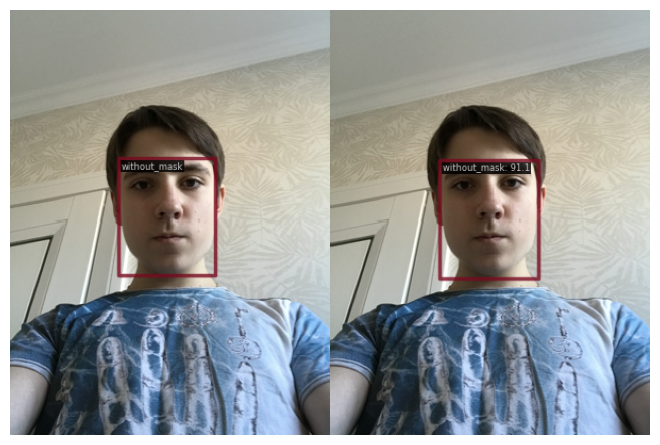

/home/eugene/anaconda3/envs/openmmlab/lib/python3.9/site-packages/mmengine/utils/manager.py:113: UserWarning: <class 'mmdet.visualization.local_visualizer.DetLocalVisualizer'> instance named of visualizer has been created, the method `get_instance` should not accept any other arguments
  warnings.warn(


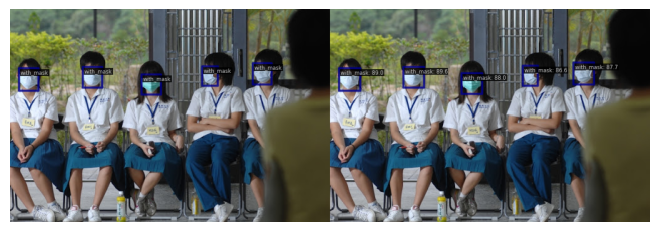

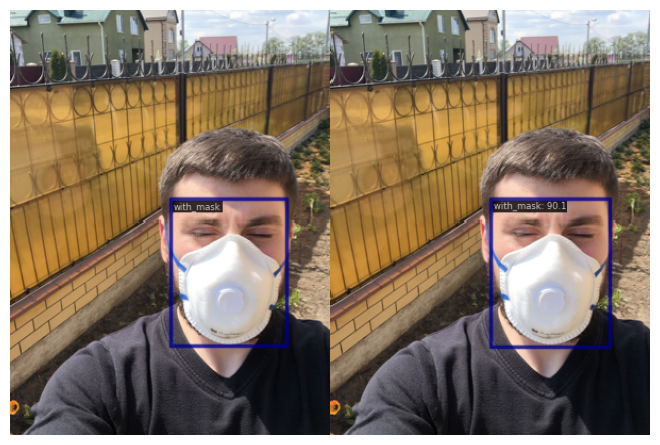

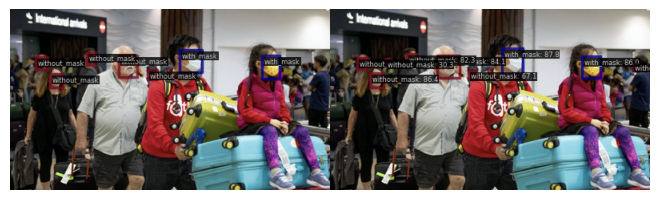

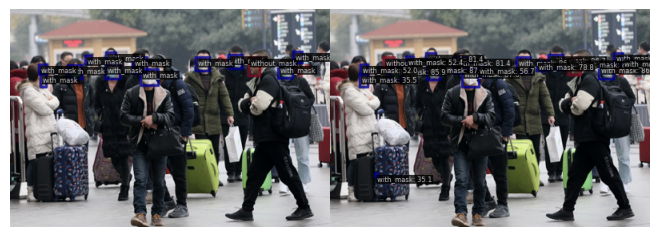

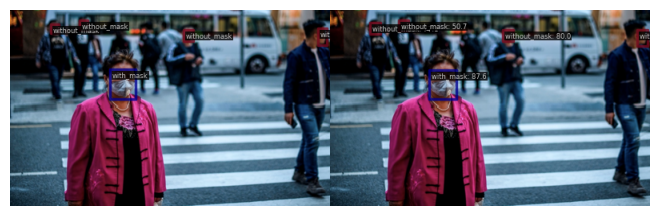

...

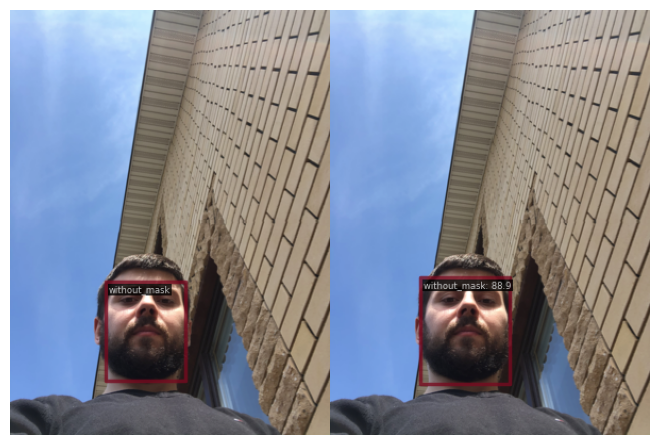

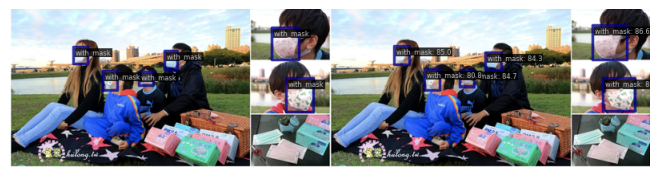

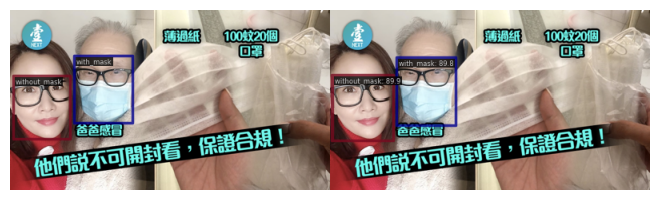

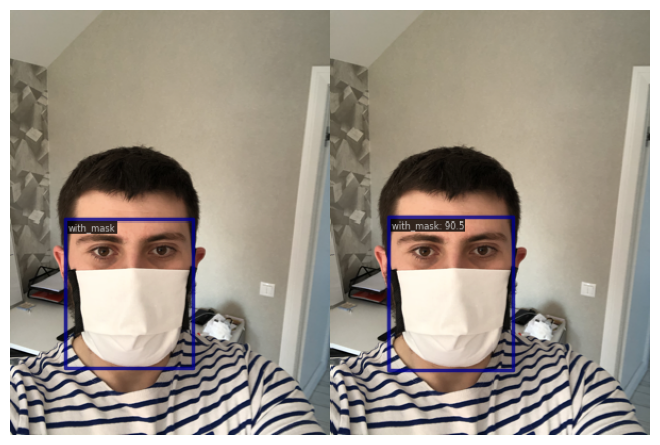

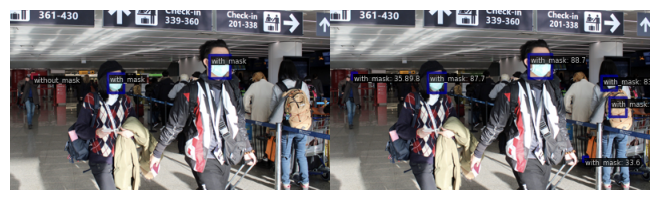

/home/eugene/anaconda3/envs/openmmlab/lib/python3.9/site-packages/mmengine/visualization/visualizer.py:757: UserWarning: Warning: The bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(
/home/eugene/anaconda3/envs/openmmlab/lib/python3.9/site-packages/mmengine/visualization/visualizer.py:828: UserWarning: Warning: The polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(


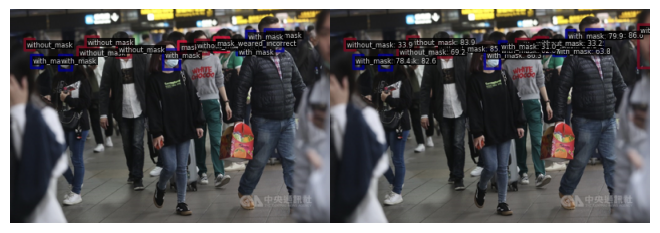

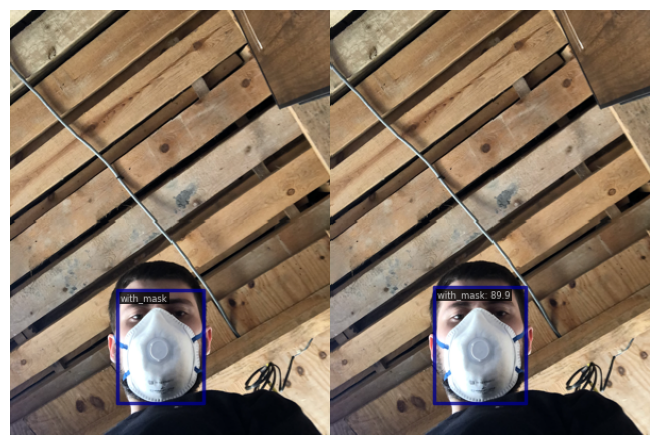

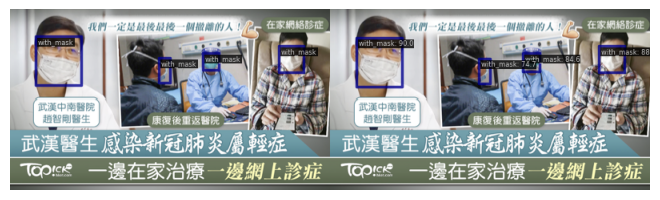

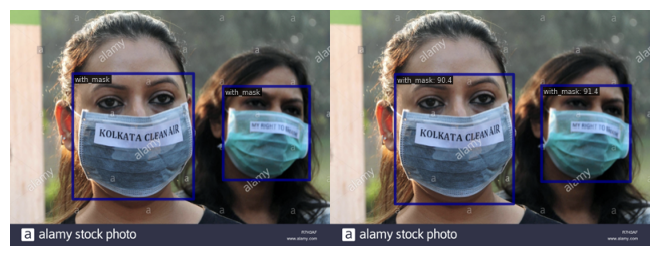

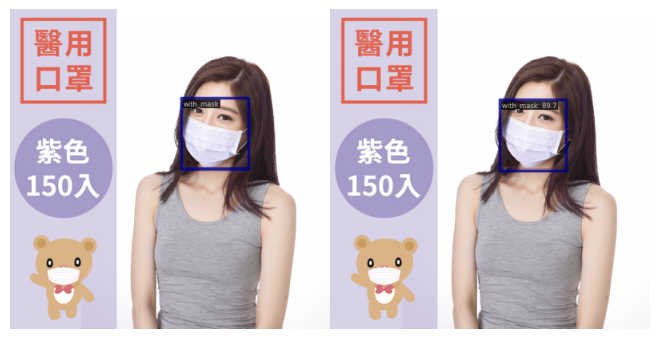

...

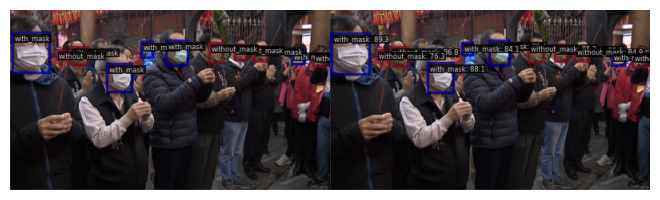

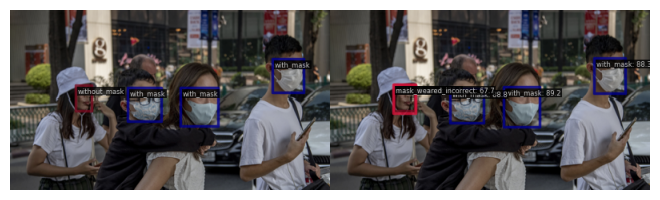

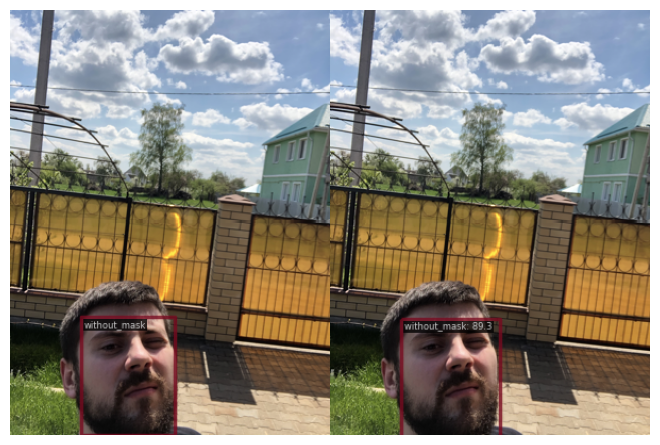

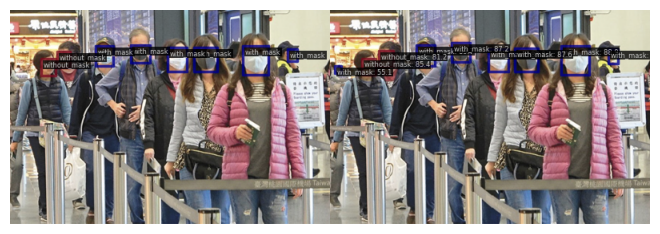

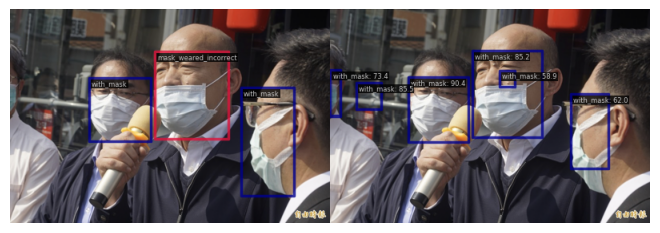

In [12]:
# визуализируем результаты
for i in results[:50]:
    visualizer = VISUALIZERS.build(model.cfg.visualizer)
    visualizer.dataset_meta = model.dataset_meta
    img = mmcv.imread(i.img_path)
    img = mmcv.imconvert(img, 'bgr', 'rgb')
    visualizer.add_datasample(
        i.img_path.split('/')[-1],
        img,
        data_sample=i,
        draw_gt=True,
        draw_pred=True,
        show=True)
    display(visualizer.show())

In [13]:
# Подоготовим данные для метрик
preds = []
targets = []
for r in results:
    res = r.pred_instances.cpu().to_dict()
    res['boxes'] = res['bboxes']
    del res['bboxes']
    preds.append(res)
    for img in data['images']:
        if img['file_name'] == r.img_path.split('/')[-1]:
            labels = []
            bboxes = []
            for a in data['annotations']:
                if a['image_id'] == img['id']:
                    labels.append(a['category_id'])
                    x, y, w, h = a['bbox']
                    bbox = [x, y, x+w, y+h]
                    bboxes.append(bbox)
            ann = {'labels': torch.tensor(labels),
                'boxes': torch.tensor(bboxes)}
            targets.append(ann)

In [15]:
# Посчитаем метрики coco
metric = MeanAveragePrecision()
metric.update(preds, targets)
YOLOXmetric = metric.compute()
YOLOXmetric

{'map': tensor(0.5819),
 'map_50': tensor(0.8595),
 'map_75': tensor(0.6954),
 'map_small': tensor(0.5176),
 'map_medium': tensor(0.7326),
 'map_large': tensor(0.8543),
 'mar_1': tensor(0.3002),
 'mar_10': tensor(0.5262),
 'mar_100': tensor(0.6314),
 'mar_small': tensor(0.5791),
 'mar_medium': tensor(0.7629),
 'mar_large': tensor(0.8625),
 'map_per_class': tensor(-1.),
 'mar_100_per_class': tensor(-1.),
 'classes': tensor([0, 1, 2], dtype=torch.int32)}

In [16]:
# Подберем порог IoU, что бы mAP был более 0.85
metric = MeanAveragePrecision(iou_thresholds=[0.55])
metric.update(preds, targets)
YoloXmetrics = metric.compute()
YoloXmetrics

/home/eugene/anaconda3/envs/openmmlab/lib/python3.9/site-packages/torchmetrics/utilities/prints.py:43: UserWarning: Encountered more than 100 detections in a single image. This means that certain detections with the lowest scores will be ignored, that may have an undesirable impact on performance. Please consider adjusting the `max_detection_threshold` to suit your use case. To disable this warning, set attribute class `warn_on_many_detections=False`, after initializing the metric.
  warnings.warn(*args, **kwargs)  # noqa: B028


{'map': tensor(0.8525),
 'map_50': tensor(-1.),
 'map_75': tensor(-1.),
 'map_small': tensor(0.8069),
 'map_medium': tensor(0.9688),
 'map_large': tensor(0.9997),
 'mar_1': tensor(0.4039),
 'mar_10': tensor(0.7310),
 'mar_100': tensor(0.9027),
 'mar_small': tensor(0.8675),
 'mar_medium': tensor(0.9791),
 'mar_large': tensor(1.),
 'map_per_class': tensor(-1.),
 'mar_100_per_class': tensor(-1.),
 'classes': tensor([0, 1, 2], dtype=torch.int32)}

### При IoU более 0.55 mAP 0.85